# IRBF

## Imports, Definitions, and loading data

In [1]:
## Critical Imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import matplotlib.patheffects as PathEffects
import cmasher as cmr

import scipy.constants as const
from scipy.stats import norm
import pandas as pd
from matplotlib.ticker import MultipleLocator, ScalarFormatter
from scipy.signal import find_peaks
from itertools import cycle

# Nested Sampling
import dynesty
import corner
import pickle
import os

#Aesthetics
import matplotlib as mpl
plt.style.use('style.mplstyle')

# My stuff
from TeraToptica import TeraFlashAnalyzer as TFA, TeraFlashConfig as TFC
from TeraToptica import TeraScanAnalyzer as TSA, TeraScanConfig as TSC

window = 'gaussian' # Smoothing window type in frequency domain
window_size  = 15 # Determines how many GHz to smooth the spectrum over (upper bound)

mask_bounds = (
              (0, 150), # mask low frequency HD30_batch2
              (545, 570), (740, 770), (1080, 1245), (1390, 1430), # mask waterlines
              (1585, 1810), (1855, 1950),
            #   (2025, 2075), (2100, 2275), (2325, 2500), (2600, 3000),
              (2000, 10000)
              )

f = np.arange(5, 2000.1, 1)

batches = {}

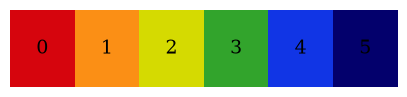

In [2]:
from cmap import Colormap
# cmap = Colormap('colorcet:CET_R1')
# cmap_array = cmap(np.linspace(0, 1, 256))

# entries = 6
# indices = np.linspace(0, len(cmap_array)-1, entries).astype(int)
# colors = cmap_array[indices][::-1]

cmap = Colormap('colorcet:CET_R4')
colors = cmap(np.linspace(0, 1, 6))

colors = colors[::-1]

# Display for visualization
large_font = 14  # font size for labels
plt.figure(figsize=(5, 1))
plt.imshow([colors], aspect='auto')

for i in range(len(colors)):  # one less because we skipped first color
    plt.annotate(i, (i, 0), color='k', fontsize=large_font, ha='center', va='center')

plt.gca().set_axis_off()

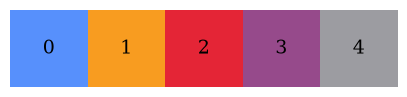

In [3]:
from cmap import Colormap
# cmap = Colormap('colorcet:CET_R1')
# cmap_array = cmap(np.linspace(0, 1, 256))

# entries = 6
# indices = np.linspace(0, len(cmap_array)-1, entries).astype(int)
# colors = cmap_array[indices][::-1]

cmap = Colormap('petroff:petroff6')
colors = cmap(np.linspace(0, 1, 6))

colors = colors[:-1]

# Display for visualization
large_font = 14  # font size for labels
plt.figure(figsize=(5, 1))
plt.imshow([colors], aspect='auto')

for i in range(len(colors)):  # one less because we skipped first color
    plt.annotate(i, (i, 0), color='k', fontsize=large_font, ha='center', va='center')

plt.gca().set_axis_off()

### Styrofoam batch
Now includes samples previously fielded in SO SATp2

In [4]:
tf_cfg = TFC(
    window=window,
    window_size=window_size,
    mask_bounds=mask_bounds,
    layout='reference_included'
)

tf_cfg2 = TFC(
    window=window,
    window_size=window_size,
    mask_bounds=mask_bounds,
    layout='separate_files'
)

path = './data/20260518/'

styro_45o3mm = TFA(path, 'satp2_site_sample4_1_45o3mm_2210-2410ps_100avgs', 'open_2210-2410ps_100avgs', config=tf_cfg2)

path = './data/20260529/'
base = 'open2_1850-2050ps_100avgs'

styro_5o6mm = TFA(path, 'SATp2_site_sample4_5o6mm_1850-2050ps_100avgs', base, config=tf_cfg2)
styro_16o9mm = TFA(path, 'SATp2_site_sample4_16o9mm_1850-2050ps_100avgs', base, config=tf_cfg2)

# path = './data/20260605/' #Check the repeatability of the thin styrofoams

# styro_0o8mm  = TFA(path, 'styro_thin1_0o8mm_1850-2050ps_100avgs', config=tf_cfg)
# styro_1o5mm  = TFA(path, 'styro_thin2_1o5mm_1850-2050ps_100avgs', config=tf_cfg)

path = './data/20260630/' #Check the repeatability of the thin styrofoams

styro_1o4mm = TFA(path, 'styro_satp2_1o4mm_1800-2000ps_100avgs', config=tf_cfg)
styro_3o0mm = TFA(path, 'styro_satp2_3o0mm_1800-2000ps_100avgs', config=tf_cfg)
styro_5o8mm = TFA(path, 'styro_satp2_5o8mm_1800-2000ps_100avgs', config=tf_cfg)
styro_6o1mm = TFA(path, 'styro_ucsd_6o1mm_1800-2000ps_100avgs', config=tf_cfg)
styro_16o2mm = TFA(path, 'styro_satp2_16o2mm_1800-2000ps_100avgs', config=tf_cfg)
styro_42o3mm = TFA(path, 'styro_ucsd_42o3mm_1800-2000ps_100avgs', config=tf_cfg)

## Frequency domain data for Styrofoam

# f_0o8mm,  t_0o8mm,  ut_0o8mm,  mask_0o8mm,  err_0o8mm,  boxnum_0o8mm  = styro_0o8mm.get_smoothed_spectra()
f_1o4mm,  t_1o4mm,  ut_1o4mm,  mask_1o4mm,  err_1o4mm,  boxnum_1o4mm  = styro_1o4mm.get_smoothed_spectra()
# f_1o5mm,  t_1o5mm,  ut_1o5mm,  mask_1o5mm,  err_1o5mm,  boxnum_1o5mm  = styro_1o5mm.get_smoothed_spectra()
f_3o0mm,  t_3o0mm,  ut_3o0mm,  mask_3o0mm,  err_3o0mm,  boxnum_3o0mm  = styro_3o0mm.get_smoothed_spectra()
f_5o6mm,  t_5o6mm,  ut_5o6mm,  mask_5o6mm,  err_5o6mm,  boxnum_5o6mm  = styro_5o6mm.get_smoothed_spectra()
f_5o8mm,  t_5o8mm,  ut_5o8mm,  mask_5o8mm,  err_5o8mm,  boxnum_5o8mm  = styro_5o8mm.get_smoothed_spectra()
f_6o1mm,  t_6o1mm,  ut_6o1mm,  mask_6o1mm,  err_6o1mm,  boxnum_6o1mm  = styro_6o1mm.get_smoothed_spectra()
f_16o2mm, t_16o2mm, ut_16o2mm, mask_16o2mm, err_16o2mm, boxnum_16o2mm = styro_16o2mm.get_smoothed_spectra()
f_16o9mm, t_16o9mm, ut_16o9mm, mask_16o9mm, err_16o9mm, boxnum_16o9mm = styro_16o9mm.get_smoothed_spectra()
f_42o3mm, t_42o3mm, ut_42o3mm, mask_42o3mm, err_42o3mm, boxnum_42o3mm = styro_42o3mm.get_smoothed_spectra()
f_45o3mm, t_45o3mm, ut_45o3mm, mask_45o3mm, err_45o3mm, boxnum_45o3mm = styro_45o3mm.get_smoothed_spectra()

## Time domain data for Styrofoam
# T_0o8mm,  pc_0o8mm  = styro_0o8mm.get_sample_pulse()
T_1o4mm,  pc_1o4mm  = styro_1o4mm.get_sample_pulse()
# T_1o5mm,  pc_1o5mm  = styro_1o5mm.get_sample_pulse()
T_3o0mm,  pc_3o0mm  = styro_3o0mm.get_sample_pulse()
T_5o6mm,  pc_5o6mm  = styro_5o6mm.get_sample_pulse()
T_5o8mm,  pc_5o8mm  = styro_5o8mm.get_sample_pulse()
T_6o1mm,  pc_6o1mm  = styro_6o1mm.get_sample_pulse()
T_16o2mm, pc_16o2mm = styro_16o2mm.get_sample_pulse()
T_16o9mm, pc_16o9mm = styro_16o9mm.get_sample_pulse()
T_42o3mm, pc_42o3mm = styro_42o3mm.get_sample_pulse()
T_45o3mm, pc_45o3mm = styro_45o3mm.get_sample_pulse()

# Phase data for Styrofoam
# theta_0o8mm,  theta_base_0o8mm  = styro_0o8mm.get_phases()
theta_1o4mm,  theta_base_1o4mm  = styro_1o4mm.get_phases()
# theta_1o5mm,  theta_base_1o5mm  = styro_1o5mm.get_phases()
theta_3o0mm,  theta_base_3o0mm  = styro_3o0mm.get_phases()
theta_5o6mm,  theta_base_5o6mm  = styro_5o6mm.get_phases()
theta_5o8mm,  theta_base_5o8mm  = styro_5o8mm.get_phases()
theta_6o1mm,  theta_base_6o1mm  = styro_6o1mm.get_phases()
theta_16o2mm, theta_base_16o2mm = styro_16o2mm.get_phases()
theta_16o9mm, theta_base_16o9mm = styro_16o9mm.get_phases()
theta_42o3mm, theta_base_42o3mm = styro_42o3mm.get_phases()
theta_45o3mm, theta_base_45o3mm = styro_45o3mm.get_phases()

Styrofoam_batch = {}

# Styrofoam_batch["Styrofoam 0.08 cm"] = {'f': f_0o8mm,  't': t_0o8mm,  'ut': ut_0o8mm,  'mask': mask_0o8mm,  'err': err_0o8mm,  'boxnum': boxnum_0o8mm,  'T': T_0o8mm,  'pc': pc_0o8mm,  'theta': theta_0o8mm,  'theta_base': theta_base_0o8mm,  'width': 0.08}
Styrofoam_batch["Styrofoam 0.14 cm"] = {'f': f_1o4mm,  't': t_1o4mm,  'ut': ut_1o4mm,  'mask': mask_1o4mm,  'err': err_1o4mm,  'boxnum': boxnum_1o4mm,  'T': T_1o4mm,  'pc': pc_1o4mm,  'theta': theta_1o4mm,  'theta_base': theta_base_1o4mm,  'width': 0.14}
# Styrofoam_batch["Styrofoam 0.15 cm"] = {'f': f_1o5mm,  't': t_1o5mm,  'ut': ut_1o5mm,  'mask': mask_1o5mm,  'err': err_1o5mm,  'boxnum': boxnum_1o5mm,  'T': T_1o5mm,  'pc': pc_1o5mm,  'theta': theta_1o5mm,  'theta_base': theta_base_1o5mm,  'width': 0.15}
Styrofoam_batch["Styrofoam 0.30 cm"] = {'f': f_3o0mm,  't': t_3o0mm,  'ut': ut_3o0mm,  'mask': mask_3o0mm,  'err': err_3o0mm,  'boxnum': boxnum_3o0mm,  'T': T_3o0mm,  'pc': pc_3o0mm,  'theta': theta_3o0mm,  'theta_base': theta_base_3o0mm,  'width': 0.30}
Styrofoam_batch["Styrofoam 0.56 cm"] = {'f': f_5o6mm,  't': t_5o6mm,  'ut': ut_5o6mm,  'mask': mask_5o6mm,  'err': err_5o6mm,  'boxnum': boxnum_5o6mm,  'T': T_5o6mm,  'pc': pc_5o6mm,  'theta': theta_5o6mm,  'theta_base': theta_base_5o6mm,  'width': 0.56}
Styrofoam_batch["Styrofoam 0.58 cm"] = {'f': f_5o8mm,  't': t_5o8mm,  'ut': ut_5o8mm,  'mask': mask_5o8mm,  'err': err_5o8mm,  'boxnum': boxnum_5o8mm,  'T': T_5o8mm,  'pc': pc_5o8mm,  'theta': theta_5o8mm,  'theta_base': theta_base_5o8mm,  'width': 0.58}
Styrofoam_batch["Styrofoam 0.61 cm"] = {'f': f_6o1mm,  't': t_6o1mm,  'ut': ut_6o1mm,  'mask': mask_6o1mm,  'err': err_6o1mm,  'boxnum': boxnum_6o1mm,  'T': T_6o1mm,  'pc': pc_6o1mm,  'theta': theta_6o1mm,  'theta_base': theta_base_6o1mm,  'width': 0.61}
Styrofoam_batch["Styrofoam 1.62 cm"] = {'f': f_16o2mm, 't': t_16o2mm, 'ut': ut_16o2mm, 'mask': mask_16o2mm, 'err': err_16o2mm, 'boxnum': boxnum_16o2mm, 'T': T_16o2mm, 'pc': pc_16o2mm, 'theta': theta_16o2mm, 'theta_base': theta_base_16o2mm, 'width': 1.62}
Styrofoam_batch["Styrofoam 1.69 cm"] = {'f': f_16o9mm, 't': t_16o9mm, 'ut': ut_16o9mm, 'mask': mask_16o9mm, 'err': err_16o9mm, 'boxnum': boxnum_16o9mm, 'T': T_16o9mm, 'pc': pc_16o9mm, 'theta': theta_16o9mm, 'theta_base': theta_base_16o9mm, 'width': 1.69}
Styrofoam_batch["Styrofoam 4.23 cm"] = {'f': f_42o3mm, 't': t_42o3mm, 'ut': ut_42o3mm, 'mask': mask_42o3mm, 'err': err_42o3mm, 'boxnum': boxnum_42o3mm, 'T': T_42o3mm, 'pc': pc_42o3mm, 'theta': theta_42o3mm, 'theta_base': theta_base_42o3mm, 'width': 4.23}
Styrofoam_batch["Styrofoam 4.53 cm"] = {'f': f_45o3mm, 't': t_45o3mm, 'ut': ut_45o3mm, 'mask': mask_45o3mm, 'err': err_45o3mm, 'boxnum': boxnum_45o3mm, 'T': T_45o3mm, 'pc': pc_45o3mm, 'theta': theta_45o3mm, 'theta_base': theta_base_45o3mm, 'width': 4.53}

batches['Styrofoam_batch1'] = Styrofoam_batch

### HD30_batch1

In [5]:
# TeraFlashAnalyzer Instances for HD30_batch1
path = './data/20251216/'
penn_3o47mm    = TFA(path, 'HD30_1x0o125in_3o47mm_penn_1675-1875ps_100avgs', config=tf_cfg)

path = './data/20260212'
penn_6o51mm  = TFA(path, 'hd30_penn_6o51mm_1400-1600ps_100avgs', config=tf_cfg) # 2x1/8"
penn_27o6mm  = TFA(path, 'hd30_penn_27o60mm_1400-1600ps_100avgs', config=tf_cfg) # 8x1/8"
penn_30o94mm = TFA(path, 'hd30_penn_30o94mm_1400-1600ps_100avgs', config=tf_cfg) # 10x1/8

# Frequency domain data for HD30_batch1
f_3o47mm,  t_3o47mm,  ut_3o47mm,  mask_3o47mm,  err_3o47mm,  boxnum_3o47mm  = penn_3o47mm.get_smoothed_spectra()
f_6o51mm,  t_6o51mm,  ut_6o51mm,  mask_6o51mm,  err_6o51mm,  boxnum_6o51mm  = penn_6o51mm.get_smoothed_spectra()
f_27o6mm,  t_27o6mm,  ut_27o6mm,  mask_27o6mm,  err_27o6mm,  boxnum_27o6mm  = penn_27o6mm.get_smoothed_spectra()
f_30o94mm, t_30o94mm, ut_30o94mm, mask_30o94mm, err_30o94mm, boxnum_30o94mm = penn_30o94mm.get_smoothed_spectra()

# Time domain data for HD30_batch1
T_3o47mm,  pc_3o47mm  = penn_3o47mm.get_sample_pulse()
T_6o51mm,  pc_6o51mm  = penn_6o51mm.get_sample_pulse()
T_27o6mm,  pc_27o6mm  = penn_27o6mm.get_sample_pulse()
T_30o94mm, pc_30o94mm = penn_30o94mm.get_sample_pulse()

# Phase data for HD30_batch1
theta_3o47mm,  theta_base_3o47mm  = penn_3o47mm.get_phases()
theta_6o51mm,  theta_base_6o51mm  = penn_6o51mm.get_phases()
theta_27o6mm,  theta_base_27o6mm  = penn_27o6mm.get_phases()
theta_30o94mm, theta_base_30o94mm = penn_30o94mm.get_phases()

HD30_batch1 = {}
HD30_batch1['HD30 batch1 0.35 cm'] = {'f': f_3o47mm,  't': t_3o47mm,  'ut': ut_3o47mm,  'mask': mask_3o47mm,  'err': err_3o47mm,  'boxnum': boxnum_3o47mm,  'T': T_3o47mm,  'pc': pc_3o47mm,  'theta_base': theta_base_3o47mm,  'theta': theta_3o47mm,  'width': 0.347}
HD30_batch1['HD30 batch1 0.65 cm'] = {'f': f_6o51mm,  't': t_6o51mm,  'ut': ut_6o51mm,  'mask': mask_6o51mm,  'err': err_6o51mm,  'boxnum': boxnum_6o51mm,  'T': T_6o51mm,  'pc': pc_6o51mm,  'theta_base': theta_base_6o51mm,  'theta': theta_6o51mm,  'width': 0.651}
HD30_batch1['HD30 batch1 2.76 cm'] = {'f': f_27o6mm,  't': t_27o6mm,  'ut': ut_27o6mm,  'mask': mask_27o6mm,  'err': err_27o6mm,  'boxnum': boxnum_27o6mm,  'T': T_27o6mm,  'pc': pc_27o6mm,  'theta_base': theta_base_27o6mm,  'theta': theta_27o6mm,  'width': 2.76}
HD30_batch1['HD30 batch1 3.09 cm'] = {'f': f_30o94mm, 't': t_30o94mm, 'ut': ut_30o94mm, 'mask': mask_30o94mm, 'err': err_30o94mm, 'boxnum': boxnum_30o94mm, 'T': T_30o94mm, 'pc': pc_30o94mm, 'theta_base': theta_base_30o94mm, 'theta': theta_30o94mm, 'width': 3.094}

batches['HD30_batch1'] = HD30_batch1

### HD30_batch2

In [6]:
path = './data/20251216/'

## TeraFlashAnalyzer Instances for HD30_batch2
cornell_3o65mm = TFA(path, 'hd30_1x0o125in_3o65mm_cornell_1675-1875ps_100avgs', config = tf_cfg)
cornell_7o3mm  = TFA(path, 'hd30_2x0o125in_7o3mm_cornell_1675-1875ps_100avgs',  config = tf_cfg)
cornell_25o4mm = TFA(path, 'hd30_1x1in_25o4mm_cornell2_1675-1875ps_100avgs',    config = tf_cfg)

## Frequency domain data for HD30_batch2
f_3o65mm, t_3o65mm,  ut_3o65mm,  mask_3o65mm,  err_3o65mm,  boxnum_3o65mm  = cornell_3o65mm.get_smoothed_spectra()
f_7o3mm,  t_7o3mm,   ut_7o3mm,   mask_7o3mm,   err_7o3mm,   boxnum_7o3mm   = cornell_7o3mm.get_smoothed_spectra()
f_25o4mm, t_25o4mm,  ut_25o4mm,  mask_25o4mm,  err_25o4mm,  boxnum_25o4mm  = cornell_25o4mm.get_smoothed_spectra()

## Time domain data for HD30_batch2
T_3o65mm,  pc_3o65mm  = cornell_3o65mm.get_sample_pulse()
T_7o3mm,   pc_7o3mm   = cornell_7o3mm.get_sample_pulse()
T_25o4mm,  pc_25o4mm  = cornell_25o4mm.get_sample_pulse()

## Phase data for HD30_batch2
theta_3o65mm, theta_base_3o65mm = cornell_3o65mm.get_phases()
theta_7o3mm,  theta_base_7o3mm  = cornell_7o3mm.get_phases()
theta_25o4mm, theta_base_25o4mm = cornell_25o4mm.get_phases()

HD30_batch2 = {}

HD30_batch2['HD30 batch2 0.37 cm'] = {'f': f_3o65mm, 't': t_3o65mm, 'ut': ut_3o65mm, 'mask': mask_3o65mm, 'err': err_3o65mm, 'boxnum': boxnum_3o65mm, 'T': T_3o65mm, 'pc': pc_3o65mm, 'theta_base': theta_base_3o65mm, 'theta': theta_3o65mm, 'width': 0.365}
HD30_batch2['HD30 batch2 0.73 cm'] = {'f': f_7o3mm,  't': t_7o3mm,  'ut': ut_7o3mm,  'mask': mask_7o3mm,  'err': err_7o3mm,  'boxnum': boxnum_7o3mm,  'T': T_7o3mm,  'pc': pc_7o3mm,  'theta_base': theta_base_7o3mm,  'theta': theta_7o3mm,  'width': 0.73}
HD30_batch2['HD30 batch2 2.54 cm'] = {'f': f_25o4mm, 't': t_25o4mm, 'ut': ut_25o4mm, 'mask': mask_25o4mm, 'err': err_25o4mm, 'boxnum': boxnum_25o4mm, 'T': T_25o4mm, 'pc': pc_25o4mm, 'theta_base': theta_base_25o4mm, 'theta': theta_25o4mm, 'width': 2.54}

batches['HD30_batch2'] = HD30_batch2

### HD30_batch3
Deployed for ASO

In [7]:
path = './data/20251216/'

site_3o58mm    = TFA(path, 'HD30_1x0o125in_3o58mm_site_1675-1875ps_100avgs',  config=tf_cfg)
site_7o18mm    = TFA(path, 'HD30_2x0o125in_7o18mm_site_1675-1875ps_100avgs',  config=tf_cfg)
site_10o86mm   = TFA(path, 'HD30_3x0o125in_10o86mm_site_1675-1875ps_100avgs', config=tf_cfg)
site_25o4mm    = TFA(path, 'HD30_1x1in_25o4mm_site_1675-1875ps_100avgs',      config=tf_cfg)
site_50o9mm    = TFA(path, 'HD30_2x1in_50o9mm_site_1675-1875ps_100avgs',      config=tf_cfg)

## Frequency domain data for HD30_batch3 
f_3o58mm,  t_3o58mm,  ut_3o58mm,  mask_3o58mm,  err_3o58mm,  boxnum_3o58mm  = site_3o58mm.get_smoothed_spectra()
f_7o18mm,  t_7o18mm,  ut_7o18mm,  mask_7o18mm,  err_7o18mm,  boxnum_7o18mm  = site_7o18mm.get_smoothed_spectra()
f_10o86mm, t_10o86mm, ut_10o86mm, mask_10o86mm, err_10o86mm, boxnum_10o86mm = site_10o86mm.get_smoothed_spectra()
f_25o4mm,  t_25o4mm,  ut_25o4mm,  mask_25o4mm,  err_25o4mm,  boxnum_25o4mm  = site_25o4mm.get_smoothed_spectra()
f_50o9mm,  t_50o9mm,  ut_50o9mm,  mask_50o9mm,  err_50o9mm,  boxnum_50o9mm  = site_50o9mm.get_smoothed_spectra()

## Time domain data for HD30_batch3 
T_3o58mm,  pc_3o58mm  = site_3o58mm.get_sample_pulse()
T_7o18mm,  pc_7o18mm  = site_7o18mm.get_sample_pulse()
T_10o86mm, pc_10o86mm = site_10o86mm.get_sample_pulse()
T_25o4mm,  pc_25o4mm  = site_25o4mm.get_sample_pulse()
T_50o9mm,  pc_50o9mm  = site_50o9mm.get_sample_pulse()

# Phase HD30_batch3
theta_3o58mm, theta_base_3o58mm   = site_3o58mm.get_phases()
theta_7o18mm, theta_base_7o18mm   = site_7o18mm.get_phases()
theta_10o86mm, theta_base_10o86mm = site_10o86mm.get_phases()
theta_25o4mm, theta_base_25o4mm   = site_25o4mm.get_phases()
theta_50o9mm, theta_base_50o9mm   = site_50o9mm.get_phases()

HD30_batch3 = {}

HD30_batch3['HD30 batch3 0.36 cm'] = {'f': f_3o58mm,  't': t_3o58mm,  'ut': ut_3o58mm,  'mask': mask_3o58mm,  'err': err_3o58mm,  'boxnum': boxnum_3o58mm,  'T': T_3o58mm,  'pc': pc_3o58mm,  'theta': theta_3o58mm,  'theta_base': theta_base_3o58mm,  'width': 0.358}
HD30_batch3['HD30 batch3 0.72 cm'] = {'f': f_7o18mm,  't': t_7o18mm,  'ut': ut_7o18mm,  'mask': mask_7o18mm,  'err': err_7o18mm,  'boxnum': boxnum_7o18mm,  'T': T_7o18mm,  'pc': pc_7o18mm,  'theta': theta_7o18mm,  'theta_base': theta_base_7o18mm,  'width': 0.718}
HD30_batch3['HD30 batch3 1.09 cm'] = {'f': f_10o86mm, 't': t_10o86mm, 'ut': ut_10o86mm, 'mask': mask_10o86mm, 'err': err_10o86mm, 'boxnum': boxnum_10o86mm, 'T': T_10o86mm, 'pc': pc_10o86mm, 'theta': theta_10o86mm, 'theta_base': theta_base_10o86mm, 'width': 1.086}
HD30_batch3['HD30 batch3 2.54 cm'] = {'f': f_25o4mm,  't': t_25o4mm,  'ut': ut_25o4mm,  'mask': mask_25o4mm,  'err': err_25o4mm,  'boxnum': boxnum_25o4mm,  'T': T_25o4mm,  'pc': pc_25o4mm,  'theta': theta_25o4mm,  'theta_base': theta_base_25o4mm,  'width': 2.54}
HD30_batch3['HD30 batch3 5.09 cm'] = {'f': f_50o9mm,  't': t_50o9mm,  'ut': ut_50o9mm,  'mask': mask_50o9mm,  'err': err_50o9mm,  'boxnum': boxnum_50o9mm,  'T': T_50o9mm,  'pc': pc_50o9mm,  'theta': theta_50o9mm,  'theta_base': theta_base_50o9mm,  'width': 5.09}

batches['HD30_batch3'] = HD30_batch3

### Alternative Zotefoams
Lower and higher density formulations suggested and sourced by Cornell

In [8]:
path = './data/20251117/' #Path to the data directory

# Mask diffuse scatter regions in HD foams
mask_bounds_HD80 = ((0, 150), (545, 570), (740, 770), (1080, 1245), (1390, 10000))
mask_bounds_HD110 = ((0, 150), (500, 10000))

tf_cfg_HD80  = TFC(window=window, window_size=window_size, mask_bounds=mask_bounds_HD80,  layout='reference_included')
tf_cfg_HD110 = TFC(window=window, window_size=window_size, mask_bounds=mask_bounds_HD110, layout='reference_included')

LD15_1in  = TFA(path, 'LD15_1590-1790ps_1000avgs',  config=tf_cfg)
LD24_1in  = TFA(path, 'LD24_1590-1790ps_1000avgs',  config=tf_cfg)
HD80_1in  = TFA(path, 'HD80_1590-1790ps_1000avgs',  config=tf_cfg_HD80)
HD110_1in = TFA(path, 'HD110_1590-1790ps_1000avgs', config=tf_cfg_HD110)

path = './data/cornell/'

# We use a legacy TeraScan measurement for HD60, HD60 was firmly rejected before the TeraFlash was installed.
HD60_1in  = TSA(path,   
                'TestData_2050225_Zotefoam_HD60_0p8in_300K_Sample_100to1000GHz_Step200MHz_Scan_0001.dat',  
                'TestData_2050225_Zotefoam_HD60_0p8in_300K_ClrBg_100to1000GHz_Step200MHz_Scan_0001.dat',
                config=TSC(window=window, window_size=window_size, mask_bounds=mask_bounds, fiber_stretcher=True))

path = './data/20260630/'

LD15_UT_3o0mm  = TFA(path, 'LD15_batch2_3o0mm_1800-2000ps_100avgs',  config=tf_cfg)
LD15_UT_6o0mm  = TFA(path, 'LD15_batch2_6o0mm_1800-2000ps_100avgs',  config=tf_cfg)
LD15_UT_8o9mm  = TFA(path, 'LD15_batch2_8o9mm_1800-2000ps_100avgs',  config=tf_cfg)
LD24_UT_3o1mm  = TFA(path, 'LD24_batch2_3o1mm_1800-2000ps_100avgs',  config=tf_cfg)
LD24_UT_6o3mm  = TFA(path, 'LD24_batch2_6o3mm_1800-2000ps_100avgs',  config=tf_cfg)
LD24_UT_9o4mm  = TFA(path, 'LD24_batch2_9o4mm_1800-2000ps_100avgs',  config=tf_cfg)
LD24_UT_12o5mm = TFA(path, 'LD24_batch2_12o5mm_1800-2000ps_100avgs', config=tf_cfg)

path = './data/20260718/'

LD24_cornell_3o6mm  = TFA(path, 'LD24_cornell_3o60mm_1800-2000ps_100avgs',  config=tf_cfg)
LD24_cornell_7o2mm  = TFA(path, 'LD24_cornell_7o21mm_1800-2000ps_100avgs',  config=tf_cfg)
LD24_cornell_10o9mm = TFA(path, 'LD24_cornell_10o87mm_1800-2000ps_100avgs', config=tf_cfg)
LD24_cornell_14o5mm = TFA(path, 'LD24_cornell_14o51mm_1800-2000ps_100avgs', config=tf_cfg)
LD24_cornell_18o1mm = TFA(path, 'LD24_cornell_18o13mm_1800-2000ps_100avgs', config=tf_cfg)
LD24_cornell_21o7mm = TFA(path, 'LD24_cornell_21o72mm_1800-2000ps_100avgs', config=tf_cfg)

HD80_3o49mm         = TFA(path, 'HD80_3o49mm_1800-2000ps_100avgs',  config=tf_cfg_HD80)
HD80_7o08mm         = TFA(path, 'HD80_7o08mm_1800-2000ps_100avgs',  config=tf_cfg_HD80)
HD80_10o62mm        = TFA(path, 'HD80_10o62mm_1800-2000ps_100avgs', config=tf_cfg_HD80)
HD80_14o24mm        = TFA(path, 'HD80_14o24mm_1800-2000ps_100avgs', config=tf_cfg_HD80)
HD80_17o79mm        = TFA(path, 'HD80_17o79mm_1800-2000ps_100avgs', config=tf_cfg_HD80)
HD80_21o35mm        = TFA(path, 'HD80_21o35mm_1800-2000ps_100avgs', config=tf_cfg_HD80)

HD110_2o99mm        = TFA(path, 'HD110_2o99mm_1800-2000ps_100avgs',  config=tf_cfg_HD110)
HD110_5o99mm        = TFA(path, 'HD110_5o99mm_1800-2000ps_100avgs',  config=tf_cfg_HD110)
HD110_8o97mm        = TFA(path, 'HD110_8o97mm_1800-2000ps_100avgs',  config=tf_cfg_HD110)
HD110_11o96mm       = TFA(path, 'HD110_11o96mm_1800-2000ps_100avgs', config=tf_cfg_HD110)


## Frequency-domain data
f_LD15,      t_LD15,      ut_LD15,      mask_LD15,      err_LD15,      boxnum_LD15     = LD15_1in.get_smoothed_spectra()
f_LD24,      t_LD24,      ut_LD24,      mask_LD24,      err_LD24,      boxnum_LD24     = LD24_1in.get_smoothed_spectra()
f_HD60,      t_HD60,      ut_HD60,      mask_HD60,      err_HD60,      boxnum_HD60     = HD60_1in.get_smoothed_spectra()
f_HD80,      t_HD80,      ut_HD80,      mask_HD80,      err_HD80,      boxnum_HD80     = HD80_1in.get_smoothed_spectra()
f_HD110,     t_HD110,     ut_HD110,     mask_HD110,     err_HD110,     boxnum_HD110    = HD110_1in.get_smoothed_spectra()

f_LD15_UT_3o0mm,  t_LD15_UT_3o0mm,  ut_LD15_UT_3o0mm,  mask_LD15_UT_3o0mm,  err_LD15_UT_3o0mm,  boxnum_LD15_UT_3o0mm  = LD15_UT_3o0mm.get_smoothed_spectra()
f_LD15_UT_6o0mm,  t_LD15_UT_6o0mm,  ut_LD15_UT_6o0mm,  mask_LD15_UT_6o0mm,  err_LD15_UT_6o0mm,  boxnum_LD15_UT_6o0mm  = LD15_UT_6o0mm.get_smoothed_spectra()
f_LD15_UT_8o9mm,  t_LD15_UT_8o9mm,  ut_LD15_UT_8o9mm,  mask_LD15_UT_8o9mm,  err_LD15_UT_8o9mm,  boxnum_LD15_UT_8o9mm  = LD15_UT_8o9mm.get_smoothed_spectra()
f_LD24_UT_3o1mm,  t_LD24_UT_3o1mm,  ut_LD24_UT_3o1mm,  mask_LD24_UT_3o1mm,  err_LD24_UT_3o1mm,  boxnum_LD24_UT_3o1mm  = LD24_UT_3o1mm.get_smoothed_spectra()
f_LD24_UT_6o3mm,  t_LD24_UT_6o3mm,  ut_LD24_UT_6o3mm,  mask_LD24_UT_6o3mm,  err_LD24_UT_6o3mm,  boxnum_LD24_UT_6o3mm  = LD24_UT_6o3mm.get_smoothed_spectra()
f_LD24_UT_9o4mm,  t_LD24_UT_9o4mm,  ut_LD24_UT_9o4mm,  mask_LD24_UT_9o4mm,  err_LD24_UT_9o4mm,  boxnum_LD24_UT_9o4mm  = LD24_UT_9o4mm.get_smoothed_spectra()
f_LD24_UT_12o5mm, t_LD24_UT_12o5mm, ut_LD24_UT_12o5mm, mask_LD24_UT_12o5mm, err_LD24_UT_12o5mm, boxnum_LD24_UT_12o5mm = LD24_UT_12o5mm.get_smoothed_spectra()

f_LD24_cornell_3o6mm,  t_LD24_cornell_3o6mm,  ut_LD24_cornell_3o6mm,  mask_LD24_cornell_3o6mm,  err_LD24_cornell_3o6mm,  boxnum_LD24_cornell_3o6mm  = LD24_cornell_3o6mm.get_smoothed_spectra()
f_LD24_cornell_7o2mm,  t_LD24_cornell_7o2mm,  ut_LD24_cornell_7o2mm,  mask_LD24_cornell_7o2mm,  err_LD24_cornell_7o2mm,  boxnum_LD24_cornell_7o2mm  = LD24_cornell_7o2mm.get_smoothed_spectra()
f_LD24_cornell_10o9mm, t_LD24_cornell_10o9mm, ut_LD24_cornell_10o9mm, mask_LD24_cornell_10o9mm, err_LD24_cornell_10o9mm, boxnum_LD24_cornell_10o9mm = LD24_cornell_10o9mm.get_smoothed_spectra()
f_LD24_cornell_14o5mm, t_LD24_cornell_14o5mm, ut_LD24_cornell_14o5mm, mask_LD24_cornell_14o5mm, err_LD24_cornell_14o5mm, boxnum_LD24_cornell_14o5mm = LD24_cornell_14o5mm.get_smoothed_spectra()
f_LD24_cornell_18o1mm, t_LD24_cornell_18o1mm, ut_LD24_cornell_18o1mm, mask_LD24_cornell_18o1mm, err_LD24_cornell_18o1mm, boxnum_LD24_cornell_18o1mm = LD24_cornell_18o1mm.get_smoothed_spectra()
f_LD24_cornell_21o7mm, t_LD24_cornell_21o7mm, ut_LD24_cornell_21o7mm, mask_LD24_cornell_21o7mm, err_LD24_cornell_21o7mm, boxnum_LD24_cornell_21o7mm = LD24_cornell_21o7mm.get_smoothed_spectra()

f_HD80_3o49mm,  t_HD80_3o49mm,  ut_HD80_3o49mm,  mask_HD80_3o49mm,  err_HD80_3o49mm,  boxnum_HD80_3o49mm  = HD80_3o49mm.get_smoothed_spectra()
f_HD80_7o08mm,  t_HD80_7o08mm,  ut_HD80_7o08mm,  mask_HD80_7o08mm,  err_HD80_7o08mm,  boxnum_HD80_7o08mm  = HD80_7o08mm.get_smoothed_spectra()
f_HD80_10o62mm, t_HD80_10o62mm, ut_HD80_10o62mm, mask_HD80_10o62mm, err_HD80_10o62mm, boxnum_HD80_10o62mm = HD80_10o62mm.get_smoothed_spectra()
f_HD80_14o24mm, t_HD80_14o24mm, ut_HD80_14o24mm, mask_HD80_14o24mm, err_HD80_14o24mm, boxnum_HD80_14o24mm = HD80_14o24mm.get_smoothed_spectra()
f_HD80_17o79mm, t_HD80_17o79mm, ut_HD80_17o79mm, mask_HD80_17o79mm, err_HD80_17o79mm, boxnum_HD80_17o79mm = HD80_17o79mm.get_smoothed_spectra()
f_HD80_21o35mm, t_HD80_21o35mm, ut_HD80_21o35mm, mask_HD80_21o35mm, err_HD80_21o35mm, boxnum_HD80_21o35mm = HD80_21o35mm.get_smoothed_spectra()

f_HD110_2o99mm,  t_HD110_2o99mm,  ut_HD110_2o99mm,  mask_HD110_2o99mm,  err_HD110_2o99mm,  boxnum_HD110_2o99mm  = HD110_2o99mm.get_smoothed_spectra()
f_HD110_5o99mm,  t_HD110_5o99mm,  ut_HD110_5o99mm,  mask_HD110_5o99mm,  err_HD110_5o99mm,  boxnum_HD110_5o99mm  = HD110_5o99mm.get_smoothed_spectra()
f_HD110_8o97mm,  t_HD110_8o97mm,  ut_HD110_8o97mm,  mask_HD110_8o97mm,  err_HD110_8o97mm,  boxnum_HD110_8o97mm  = HD110_8o97mm.get_smoothed_spectra()
f_HD110_11o96mm, t_HD110_11o96mm, ut_HD110_11o96mm, mask_HD110_11o96mm, err_HD110_11o96mm, boxnum_HD110_11o96mm = HD110_11o96mm.get_smoothed_spectra()

## Time-domain data
T_LD15,     pc_LD15       = LD15_1in.get_sample_pulse()
T_LD24,     pc_LD24       = LD24_1in.get_sample_pulse()
T_HD80,     pc_HD80       = HD80_1in.get_sample_pulse()
T_HD110,    pc_HD110      = HD110_1in.get_sample_pulse()

T_LD15_UT_3o0mm,  pc_LD15_UT_3o0mm  = LD15_UT_3o0mm.get_sample_pulse()
T_LD15_UT_6o0mm,  pc_LD15_UT_6o0mm  = LD15_UT_6o0mm.get_sample_pulse()
T_LD15_UT_8o9mm,  pc_LD15_UT_8o9mm  = LD15_UT_8o9mm.get_sample_pulse()
T_LD24_UT_3o1mm,  pc_LD24_UT_3o1mm  = LD24_UT_3o1mm.get_sample_pulse()
T_LD24_UT_6o3mm,  pc_LD24_UT_6o3mm  = LD24_UT_6o3mm.get_sample_pulse()
T_LD24_UT_9o4mm,  pc_LD24_UT_9o4mm  = LD24_UT_9o4mm.get_sample_pulse()
T_LD24_UT_12o5mm, pc_LD24_UT_12o5mm = LD24_UT_12o5mm.get_sample_pulse()

T_LD24_cornell_3o6mm,  pc_LD24_cornell_3o6mm  = LD24_cornell_3o6mm.get_sample_pulse()
T_LD24_cornell_7o2mm,  pc_LD24_cornell_7o2mm  = LD24_cornell_7o2mm.get_sample_pulse()
T_LD24_cornell_10o9mm, pc_LD24_cornell_10o9mm = LD24_cornell_10o9mm.get_sample_pulse()
T_LD24_cornell_14o5mm, pc_LD24_cornell_14o5mm = LD24_cornell_14o5mm.get_sample_pulse()
T_LD24_cornell_18o1mm, pc_LD24_cornell_18o1mm = LD24_cornell_18o1mm.get_sample_pulse()
T_LD24_cornell_21o7mm, pc_LD24_cornell_21o7mm = LD24_cornell_21o7mm.get_sample_pulse()

T_HD80_3o49mm,  pc_HD80_3o49mm  = HD80_3o49mm.get_sample_pulse()
T_HD80_7o08mm,  pc_HD80_7o08mm  = HD80_7o08mm.get_sample_pulse()
T_HD80_10o62mm, pc_HD80_10o62mm = HD80_10o62mm.get_sample_pulse()
T_HD80_14o24mm, pc_HD80_14o24mm = HD80_14o24mm.get_sample_pulse()
T_HD80_17o79mm, pc_HD80_17o79mm = HD80_17o79mm.get_sample_pulse()
T_HD80_21o35mm, pc_HD80_21o35mm = HD80_21o35mm.get_sample_pulse()

T_HD110_2o99mm,  pc_HD110_2o99mm  = HD110_2o99mm.get_sample_pulse()
T_HD110_5o99mm,  pc_HD110_5o99mm  = HD110_5o99mm.get_sample_pulse()
T_HD110_8o97mm,  pc_HD110_8o97mm  = HD110_8o97mm.get_sample_pulse()
T_HD110_11o96mm, pc_HD110_11o96mm = HD110_11o96mm.get_sample_pulse()

##Phase data
theta_LD15,  theta_base_LD15  = LD15_1in.get_phases()
theta_LD24,  theta_base_LD24  = LD24_1in.get_phases()
theta_HD60,  theta_base_HD60  = HD60_1in.get_phases()
theta_HD80,  theta_base_HD80  = HD80_1in.get_phases()
theta_HD110, theta_base_HD110 = HD110_1in.get_phases()
theta_LD15_UT_3o0mm,  theta_base_LD15_UT_3o0mm  = LD15_UT_3o0mm.get_phases()
theta_LD15_UT_6o0mm,  theta_base_LD15_UT_6o0mm  = LD15_UT_6o0mm.get_phases()
theta_LD15_UT_8o9mm,  theta_base_LD15_UT_8o9mm  = LD15_UT_8o9mm.get_phases()
theta_LD24_UT_3o1mm,  theta_base_LD24_UT_3o1mm  = LD24_UT_3o1mm.get_phases()
theta_LD24_UT_6o3mm,  theta_base_LD24_UT_6o3mm  = LD24_UT_6o3mm.get_phases()
theta_LD24_UT_9o4mm,  theta_base_LD24_UT_9o4mm  = LD24_UT_9o4mm.get_phases()
theta_LD24_UT_12o5mm, theta_base_LD24_UT_12o5mm = LD24_UT_12o5mm.get_phases()

theta_LD24_cornell_3o6mm,  theta_base_LD24_cornell_3o6mm  = LD24_cornell_3o6mm.get_phases()
theta_LD24_cornell_7o2mm,  theta_base_LD24_cornell_7o2mm  = LD24_cornell_7o2mm.get_phases()
theta_LD24_cornell_10o9mm, theta_base_LD24_cornell_10o9mm = LD24_cornell_10o9mm.get_phases()
theta_LD24_cornell_14o5mm, theta_base_LD24_cornell_14o5mm = LD24_cornell_14o5mm.get_phases()
theta_LD24_cornell_18o1mm, theta_base_LD24_cornell_18o1mm = LD24_cornell_18o1mm.get_phases()
theta_LD24_cornell_21o7mm, theta_base_LD24_cornell_21o7mm = LD24_cornell_21o7mm.get_phases()

theta_HD80_3o49mm,  theta_base_HD80_3o49mm  = HD80_3o49mm.get_phases()
theta_HD80_7o08mm,  theta_base_HD80_7o08mm  = HD80_7o08mm.get_phases()
theta_HD80_10o62mm, theta_base_HD80_10o62mm = HD80_10o62mm.get_phases()
theta_HD80_14o24mm, theta_base_HD80_14o24mm = HD80_14o24mm.get_phases()
theta_HD80_17o79mm, theta_base_HD80_17o79mm = HD80_17o79mm.get_phases()
theta_HD80_21o35mm, theta_base_HD80_21o35mm = HD80_21o35mm.get_phases()

theta_HD110_2o99mm,  theta_base_HD110_2o99mm  = HD110_2o99mm.get_phases()
theta_HD110_5o99mm,  theta_base_HD110_5o99mm  = HD110_5o99mm.get_phases()
theta_HD110_8o97mm,  theta_base_HD110_8o97mm  = HD110_8o97mm.get_phases()
theta_HD110_11o96mm, theta_base_HD110_11o96mm = HD110_11o96mm.get_phases()

## ACTIVE DATA DICTIONARY

LD15_batch1 = {}
LD15_batch1['LD15_batch1'] = {'f': f_LD15,      't': t_LD15,      'ut': ut_LD15,      'mask': mask_LD15,      'err': err_LD15,      'boxnum': boxnum_LD15,      'T': T_LD15,      'pc': pc_LD15,       'theta_base': theta_base_LD15,       'theta': theta_LD15,       'width': 2.65}


LD15_batch2 = {}

LD15_batch2['LD15 batch2 0.30 cm'] = {'f': f_LD15_UT_3o0mm,  't': t_LD15_UT_3o0mm,  'ut': ut_LD15_UT_3o0mm,  'mask': mask_LD15_UT_3o0mm,  'err': err_LD15_UT_3o0mm,  'boxnum': boxnum_LD15_UT_3o0mm,  'T': T_LD15_UT_3o0mm,  'pc': pc_LD15_UT_3o0mm,  'theta_base': theta_base_LD15_UT_3o0mm,  'theta': theta_LD15_UT_3o0mm,  'width': 0.30}
# LD15_batch2['LD15 batch2 0.60 cm'] = {'f': f_LD15_UT_6o0mm,  't': t_LD15_UT_6o0mm,  'ut': ut_LD15_UT_6o0mm,  'mask': mask_LD15_UT_6o0mm,  'err': err_LD15_UT_6o0mm,  'boxnum': boxnum_LD15_UT_6o0mm,  'T': T_LD15_UT_6o0mm,  'pc': pc_LD15_UT_6o0mm,  'theta_base': theta_base_LD15_UT_6o0mm,  'theta': theta_LD15_UT_6o0mm,  'width': 0.60}
LD15_batch2['LD15 batch2 0.89 cm'] = {'f': f_LD15_UT_8o9mm,  't': t_LD15_UT_8o9mm,  'ut': ut_LD15_UT_8o9mm,  'mask': mask_LD15_UT_8o9mm,  'err': err_LD15_UT_8o9mm,  'boxnum': boxnum_LD15_UT_8o9mm,  'T': T_LD15_UT_8o9mm,  'pc': pc_LD15_UT_8o9mm,  'theta_base': theta_base_LD15_UT_8o9mm,  'theta': theta_LD15_UT_8o9mm,  'width': 0.89}

LD24_batch1 = {}

LD24_batch1['LD24 batch1 0.36 cm'] = {'f': f_LD24_cornell_3o6mm,  't': t_LD24_cornell_3o6mm,  'ut': ut_LD24_cornell_3o6mm,  'mask': mask_LD24_cornell_3o6mm,  'err': err_LD24_cornell_3o6mm,  'boxnum': boxnum_LD24_cornell_3o6mm,  'T': T_LD24_cornell_3o6mm,  'pc': pc_LD24_cornell_3o6mm,  'theta_base': theta_base_LD24_cornell_3o6mm,  'theta': theta_LD24_cornell_3o6mm,  'width': 0.360}
LD24_batch1['LD24 batch1 0.72 cm'] = {'f': f_LD24_cornell_7o2mm,  't': t_LD24_cornell_7o2mm,  'ut': ut_LD24_cornell_7o2mm,  'mask': mask_LD24_cornell_7o2mm,  'err': err_LD24_cornell_7o2mm,  'boxnum': boxnum_LD24_cornell_7o2mm,  'T': T_LD24_cornell_7o2mm,  'pc': pc_LD24_cornell_7o2mm,  'theta_base': theta_base_LD24_cornell_7o2mm,  'theta': theta_LD24_cornell_7o2mm,  'width': 0.721}
LD24_batch1['LD24 batch1 1.09 cm'] = {'f': f_LD24_cornell_10o9mm, 't': t_LD24_cornell_10o9mm, 'ut': ut_LD24_cornell_10o9mm, 'mask': mask_LD24_cornell_10o9mm, 'err': err_LD24_cornell_10o9mm, 'boxnum': boxnum_LD24_cornell_10o9mm, 'T': T_LD24_cornell_10o9mm, 'pc': pc_LD24_cornell_10o9mm, 'theta_base': theta_base_LD24_cornell_10o9mm, 'theta': theta_LD24_cornell_10o9mm, 'width': 1.087}
LD24_batch1['LD24 batch1 1.45 cm'] = {'f': f_LD24_cornell_14o5mm, 't': t_LD24_cornell_14o5mm, 'ut': ut_LD24_cornell_14o5mm, 'mask': mask_LD24_cornell_14o5mm, 'err': err_LD24_cornell_14o5mm, 'boxnum': boxnum_LD24_cornell_14o5mm, 'T': T_LD24_cornell_14o5mm, 'pc': pc_LD24_cornell_14o5mm, 'theta_base': theta_base_LD24_cornell_14o5mm, 'theta': theta_LD24_cornell_14o5mm, 'width': 1.451}
LD24_batch1['LD24 batch1 1.79 cm'] = {'f': f_LD24_cornell_18o1mm, 't': t_LD24_cornell_18o1mm, 'ut': ut_LD24_cornell_18o1mm, 'mask': mask_LD24_cornell_18o1mm, 'err': err_LD24_cornell_18o1mm, 'boxnum': boxnum_LD24_cornell_18o1mm, 'T': T_LD24_cornell_18o1mm, 'pc': pc_LD24_cornell_18o1mm, 'theta_base': theta_base_LD24_cornell_18o1mm, 'theta': theta_LD24_cornell_18o1mm, 'width': 1.813}
LD24_batch1['LD24 batch1 2.15 cm'] = {'f': f_LD24_cornell_21o7mm, 't': t_LD24_cornell_21o7mm, 'ut': ut_LD24_cornell_21o7mm, 'mask': mask_LD24_cornell_21o7mm, 'err': err_LD24_cornell_21o7mm, 'boxnum': boxnum_LD24_cornell_21o7mm, 'T': T_LD24_cornell_21o7mm, 'pc': pc_LD24_cornell_21o7mm, 'theta_base': theta_base_LD24_cornell_21o7mm, 'theta': theta_LD24_cornell_21o7mm, 'width': 2.172}

LD24_batch1['LD24 batch1 2.60 cm'] = {'f': f_LD24,      't': t_LD24,      'ut': ut_LD24,      'mask': mask_LD24,      'err': err_LD24,      'boxnum': boxnum_LD24,      'T': T_LD24,      'pc': pc_LD24,       'theta_base': theta_base_LD24,       'theta': theta_LD24,       'width': 2.60}


LD24_batch2 = {}

LD24_batch2['LD24 batch2 0.31 cm'] = {'f': f_LD24_UT_3o1mm,  't': t_LD24_UT_3o1mm,  'ut': ut_LD24_UT_3o1mm,  'mask': mask_LD24_UT_3o1mm,  'err': err_LD24_UT_3o1mm,  'boxnum': boxnum_LD24_UT_3o1mm,  'T': T_LD24_UT_3o1mm,  'pc': pc_LD24_UT_3o1mm,  'theta_base': theta_base_LD24_UT_3o1mm,  'theta': theta_LD24_UT_3o1mm,  'width': 0.31}
LD24_batch2['LD24 batch2 0.63 cm'] = {'f': f_LD24_UT_6o3mm,  't': t_LD24_UT_6o3mm,  'ut': ut_LD24_UT_6o3mm,  'mask': mask_LD24_UT_6o3mm,  'err': err_LD24_UT_6o3mm,  'boxnum': boxnum_LD24_UT_6o3mm,  'T': T_LD24_UT_6o3mm,  'pc': pc_LD24_UT_6o3mm,  'theta_base': theta_base_LD24_UT_6o3mm,  'theta': theta_LD24_UT_6o3mm,  'width': 0.63}
# LD24_batch2['LD24 batch2 0.94 cm'] = {'f': f_LD24_UT_9o4mm,  't': t_LD24_UT_9o4mm,  'ut': ut_LD24_UT_9o4mm,  'mask': mask_LD24_UT_9o4mm,  'err': err_LD24_UT_9o4mm,  'boxnum': boxnum_LD24_UT_9o4mm,  'T': T_LD24_UT_9o4mm,  'pc': pc_LD24_UT_9o4mm,  'theta_base': theta_base_LD24_UT_9o4mm,  'theta': theta_LD24_UT_9o4mm,  'width': 0.94}
LD24_batch2['LD24 batch2 1.25 cm'] = {'f': f_LD24_UT_12o5mm, 't': t_LD24_UT_12o5mm, 'ut': ut_LD24_UT_12o5mm, 'mask': mask_LD24_UT_12o5mm, 'err': err_LD24_UT_12o5mm, 'boxnum': boxnum_LD24_UT_12o5mm, 'T': T_LD24_UT_12o5mm, 'pc': pc_LD24_UT_12o5mm, 'theta_base': theta_base_LD24_UT_12o5mm, 'theta': theta_LD24_UT_12o5mm, 'width': 1.25}

HD80_batch1 = {}

HD80_batch1['HD80 batch1 0.35 cm'] = {'f': f_HD80_3o49mm,  't': t_HD80_3o49mm,  'ut': ut_HD80_3o49mm,  'mask': mask_HD80_3o49mm,  'err': err_HD80_3o49mm,  'boxnum': boxnum_HD80_3o49mm,  'T': T_HD80_3o49mm,  'pc': pc_HD80_3o49mm,  'theta_base': theta_base_HD80_3o49mm,  'theta': theta_HD80_3o49mm,  'width': 0.349}
HD80_batch1['HD80 batch1 0.71 cm'] = {'f': f_HD80_7o08mm,  't': t_HD80_7o08mm,  'ut': ut_HD80_7o08mm,  'mask': mask_HD80_7o08mm,  'err': err_HD80_7o08mm,  'boxnum': boxnum_HD80_7o08mm,  'T': T_HD80_7o08mm,  'pc': pc_HD80_7o08mm,  'theta_base': theta_base_HD80_7o08mm,  'theta': theta_HD80_7o08mm,  'width': 0.708}
HD80_batch1['HD80 batch1 1.42 cm'] = {'f': f_HD80_14o24mm, 't': t_HD80_14o24mm, 'ut': ut_HD80_14o24mm, 'mask': mask_HD80_14o24mm, 'err': err_HD80_14o24mm, 'boxnum': boxnum_HD80_14o24mm, 'T': T_HD80_14o24mm, 'pc': pc_HD80_14o24mm, 'theta_base': theta_base_HD80_14o24mm, 'theta': theta_HD80_14o24mm, 'width': 1.424}
HD80_batch1['HD80 batch1 1.78 cm'] = {'f': f_HD80_17o79mm, 't': t_HD80_17o79mm, 'ut': ut_HD80_17o79mm, 'mask': mask_HD80_17o79mm, 'err': err_HD80_17o79mm, 'boxnum': boxnum_HD80_17o79mm, 'T': T_HD80_17o79mm, 'pc': pc_HD80_17o79mm, 'theta_base': theta_base_HD80_17o79mm, 'theta': theta_HD80_17o79mm, 'width': 1.779}
HD80_batch1['HD80 batch1 2.14 cm'] = {'f': f_HD80_21o35mm, 't': t_HD80_21o35mm, 'ut': ut_HD80_21o35mm, 'mask': mask_HD80_21o35mm, 'err': err_HD80_21o35mm, 'boxnum': boxnum_HD80_21o35mm, 'T': T_HD80_21o35mm, 'pc': pc_HD80_21o35mm, 'theta_base': theta_base_HD80_21o35mm, 'theta': theta_HD80_21o35mm, 'width': 2.135}

HD80_batch1['HD80 batch1 2.58 cm']  = {'f': f_HD80,  't': t_HD80,  'ut': ut_HD80,  'mask': mask_HD80,  'err': err_HD80,  'boxnum': boxnum_HD80,  'T': T_HD80,  'pc': pc_HD80,  'theta_base': theta_base_HD80,  'theta': theta_HD80,  'width': 2.58}

## Cut due to strangeness in phase data.
# HD80_batch1['HD80 batch1 1.06 cm'] = {'f': f_HD80_10o62mm, 't': t_HD80_10o62mm, 'ut': ut_HD80_10o62mm, 'mask': mask_HD80_10o62mm, 'err': err_HD80_10o62mm, 'boxnum': boxnum_HD80_10o62mm, 'T': T_HD80_10o62mm, 'pc': pc_HD80_10o62mm, 'theta_base': theta_base_HD80_10o62mm, 'theta': theta_HD80_10o62mm, 'width': 1.062}


HD110_batch1 = {}

HD110_batch1['HD110 batch1 0.60 cm'] = {'f': f_HD110_5o99mm,  't': t_HD110_5o99mm,  'ut': ut_HD110_5o99mm,  'mask': mask_HD110_5o99mm,  'err': err_HD110_5o99mm,  'boxnum': boxnum_HD110_5o99mm,  'T': T_HD110_5o99mm,  'pc': pc_HD110_5o99mm,  'theta_base': theta_base_HD110_5o99mm,  'theta': theta_HD110_5o99mm,  'width': 0.599}
HD110_batch1['HD110 batch1 0.90 cm'] = {'f': f_HD110_8o97mm,  't': t_HD110_8o97mm,  'ut': ut_HD110_8o97mm,  'mask': mask_HD110_8o97mm,  'err': err_HD110_8o97mm,  'boxnum': boxnum_HD110_8o97mm,  'T': T_HD110_8o97mm,  'pc': pc_HD110_8o97mm,  'theta_base': theta_base_HD110_8o97mm,  'theta': theta_HD110_8o97mm,  'width': 0.897}
HD110_batch1['HD110 batch1 1.20 cm'] = {'f': f_HD110_11o96mm, 't': t_HD110_11o96mm, 'ut': ut_HD110_11o96mm, 'mask': mask_HD110_11o96mm, 'err': err_HD110_11o96mm, 'boxnum': boxnum_HD110_11o96mm, 'T': T_HD110_11o96mm, 'pc': pc_HD110_11o96mm, 'theta_base': theta_base_HD110_11o96mm, 'theta': theta_HD110_11o96mm, 'width': 1.196}
# HD110_batch1['HD110 batch1 2.08 cm'] = {'f': f_HD110,  't': t_HD110,  'ut': ut_HD110,  'mask': mask_HD110,  'err': err_HD110,  'boxnum': boxnum_HD110,  'T': T_HD110,  'pc': pc_HD110,  'theta_base': theta_base_HD110,  'theta': theta_HD110,  'width': 2.08}

## Cut due to strangeness in phase data.
# HD110_batch1['HD110 batch1 0.30 cm'] = {'f': f_HD110_2o99mm,  't': t_HD110_2o99mm,  'ut': ut_HD110_2o99mm,  'mask': mask_HD110_2o99mm,  'err': err_HD110_2o99mm,  'boxnum': boxnum_HD110_2o99mm,  'T': T_HD110_2o99mm,  'pc': pc_HD110_2o99mm,  'theta_base': theta_base_HD110_2o99mm,  'theta': theta_HD110_2o99mm,  'width': 0.299}

batches['LD15_batch1']  = LD15_batch1
batches['LD15_batch2']  = LD15_batch2
batches['LD24_batch1']  = LD24_batch1
batches['LD24_batch2']  = LD24_batch2
batches['HD80_batch1']  = HD80_batch1
batches['HD110_batch1'] = HD110_batch1

### Zotefoam PP35
An alternative polypropolyene formulation suggested and sourced by the BICEP/Keck collaboration

In [9]:
mask_bounds_pp35 = (
              (0, 150), 
              (470, 600), (700, 800), (1050, 1255), (1380, 1440), (1575, 1950),
              (2000, 10000)
              )

tf_cfg_pp35 = TFC(
    window=window,
    window_size=window_size,
    mask_bounds=mask_bounds_pp35,
    layout='reference_included'
)

path = './data/20260714/'

PP35_3o2mm    = TFA(path, 'PP35_3o2mm_1800-2000ps_1000avgs',  config=tf_cfg_pp35)


path = './data/20260716/'

PP35_3o2mm_2  = TFA(path, 'PP35_3o2mm_1800-2000ps_100avgs',  config=tf_cfg_pp35)

f_PP35_3o2mm,  t_PP35_3o2mm,  ut_PP35_3o2mm,  mask_PP35_3o2mm,  err_PP35_3o2mm,  boxnum_PP35_3o2mm  = PP35_3o2mm.get_smoothed_spectra()
f_PP35_3o2mm_2,  t_PP35_3o2mm_2,  ut_PP35_3o2mm_2,  mask_PP35_3o2mm_2,  err_PP35_3o2mm_2,  boxnum_PP35_3o2mm_2  = PP35_3o2mm_2.get_smoothed_spectra()

T_PP35_3o2mm,  pc_PP35_3o2mm  = PP35_3o2mm.get_sample_pulse()
T_PP35_3o2mm_2,  pc_PP35_3o2mm_2  = PP35_3o2mm_2.get_sample_pulse()

theta_PP35_3o2mm,  theta_base_PP35_3o2mm  = PP35_3o2mm.get_phases()
theta_PP35_3o2mm_2,  theta_base_PP35_3o2mm_2  = PP35_3o2mm_2.get_phases()

## ACTIVE DATA DICTIONARY

PP35_batch = {}
PP35_batch['PP35 0.32 cm'] = {'f': f_PP35_3o2mm,  't': t_PP35_3o2mm,  'ut': ut_PP35_3o2mm,  'mask': mask_PP35_3o2mm,  'err': err_PP35_3o2mm,  'boxnum': boxnum_PP35_3o2mm,  'T': T_PP35_3o2mm,  'pc': pc_PP35_3o2mm,  'theta_base': theta_base_PP35_3o2mm,  'theta': theta_PP35_3o2mm,  'width': 0.323}
PP35_batch['PP35 0.32 cm (2)'] = {'f': f_PP35_3o2mm_2,  't': t_PP35_3o2mm_2,  'ut': ut_PP35_3o2mm_2,  'mask': mask_PP35_3o2mm_2,  'err': err_PP35_3o2mm_2,  'boxnum': boxnum_PP35_3o2mm_2,  'T': T_PP35_3o2mm_2,  'pc': pc_PP35_3o2mm_2,  'theta_base': theta_base_PP35_3o2mm_2,  'theta': theta_PP35_3o2mm_2,  'width': 0.323}

batches['PP35 0.32 cm'] = PP35_batch

In [10]:
## Sort batches into the ideal order for tables and for loops, useful late
def sort_key(name):
    is_styrofoam = name.startswith("Styrofoam")
    is_HD30 = name.startswith("HD30")
    is_PP35 = name.startswith("PP35")

    if is_styrofoam:
        group     = -1
        density   = 0 #NA
        batch_num = 0
    
    elif is_HD30:
        group = 0
        density = int(30)
        if 'batch' in name:
            batch_num = int(name.split('batch')[1][0])
        else:
            batch_num = 0 #NA

    elif is_PP35:
        group = 1
        density = int(35)
        if 'batch' in name:
            batch_num = int(name.split('batch')[1][0])
        else:
            batch_num = 0 #NA

    else:
        group = 2
        density = int(name.split()[0][2:].split("_")[0])
        if 'batch' in name:
            batch_num = int(name.split('batch')[1][0])
        else:
            batch_num = 0 #NA

    if 'cm' in name:
        width = float(name.split('cm')[0].split()[-1])
    else:
        width = 0 #NA

    return(group, density, batch_num, width)

# Sort everything
for batch_name, batch_data in batches.items():
    batches[batch_name] = dict(sorted(batch_data.items(), key=lambda kv: sort_key(kv[0])))

batches = dict(sorted(batches.items(), key=lambda kv: sort_key(kv[0])))

# Time Domain

In [11]:
## Initial processing
DISPLAY_MAP = {
    "Styrofoam_batch1": "Styrofoam batch",
    "HD30_batch1": "HD30 batch 1",
    "HD30_batch2": "HD30 batch 2",
    "HD30_batch3": "HD30 batch 3",
    "LD15_batch1": "LD15 batch 1",
    "LD15_batch2": "LD15 batch 2",
    "LD24_batch1": "LD24 batch 1",
    "LD24_batch2": "LD24 batch 2",
    "HD60 2.03 cm": "HD60",
    "HD80_batch1": "HD80",
    "HD110_batch1": "HD110",
    "PP35 0.32 cm": "PP35"
}

mask_starts = np.array((mask_bounds))[:,0]
mask_stops = np.array((mask_bounds))[:,1]

for b in batches.values():
    for sample in b:
        b[sample]['t'] = np.where((b[sample]['t'] < 0), np.nan, b[sample]['t'])  # Set negative transmission values to zero
        b[sample]['ut'] = np.where((b[sample]['ut'] < 0), np.nan, b[sample]['ut'])  # Set negative transmission values to zero

        b[sample]['alpha'] = -np.log(b[sample]['t'])/b[sample]['width']                  # Calculate attenuation
        b[sample]['alpha_unsmoothed'] = -np.log(b[sample]['ut'])/(1/b[sample]['width'])  # Calculate attenuation without smoothing

        b[sample]['f_binned']  = b[sample]['f'][~b[sample]['mask']][::b[sample]['boxnum']]
        b[sample]['t_binned']  = b[sample]['t'][~b[sample]['mask']][::b[sample]['boxnum']]
        b[sample]['alpha_binned'] = b[sample]['alpha'][~b[sample]['mask']][::b[sample]['boxnum']]

## Prevent double counting of b points by sampling every nth point

comb_batches = {}

for bname, b in batches.items():
    comb_batches[bname] = {}
    comb_batches[bname]['f_comb']     = np.concatenate([b[sample]['f'][~b[sample]['mask']][::b[sample]['boxnum']] for sample in b])
    comb_batches[bname]['t_comb']     = np.concatenate([b[sample]['t'][~b[sample]['mask']][::b[sample]['boxnum']] for sample in b])
    comb_batches[bname]['width_comb'] = np.concatenate([np.tile(b[sample]['width'], len(b[sample]['f'][~b[sample]['mask']][::b[sample]['boxnum']])) 
                                                        for sample in b])    
    comb_batches[bname]['alpha_comb'] = np.concatenate([b[sample]['alpha'][~b[sample]['mask']][::b[sample]['boxnum']] for sample in b])

    ### Calculate the statistical uncertainty between samples in the same batch.

    alpha_matrix = np.vstack([b[sample]['alpha'][~b[sample]['mask']][::b[sample]['boxnum']] for sample in b])
    for sample in b:

        ### If there is only one sample in the batch, we cannot obtain the statistical uncertainty between samples, so we set it to zero.
        ## As this dominates the error budget, we will not report uncertainties
        if len(b.keys()) == 1:
            b[sample]['alpha_err_binned'] = 0

        else:
            alpha_err = np.std(alpha_matrix, axis=0, ddof=1)
            b[sample]['alpha_err_binned'] = alpha_err

        width     = b[sample]['width']
        t         = b[sample]['t_binned']
        alpha_err = b[sample]['alpha_err_binned']
        b[sample]['err_stat'] = width * t *alpha_err
        
        err_sys_binned       = b[sample]['err'][~b[sample]['mask']][::b[sample]['boxnum']]
        b[sample]['err_tot'] = np.sqrt(err_sys_binned**2 + b[sample]['err_stat']**2) # combine errors in quadrature

    comb_batches[bname]['err_comb'] = np.concatenate([b[sample]['err_tot'] for sample in b])

    if 'HD' in bname or 'LD' in bname:
        zote_type = bname.split('_')[0].split(' ')[0]
        comb_batches[bname]['density'] = np.float64(zote_type[2:])
    elif 'PP35' in bname:
        comb_batches[bname]['density'] = 35 # kg/m^3 for PP35
    else:
        comb_batches[bname]['density'] = 25 # kg/m^3 for Styrofoam

styro_batches = [bname for bname in comb_batches.keys() if "Styrofoam_batch" in bname]

HD30_batches  = [bname for bname in comb_batches.keys() if "HD30_batch" in bname]
zote_keys  = [k for k in comb_batches.keys() if not k.startswith("Styrofoam")]
other_zote_keys = [k for k in comb_batches.keys() if not k.startswith("Styrofoam") and not k.startswith("HD30")]

### Colormap infrastructure

In [12]:
from matplotlib.colors import to_rgb
import colorsys

# HD30 and styro colormaps (Batch1, Batch2, Batch3)
def apply_cmap(bname, cmap, lo=0.4, hi=0.85, mean_pos=0.6):
    sample_dict = batches[bname]

    keys = list(sample_dict.keys())
    cols = cmap(np.linspace(lo, hi, len(keys)))
    cols = cols[::-1]

    for sname, c in zip(keys, cols):
        sample_dict[sname]["color"] = c

    comb_batches[bname]["color"] = cmap(mean_pos)

# Linearly steps through value, ignores initial value
def get_cmap_from_color(bname, stop_color, start_v=1, stop_v=0.5):       
    sample_dict = batches[bname]
    keys = list(sample_dict.keys())
    N    = len(keys)

    r, g, b = to_rgb(stop_color)
    h, s, _ = colorsys.rgb_to_hsv(r, g, b)

    v_values = np.linspace(start_v, stop_v, N)

    for sname, v in zip(keys, v_values):
        sample_dict[sname]["color"] = colorsys.hsv_to_rgb(h, s, v)

    comb_batches[bname]["color"] = stop_color
    
zote_cmaps   = cycle([cmr.gothic, cmr.sunburst, cmr.toxic])
styro_cmaps  = cycle([cmr.freeze]) # Add more if more Styrofoam batches are added
# colors_cycle = cycle(colors)

for bname, b in batches.items():
    if bname in HD30_batches:
        cmap = next(zote_cmaps)
        apply_cmap(bname, cmap)

    elif bname in styro_batches:
        cmap = next(styro_cmaps)
        apply_cmap(bname, cmap)

    elif bname in other_zote_keys:
        stop_color = colors[0] if 'PP35' in bname else colors[1] if 'LD15' in bname else colors[2] if 'LD24' in bname \
            else colors[3] if 'HD80' in bname else colors[4] if 'HD110' in bname else colors[5]
        # stop_color = next(colors_cycle)
        get_cmap_from_color(bname, stop_color)

    else:
        # draw attention to the mistake
        # comb_batches[bname]['color'] = 'magenta' 
        print(f"Warning: {bname} not categorized into HD30, Styrofoam, or other Zote batches. No colormap applied.")

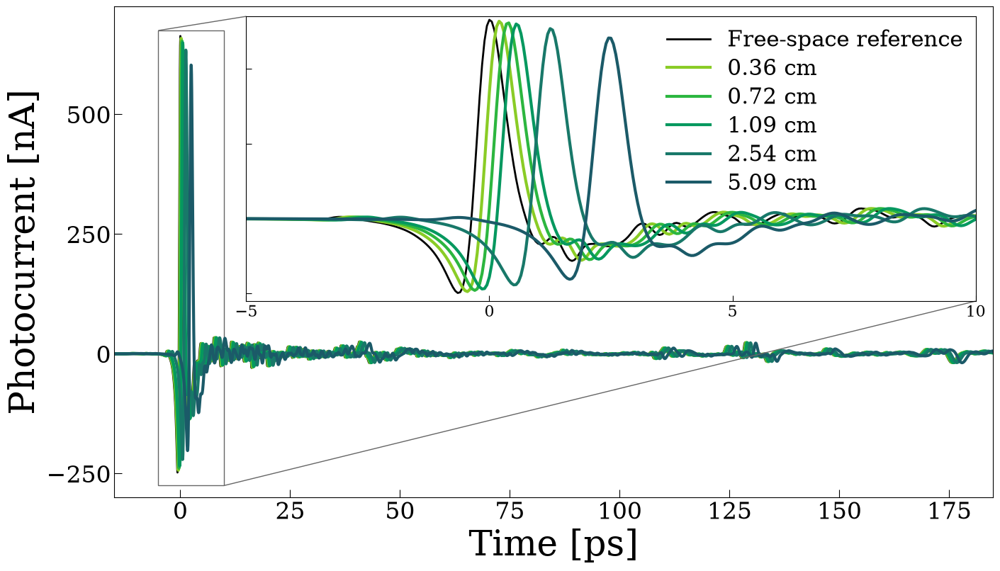

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

fig, ax = plt.subplots(figsize=(16, 9))

T_open,  pc_open  = site_25o4mm.get_base_pulse()

T0 = T_open[np.argmin(pc_open)]
t_ref = T_open - T0
y_ref = -pc_open

ax.set_xlim(-15, 185)

ylims = [-300, 725]
ax.set_ylim(ylims)
ax.set_yticks([-250, 0, 250, 500])
ax.xaxis.set_minor_locator(MultipleLocator(25))

ax.tick_params(axis="both", which='minor', size=4)
ax.tick_params(axis="both", which='major', size=8)

ax.set_xlabel("Time [ps]")
ax.set_ylabel("Photocurrent [nA]")

# ax.legend(frameon=False, loc="lower right", fontsize=22)

# inset
axins = inset_axes(ax, width="83%", height="58%", bbox_to_anchor=(0.15, 0.4, 1, 1), bbox_transform=ax.transAxes, loc="lower left", borderpad=0)

# plot references
ax.plot(t_ref, y_ref, color="k", lw=2, label="Free-space reference")
axins.plot(t_ref, y_ref, color="k", lw=2, label="Free-space reference")

# plot *all* samples in inset
for s in HD30_batch3.keys():
    width_cm = f"{HD30_batch3[s]['width']:.2f} cm"
    ax.plot(HD30_batch3[s]["T"] - T0, -HD30_batch3[s]["pc"], color=HD30_batch3[s]['color'], lw=3, label=width_cm)
    axins.plot(
        HD30_batch3[s]["T"] - T0,
        -HD30_batch3[s]["pc"],
        color=HD30_batch3[s]['color'],
        ls='-',
        lw=3,
        label=width_cm
    )

x1, x2 = -5, 10
axins.set_xlim(x1, x2)
axins.set_ylim([-275, 675])

axins.legend(frameon=False, loc="upper right", fontsize=22, handlelength=2.0, labelspacing=0.3, borderaxespad=0.2)

mark_inset(ax, axins, loc1=2, loc2=4, fc="none", ec="0.4", lw=1)

axins.set_xticks([-5, 0, 5, 10])
axins.set_yticks([-250, 0, 250, 500], labels=[])

axins.tick_params(axis="both", size=6, labelsize=16)

fig.patch.set_facecolor("white")
# plt.tight_layout()
plt.savefig("HD30_time_domain_inset.pdf", bbox_inches="tight", facecolor="white")
plt.show()

## Phase

In [14]:
# The raw phase difference is only known modulo 2pi.
# Picking that multiple from a single low-f sample point is unreliable: phase is
# noisy at low f and at high f the true phase may already exceed 2*pi
# (biasing an initial in-range assumption). I find the minimum y-intercept
# of a linear fit to calibrate the phase.
branch_offsets = np.arange(-10, 11, 2) * np.pi

# Mask outliers where the phase glitches by an ammount that isn't cleanly modulo 2pi 
RESIDUAL_MASK_THRESHOLD = 1.0  # rad

for bname, b in batches.items():
    for sample in b:
        if bname == 'HD60 2.03 cm':
            phase_diff = np.unwrap(np.unwrap(b[sample]['theta']) - np.unwrap(b[sample]['theta_base']))
        else:
            phase_diff = b[sample]['theta'] - b[sample]['theta_base']

        fit_mask = (b[sample]['f'] >= 200) & (b[sample]['f'] <= 500)
        _, intercept = np.polyfit(b[sample]['f'][fit_mask], phase_diff[fit_mask], 1)
        phase_diff = phase_diff + branch_offsets[np.argmin(np.abs(intercept + branch_offsets))]

        b[sample]['phase_diff'] = phase_diff
        good = b[sample]['f'] >= 150
        f_good = b[sample]['f'][good]
        good_idx = np.where(good)[0] # maps compressed index -> index into phase_diff

        phase_good = phase_diff[good_idx]
        dtheta = np.diff(phase_good)
        peaks, _ = find_peaks(np.abs(dtheta), height=0.5, distance=10)

        if len(peaks) > 0:
            peak_freqs = f_good[peaks]
            fit_ok = ~np.any(np.abs(f_good[:, None] - peak_freqs[None, :]) <= 5, axis=1)
            boundaries = np.concatenate(([0], peaks + 1, [len(phase_good)]))

            for k, p in enumerate(peaks):
                before = slice(boundaries[k], p + 1)
                after = slice(p + 1, boundaries[k + 2])

                before_mask = fit_ok[before]
                after_mask = fit_ok[after]

                if before_mask.sum() < 2 or after_mask.sum() < 2:
                    print(f"{sample}: jump near {f_good[p]:.0f} GHz SKIPPED "
                          f"({before_mask.sum()} pts before / {after_mask.sum()} pts after "
                          f"the 5 GHz exclusion -- not enough unmasked data to fit)")
                    continue

                m_before, B_before = np.polyfit(f_good[before][before_mask], phase_good[before][before_mask], 1)
                m_after, B_after = np.polyfit(f_good[after][after_mask], phase_good[after][after_mask], 1)

                step_options = np.array([-1, 0, 1]) * 2 * np.pi
                best_step = step_options[np.argmin(np.abs((B_after + step_options) - B_before))]

                if best_step != 0:
                    # Apply from the original index of the pre-jump point onward
                    # (in the full, unmasked-included array), and keep the
                    # compressed copy in sync so later peaks in this sample see it.
                    phase_diff[good_idx[p] + 1:] += best_step
                    phase_good[p + 1:] += best_step

                peak_f = f_good[p]
                local_residual = (m_after * peak_f + B_after + best_step) - (m_before * peak_f + B_before)

                if abs(local_residual) > RESIDUAL_MASK_THRESHOLD:
                    b[sample]['n_ulim'] = peak_f
                    # print(f"{sample}: jump near {peak_f:.0f} GHz not cleanly explained by a 2*pi slip "
                    #       f"(residual={local_residual:.2f} rad, best_step={best_step:.2f}) -- masking past it")
                elif best_step != 0:
                    b[sample]['n_ulim'] = 2000
                    # print(f"{sample}: jump near {peak_f:.0f} GHz corrected by {best_step:.2f} rad "
                    #       f"(residual={local_residual:.2f} rad)")


        b[sample]['delta_L'] = phase_diff*const.c/(2*np.pi*b[sample]['f']*1e9)
        b[sample]['n'] = 1 + b[sample]['delta_L']/b[sample]['width']*100 # convert to cm

        freq_mask = (b[sample]['f'] <= b[sample]['n_ulim']) # Can change if phase errors occur at high frequencies
        mask_n = freq_mask & (~b[sample]['mask'])

        b[sample]['n_masked'] = b[sample]['n'][mask_n]

        if sample == 'HD30 Batch1 2x1/8" (6.83 mm)':
            continue # Exclude this outlier sample from averaging

        b[sample]['n_eff'] = np.average(b[sample]['n_masked'], weights=b[sample]['t'][mask_n])
        b[sample]['n_eff_err'] = np.sqrt(np.average((b[sample]['n_masked'] - b[sample]['n_eff'])**2, weights=b[sample]['t'][mask_n]))

    valid = [sample for sample in b if sample != 'HD30 Batch1 2x1/8" (6.83 mm)']

    ## Each average is weighted by the inverse variance is the materials are homogenous.
    comb_batches[bname]['n_eff'] = np.average([b[sample]['n_eff'] for sample in valid], weights=[1/b[sample]['n_eff_err']**2 for sample in valid])

    propagated_err = np.sqrt(1 / np.sum([1/b[sample]['n_eff_err']**2 for sample in valid]))
    scatter_err = np.sqrt(np.average([(b[sample]['n_eff'] - comb_batches[bname]['n_eff'])**2 for sample in valid], weights=[1/b[sample]['n_eff_err']**2 for sample in valid]))
    comb_batches[bname]['n_eff_err'] = max(propagated_err, scatter_err)


## Evenly weight the batches within each material type
zote_neff2 = np.mean([comb_batches[sample]['n_eff'] for sample in comb_batches if sample in HD30_batches])
propagated_err = np.sqrt(np.sum([comb_batches[sample]['n_eff_err']**2 for sample in comb_batches if sample in HD30_batches])) / len(HD30_batches)
scatter_err = np.sqrt(np.mean([(comb_batches[sample]['n_eff'] - zote_neff2)**2 for sample in comb_batches if sample in HD30_batches]))
zote_neff2_err = max(propagated_err, scatter_err)

styro_neff2 = np.mean([comb_batches[sample]['n_eff'] for sample in comb_batches if sample in styro_batches])
propagated_err = np.sqrt(np.sum([comb_batches[sample]['n_eff_err']**2 for sample in comb_batches if sample in styro_batches])) / len(styro_batches)
scatter_err = np.sqrt(np.mean([(comb_batches[sample]['n_eff'] - styro_neff2)**2 for sample in comb_batches if sample in styro_batches]))
styro_neff2_err = max(propagated_err, scatter_err)

print(f"""
Zotefoams: n_eff = {zote_neff2:.3f} ± {zote_neff2_err:.3f}
Styrofoams: n_eff = {styro_neff2:.3f} ± {styro_neff2_err:.3f}
""")

C:\Users\alexg\AppData\Local\Temp\ipykernel_480\1447679830.py:75: RuntimeWarning: invalid value encountered in divide
  b[sample]['delta_L'] = phase_diff*const.c/(2*np.pi*b[sample]['f']*1e9)
C:\Users\alexg\AppData\Local\Temp\ipykernel_480\1447679830.py:75: RuntimeWarning: divide by zero encountered in divide
  b[sample]['delta_L'] = phase_diff*const.c/(2*np.pi*b[sample]['f']*1e9)


Styrofoam 4.23 cm: jump near 9988 GHz SKIPPED (8 pts before / 1 pts after the 5 GHz exclusion -- not enough unmasked data to fit)
PP35 0.32 cm (2): jump near 9990 GHz SKIPPED (7 pts before / 1 pts after the 5 GHz exclusion -- not enough unmasked data to fit)
HD80 batch1 2.14 cm: jump near 9990 GHz SKIPPED (13 pts before / 1 pts after the 5 GHz exclusion -- not enough unmasked data to fit)

Zotefoams: n_eff = 1.016 ± 0.002
Styrofoams: n_eff = 1.020 ± 0.002



In [15]:
for bname, b in comb_batches.items():
    print(f"{bname}: n_eff = {b['n_eff']:.4f} ± {b['n_eff_err']:.4f}")

Styrofoam_batch1: n_eff = 1.0204 ± 0.0022
HD30_batch1: n_eff = 1.0182 ± 0.0012
HD30_batch2: n_eff = 1.0142 ± 0.0011
HD30_batch3: n_eff = 1.0148 ± 0.0006
PP35 0.32 cm: n_eff = 1.0163 ± 0.0002
LD15_batch1: n_eff = 1.0090 ± 0.0001
LD15_batch2: n_eff = 1.0063 ± 0.0003
LD24_batch1: n_eff = 1.0121 ± 0.0004
LD24_batch2: n_eff = 1.0123 ± 0.0002
HD80_batch1: n_eff = 1.0378 ± 0.0012
HD110_batch1: n_eff = 1.0586 ± 0.0005


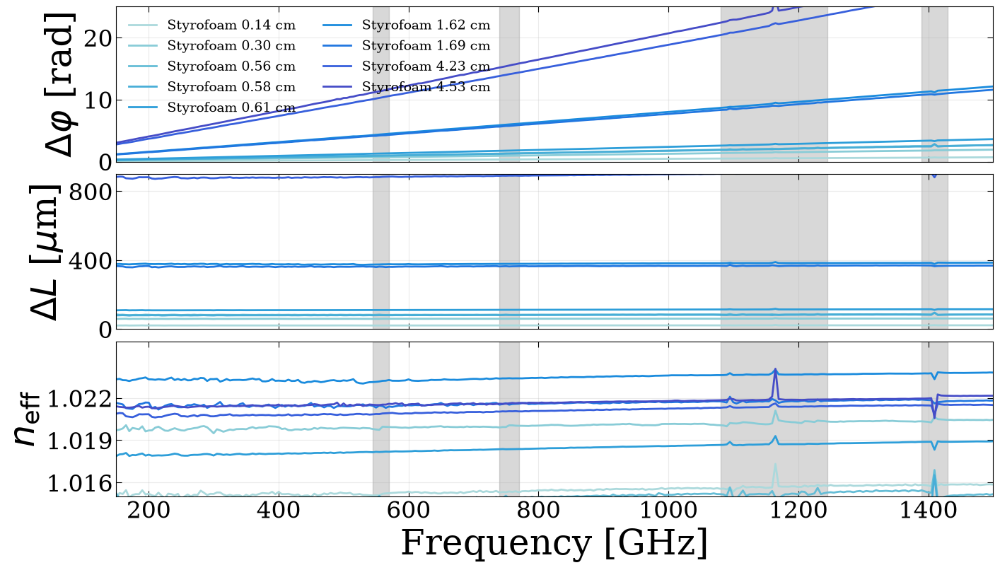

In [16]:
fig, axs = plt.subplots(
    3, 1, sharex=True, figsize=(16, 9),
    gridspec_kw=dict(height_ratios=[1, 1, 1], hspace=0.08)
)

for bname, b in batches.items():
    if "Styrofoam" not in bname:
        continue
    for sample in b:
        axs[0].plot(b[sample]['f'], b[sample]['phase_diff'], color=b[sample]['color'], lw=2, label=sample)
        axs[1].plot(b[sample]['f'], b[sample]['delta_L']*1e6, color=b[sample]['color'], lw=2, label=sample)
        axs[2].plot(b[sample]['f'], b[sample]['n'], lw=2, color=b[sample]['color'], label=sample)

# Axis labels
axs[0].set_ylabel(r'$\Delta \varphi$ [rad]')
axs[1].set_ylabel(r'$\Delta L$ [$\mu$m]')
axs[2].set_ylabel(r'$n_{\rm eff}$')
axs[2].set_xlabel('Frequency [GHz]')

# Limits / ticks
for ax in axs:
    for i, j in zip(mask_starts, mask_stops):
        ax.axvspan(i, j, color='gray', alpha=0.3)
    ax.set_xlim(150, 1500)
    # ax.set_xlim(0, 200)
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction='in', length=6, top=True, right=True)

for i, j in zip(mask_starts, mask_stops):
    if ((i == 0) or (j >= 1500)):
        continue
    # else:
    #     axs[0].text((i+j)/2, 25, 'H$_2$O', horizontalalignment='center', verticalalignment='bottom', fontsize=12, color='black', fontweight='bold')

axs[0].set_ylim(0, 25)
axs[1].set_ylim(0, 900)
axs[2].set_ylim(1.015, 1.026)
axs[1].set_yticks([0, 400, 800])
axs[2].set_yticks([1.016, 1.019, 1.022])
# Legend (single, clean)
axs[0].legend(loc='upper left', fontsize=14, edgecolor='k', frameon=False, ncol=2)

# Remove x tick labels on upper panels (sharex already, but makes it cleaner)
plt.subplots_adjust(hspace=0.08)
axs[0].label_outer()
axs[1].label_outer()
plt.show()


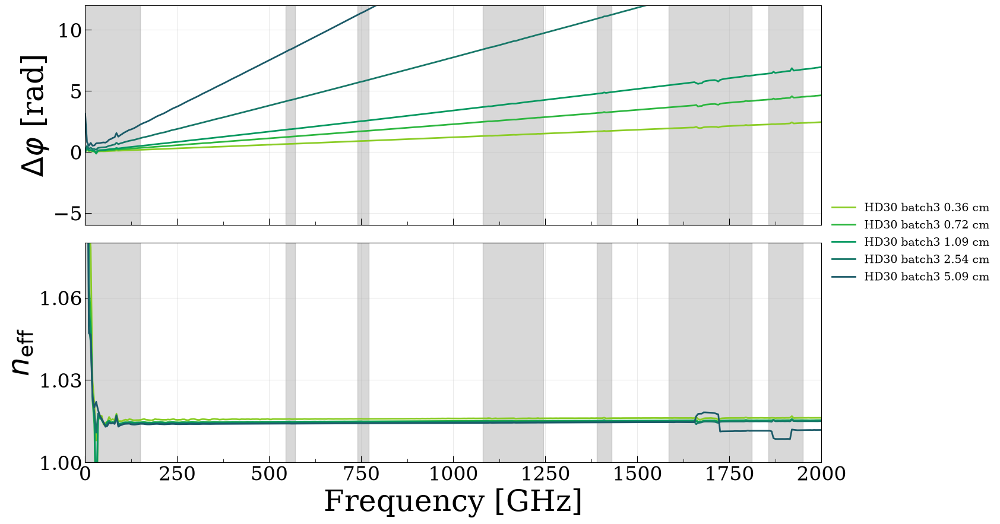

In [17]:
fig, axs = plt.subplots(
    2, 1, sharex=True, figsize=(16, 10),
    gridspec_kw=dict(height_ratios=[1, 1], hspace=0.08)
)

for bname, b in batches.items():
    if bname != 'HD30_batch3':
        continue

    # if bname not in other_zote_keys or bname == 'HD60 2.03 cm':
    #     continue
    for sample in b:
        # if sample != 'HD80 batch1 1.06 cm':
        #     continue

        color = b[sample]['color']

        axs[0].plot(b[sample]['f'], b[sample]['phase_diff'],  color=color, lw=2, label=sample)
        axs[1].plot(b[sample]['f'], b[sample]['n'],           color=color, lw=2, label=sample)

# Axis labels
axs[0].set_ylabel(r'$\Delta \varphi$ [rad]')
axs[1].set_ylabel(r'$n_{\rm eff}$')
axs[1].set_xlabel('Frequency [GHz]')

# Limits / ticks
for ax in axs:
    for i, j in zip(mask_starts, mask_stops):
        ax.axvspan(i, j, color='gray', alpha=0.3)
    ax.set_xlim(0, 2000)
    # ax.set_xlim(0, 200)
    ax.grid(True, alpha=0.25)
axs[1].xaxis.set_major_locator(MultipleLocator(250))
axs[1].xaxis.set_minor_locator(MultipleLocator(125))

for i, j in zip(mask_starts, mask_stops):
    if ((i == 0) or (j >= 1500)):
        continue

axs[0].set_ylim(-6, 12)
axs[1].set_ylim(1, 1.08)
axs[1].set_yticks([1, 1.03, 1.06])
plt.legend(bbox_to_anchor=(1, 1), loc='center left', fontsize=14, edgecolor='k', frameon=False, ncol=1)

# Remove x tick labels on upper panels (sharex already, but makes it cleaner)
plt.subplots_adjust(hspace=0.08)
axs[0].label_outer()
axs[1].label_outer()

plt.show()

## Frequency Domain

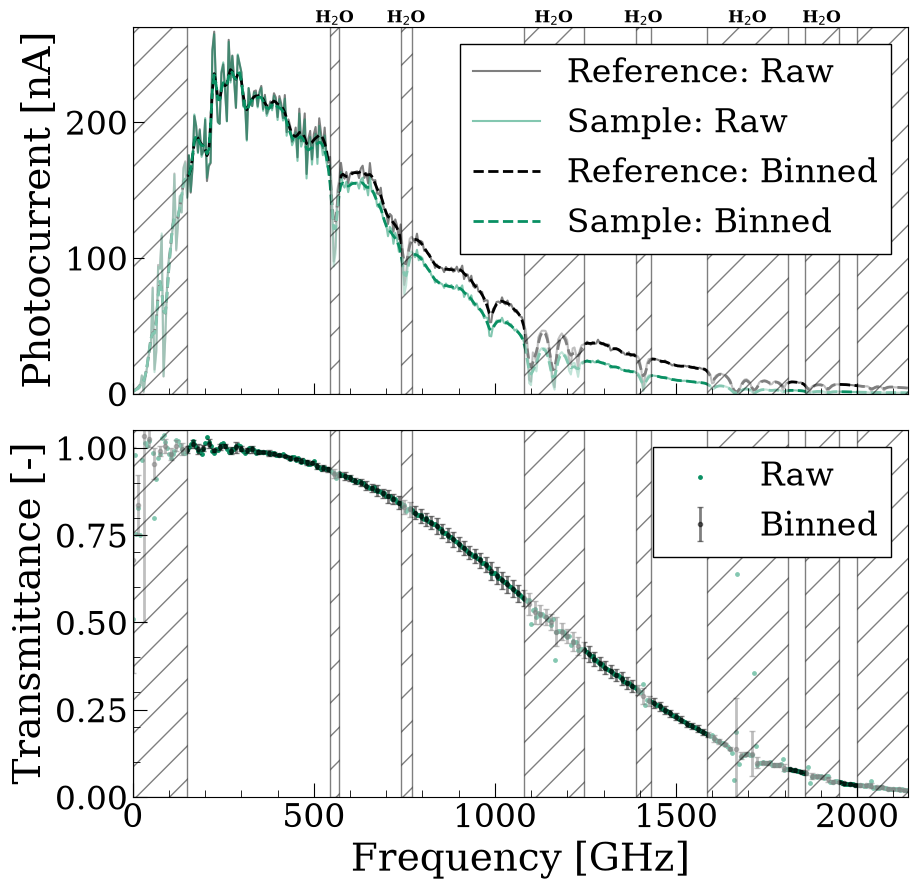

In [18]:
_, samp_amp = site_25o4mm.get_sample_current()
_, ref_amp  = site_25o4mm.get_base_current()

samp_amp_smoothed = getattr(site_25o4mm, 'bcsamp')
ref_amp_smoothed  = getattr(site_25o4mm, 'bcbase')
mes_err           = getattr(site_25o4mm, 'mes_err')

# Plot measurements and fits

b = batches['HD30_batch3']
sample = 'HD30 batch3 2.54 cm'
data = HD30_batch3[sample]

color = comb_batches["HD30_batch3"]['color']

fig, axs = plt.subplots(2, 1, figsize=(10, 10), sharex=True)

alpha_matrix = np.vstack([b[sample]['alpha'] for sample in b])
alpha_err = np.std(alpha_matrix, axis=0, ddof=1)
width     = b[sample]['width']
t         = b[sample]['t']
err_stat = width * t *alpha_err
    
err_tot = np.sqrt(b[sample]['err']**2 + err_stat**2) # combine errors in quadrature

ax0, ax1 = axs

ax0.plot(data['f'], ref_amp, color='k', alpha=0.5, label='Reference: Raw', zorder=-10)
ax0.plot(data['f'], samp_amp, color=color, alpha=0.5, label='Sample: Raw', zorder=-10)
ax0.plot(data['f'], ref_amp_smoothed, color='k', linestyle='--', linewidth=2, label='Reference: Binned', zorder=-10)
ax0.plot(data['f'], samp_amp_smoothed, color=color, linestyle='--', linewidth=2, label='Sample: Binned', zorder=-10)
# ax1.plot(data['f'], mes_err, color='cyan', linestyle='-', linewidth=2, label='Photon noise floor', zorder=10)

ax1.scatter(data['f'], data['ut'], color=color, s=6, label='Raw', zorder=-10)
ax1.errorbar(data['f'][::data['boxnum']], data['t'][::data['boxnum']], yerr=err_tot[::data['boxnum']],
        fmt='o', markersize=3, linewidth=2, capsize=2, color='k', alpha=0.5, label='Binned', zorder=-10)
    # plt.plot(data[sample]['f'], data[sample]['cf'], color='k', linestyle='--', linewidth=2, alpha=0.7, zorder=10, label=r'Rayleigh $\times$ Mie Model' if i == len(data)-1 else None)
data_handles, data_labels = plt.gca().get_legend_handles_labels()

xlims = (0, 2140)

for i, j in zip(mask_starts, mask_stops):
    for ax in axs:
        ax.axvspan(i, j, facecolor='white', hatch='/', edgecolor='k', alpha=0.5, zorder=1)
    if (i == 0):
        # ax0.text((xlims[0]+j)/2, 270, 'Instr.\nLimit', horizontalalignment='center', verticalalignment='bottom', fontsize=12, color='black', fontweight='bold')
        continue
    elif (j == 10000):
        # ax0.text((i+xlims[1])/2, 270, 'Instr.\nLimit', horizontalalignment='center', verticalalignment='bottom', fontsize=12, color='black', fontweight='bold')
        continue
    else:
        ax0.text((i+j)/2, 270, 'H$_2$O', horizontalalignment='center', verticalalignment='bottom', fontsize=12, color='black', fontweight='bold')


handles, labels = plt.gca().get_legend_handles_labels()
misc_handles = [handle for handle in handles if handle not in data_handles]
custom_line = [mpl.lines.Line2D([0], [1], color='lime', linestyle='--', label='Fitted data')]

# plt.legend(handles=data_handles + custom_line + misc_handles, edgecolor='black', fontsize=16, loc='upper right')
ax0.legend(fontsize=24, loc='upper right', framealpha=1, edgecolor='black', facecolor='white', fancybox=False)
ax1.legend(fontsize=24, loc='upper right', framealpha=1, edgecolor='black', facecolor='white', fancybox=False)

ax1.set_xlim(xlims)
# ax0.set_yscale('log')
# ax1.set_yscale('log')
ax0.set_ylim(0, 270)
ax1.set_ylim(0, 1.05)
# ax1.set_ylim(1e-4, 1e0)
# ax1.set_ylim(0, 1.02)
ax1.yaxis.set_minor_locator(MultipleLocator(0.1))
ax0.xaxis.set_minor_locator(MultipleLocator(100))
plt.tick_params(axis='both', which='major', size=10)
plt.tick_params(axis='both', which='minor', size=5)
ax1.set_xlabel('Frequency [GHz]', fontsize=28)
ax0.set_ylabel('Photocurrent [nA]', fontsize=28)
ax1.set_ylabel('Transmittance [-]', fontsize=28)
plt.gcf().set_facecolor('white')
plt.subplots_adjust(hspace=0.1)

plt.savefig('ut_vs_t_example.pdf', bbox_inches='tight', facecolor='white')
plt.show()

## Nested Sampling

Numba just in time (`njit`) version for efficient sampling

Supplemental model functions use ordinary numpy arrays

In [19]:
from fitting_funcs import IRBF_njit, IRBF_alpha_njit, fitting

def IRBF_comp(f, params, width, n):
    lt, C, K_Ray, K_Mie, a_RM = params
    Ray       = C*(f/K_Ray)**4
    Mie       = C*(2-4/(f/K_Mie)*np.sin(f/K_Mie)+4/(f/K_Mie)**2*(1-np.cos(f/K_Mie)))
    loss      = 2e7*np.pi*n*lt*f/const.c
    res_RM   = 2*a_RM*Ray*Mie/C
    return np.exp(-width*loss), np.exp(-width*Ray), np.exp(-width*Mie), np.exp(width*res_RM)

def IRBF_components(f, params, width, n):
    lt, C, K_Ray, K_Mie, a_RM = params
    Ray       = C*(f/K_Ray)**4
    Mie       = C*(2-4/(f/K_Mie)*np.sin(f/K_Mie)+4/(f/K_Mie)**2*(1-np.cos(f/K_Mie)))
    loss      = 2e7*np.pi*n*lt*f/const.c
    Abs_perc = 100*(1 - np.exp(-width*loss))
    Ray_perc  = 100*(1 - np.exp(-width*Ray))
    Mie_perc  = 100*(1 - np.exp(-width*Mie))
    res_RM   = (np.exp(width*2*a_RM*Ray*Mie/C))
    return Abs_perc, Ray_perc, Mie_perc, res_RM

def IRBF_abs(f, lt, width, n):
    loss      = 2e7*np.pi*n*lt*f/const.c
    Abs_perc = 100*(1 - np.exp(-width*loss))
    return Abs_perc

def chi2_dof(f, t, C, IRBF, len_params):
    chi2 = np.sum(((t - IRBF)/C)**2)
    dof  = len(f) - len_params
    return chi2/dof

############# Configure to adjust the nested sampling #############
nlive = 10000
dlogz = 0.01
ncpu  = 16

HD110_batch1 69


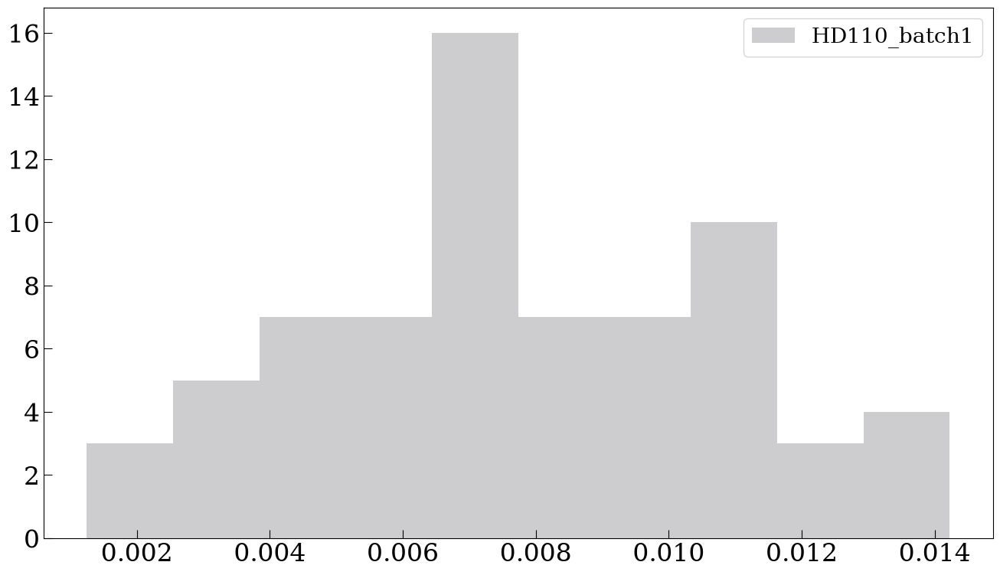

In [20]:
for bname, b in comb_batches.items():
    # if bname == 'HD60 2.03 cm':
    #     continue
    if bname != 'HD110_batch1':
        continue

    err_comb = b['err_comb']
    color = b['color']
    plt.hist(err_comb, alpha=0.5, label=bname, color=color)
    plt.legend(loc='upper right')
    print(bname, len(err_comb))

plt.show()

In [21]:
for bname, b in comb_batches.items():
    bname_cleaned = bname.replace(" ", "_").replace('"', 'in')
    fpath = f'pkls/{bname_cleaned}_model.pkl'

    if os.path.exists(fpath):
        with open(fpath, 'rb') as file:
            results = pickle.load(file)
            if results.nlive >= nlive:
                b['weights'] = np.exp(results['logwt'] - results['logz'][-1])
                b['samples'] = dynesty.utils.resample_equal(results.samples, b['weights'])
                print(f'Number of posterior {bname} samples:', len(b['samples']))
                continue

    f_    = b['f_comb']
    t     = b['t_comb']
    width = b['width_comb']
    err   = b['err_comb']
    n_eff = b['n_eff']
    results = fitting(f_, t, width, err, n_eff, nlive, dlogz, ncpu=ncpu)

    results.summary()

    b['weights'] = np.exp(results['logwt'] - results['logz'][-1])
    b['samples'] = dynesty.utils.resample_equal(results.samples, b['weights'])
    print(f'Number of posterior {bname} samples:', len(b['samples']))

    # Save the results
    with open(fpath, 'wb') as file:
        pickle.dump(results, file)

Number of posterior Styrofoam_batch1 samples: 239785
Number of posterior HD30_batch1 samples: 339068
Number of posterior HD30_batch2 samples: 376308
Number of posterior HD30_batch3 samples: 365487
Number of posterior PP35 0.32 cm samples: 236434
Number of posterior LD15_batch1 samples: 466643
Number of posterior LD15_batch2 samples: 374808
Number of posterior LD24_batch1 samples: 395863
Number of posterior LD24_batch2 samples: 334392
Number of posterior HD80_batch1 samples: 403616
Number of posterior HD110_batch1 samples: 374070


In [22]:
from fitting_funcs import IRBF_batch_params, alpha_batch_params, components_batch_params

alphas = {}

for bname, b in comb_batches.items():
    bname_cleaned = bname.replace(" ", "_").replace('"', 'in')
    fpath = f'pkls/{bname_cleaned}_alpha.pkl'

    if os.path.exists(fpath):
        with open(fpath, 'rb') as file:
            b['alpha_lower'], b['ns_alpha'], b['alpha_upper'] = pickle.load(file)
    else:
        alpha = alpha_batch_params(f, b['samples'], b['n_eff'])
        b['alpha_lower'], b['ns_alpha'], b['alpha_upper'] = np.percentile(alpha, [16, 50, 84], axis=0)
        with open(fpath, 'wb') as file:
            pickle.dump((b['alpha_lower'], b['ns_alpha'], b['alpha_upper']), file)

In [23]:
w = 5 # 5 cm assembly example

for bname, b in comb_batches.items():
    q = np.percentile(b['samples'], [16, 50, 84], axis=0)

    b['params']       = q[1]
    b['upper_params'] = q[2] - q[1]
    b['lower_params'] = q[1] - q[0]
    b['C_params'] = (q[2] - q[0])/2

    # We use the 95th percentile, the 2 sigma UL
    q = np.percentile(b['samples'], 95, axis=0)
 
    b['upper_params'][0] = q[0]
    # b['params'][0]       = np.nan # We'll use the 95th percentile, so make sure we don't use the median
    b['lower_params'][0] = 0

    b[f'T_upper_5cm'], b[f'ns_T_5cm'], b[f'T_lower_5cm'] = np.exp(-w*b['alpha_lower']), np.exp(-w*b['ns_alpha']), np.exp(-w*b['alpha_upper'])

    n_eff = b['n_eff']

    for sample_name, sample in batches[bname].items():
        ## transform samples from parameter space to transmission
        width = sample['width']
        sample['T_upper'], sample['ns_T'], sample['T_lower'] = np.exp(-width*b['alpha_lower']), np.exp(-width*b['ns_alpha']), np.exp(-width*b['alpha_upper'])
        diff = sample['T_upper'] - sample['T_lower']

## Combined Sampling Results

In [24]:
def round_uncertainty(x):
    """Return (rounded_value, decimal_places_for_round())."""
    x = float(x)
    if x == 0.0:
        return 0.0, 0

    exponent = int(np.floor(np.log10(abs(x))))

    # first_digit = abs(x) / 10**exponent
    # sigfigs = 2 if first_digit < 1.95 else 1
    sigfigs = 1
    
    decimals = int(sigfigs - 1 - exponent)  # can be negative!

    return round(x, decimals), decimals

def sci_scale(x):
    """
    Return (scaled_x, exponent) such that:
    x = scaled_x * 10**exponent
    """
    if x == 0:
        return 0.0, 0
    exponent = int(np.floor(np.log10(abs(x))))
    return x / 10**exponent, exponent

def format_unc(mu, C_minus, C_plus, sci_thresh=1e-3):
    mu = float(mu)
    C_minus = float(C_minus)
    C_plus  = float(C_plus)

    use_sci = abs(mu) < sci_thresh and mu != 0

    if use_sci:
        mu_s, exp = sci_scale(mu)
        sm_s = C_minus / 10**exp
        sp_s = C_plus  / 10**exp
    else:
        mu_s, sm_s, sp_s = mu, C_minus, C_plus
        exp = None

    # Determine rounding from uncertainties
    _, d1 = round_uncertainty(sm_s)
    _, d2 = round_uncertainty(sp_s)
    decimals = max(d1, d2)

    mu_r = round(mu_s, decimals)
    sm_r = round(sm_s, decimals)
    sp_r = round(sp_s, decimals)

    prec = max(decimals, 0)
    fmt = f"{{:.{prec}f}}"

    core = rf"{fmt.format(mu_r)}^{{+{fmt.format(sp_r)}}}_{{-{fmt.format(sm_r)}}}"

    if use_sci:
        return rf"${core}\times10^{{{exp}}}$"
    else:
        return rf"${core}$"
    
def format_unc_1sided(mu, C, sci_thresh=1e-3, shorthand=True):
    mu = float(mu)
    C = float(C)

    use_sci = abs(mu) < sci_thresh and mu != 0

    if use_sci:
        mu_s, exp = sci_scale(mu)
        C_s = C / 10**exp
    else:
        mu_s, C_s = mu, C
        exp = None

    _, decimals = round_uncertainty(C_s)
    mu_r = round(mu_s, decimals)
    C_r = round(C_s, decimals)

    prec = max(decimals, 0)
    fmt = f"{{:.{prec}f}}"

    if shorthand and not use_sci:
        ### e.g. 1.013(1) for 1.013 ± 0.001
        C_int = round(C_r * 10**prec)
        core = rf"{fmt.format(mu_r)}({C_int})"
        return rf"${core}$"

    core = rf"{fmt.format(mu_r)} \pm {fmt.format(C_r)}"

    if use_sci:
        return rf"${core}\times10^{{{exp}}}$"
    else:
        return rf"${core}$"
    
def format_val(val, sci_thresh=1e-2):
    val = float(val)
    
    use_sci = abs(val) < sci_thresh and val != 0

    if use_sci:
        exp = int(np.floor(np.log10(abs(val))))
        core = val / 10**exp
        return rf"${core:.1f}\times10^{{{exp}}}$"
    else: 
        return rf"${val:.2f}$"


def get_corner_handles(bs, type=None):
    handles = []
    
    for b in bs:
        if type == None:
            sample_cleaned = b.replace('_', ' ')
        elif type == 'HD30':
            sample_cleaned = b.replace('_', ' ').replace('HD30 ', '').replace('batch', 'Batch ')
        elif type == 'Styrofoam':
            sample_cleaned = b.replace('_', ' ').replace('Styrofoam', '').replace('batch', 'Batch ')
        else:
            raise ValueError("type must be None, 'HD30', or 'Styrofoam'")
        base = comb_batches[b]['color']

        # Convert to RGBA and make a lighter facecolor (blend with white)
        r, g, b, a = mcolors.to_rgba(base)
        light = (0.5 + 0.5*r, 0.5 + 0.5*g, 0.5 + 0.5*b, 0.9)
        dark  = (r, g, b, 1.0)                             

        # Zero-size Rectangle proxy like anesthetic (width/height don't matter for legend)
        patch = mpatches.Rectangle(
            (0, 0), 0, 0,
            facecolor=dark,
            edgecolor=light,
            linewidth=4,
            label=sample_cleaned,
        )
        handles.append(patch)

    return handles

Get band averages from the estimates

In [25]:
def f_p_from_rho(rho_eff, rho_p, rho_m=1.25):
    """Matrix volume fraction from density mixing: rho_eff = f_p rho_p + (1-f_p) rho_m."""
    return (rho_eff - rho_m) / (rho_p - rho_m)

def lt_eff(f_p, n_p, tan_delta_p, n_eff, n_m=1.0003):
    """
    Maxwell-Garnett (dilute polymer inclusions in gas host) effective loss tangent.
    tan_eff = n_p^2 * (n_n_eff^2 + 2n_m^2)^2 / [n_eff^2 * (n_p^2 + 2n_m^2)^2] * f_p tan_delta_p
    """
    num = n_p**2*(n_eff**2 + 2*n_m**2)**2
    den = n_eff**2*(n_p**2   + 2*n_m**2)**2
    return (num / den) * f_p * tan_delta_p

for bname, b in comb_batches.items():

    ## Estimate the loss tangent
    if "HD" in bname:
        b['rho_p'] = 950
        lt_p      = 2.5e-4   # HDPE loss tangent from literature
        b['n_p'] = 1.54
        
    elif "LD" in bname:
        b['rho_p'] = 925
        lt_p       = 2.7e-4
        b['n_p']   = 1.514  # Literature estimates this value as slightly lower...
        
    elif "Styrofoam" in bname:
        b['rho_p'] = 1050
        lt_p       = 6.9e-3       # Polystyrene loss tangent from literature
        b['n_p']   = 1.59
    elif "PP" in bname:
        b['rho_p'] = 905
        lt_p       = 6.2e-4       # Polypropylene loss tangent from literature
        b['n_p']   = 1.5
    else:
        raise ValueError(f"Unknown material type: {bname}")

    b['f_p'] = f_p_from_rho(b['density'], b['rho_p'])
    b['lt']  = lt_eff(b['f_p'], b['n_p'], lt_p, b['n_eff'])

for bname, b in comb_batches.items():
    print(f"{bname:<19}: f_p = {b['f_p']:.3f}, lt = {b['lt']:.3e}")

Styrofoam_batch1   : f_p = 0.023, lt = 1.712e-04
HD30_batch1        : f_p = 0.030, lt = 8.364e-06
HD30_batch2        : f_p = 0.030, lt = 8.386e-06
HD30_batch3        : f_p = 0.030, lt = 8.383e-06
PP35 0.32 cm       : f_p = 0.037, lt = 2.569e-05
LD15_batch1        : f_p = 0.015, lt = 4.475e-06
LD15_batch2        : f_p = 0.015, lt = 4.483e-06
LD24_batch1        : f_p = 0.025, lt = 7.389e-06
LD24_batch2        : f_p = 0.025, lt = 7.388e-06
HD80_batch1        : f_p = 0.083, lt = 2.264e-05
HD110_batch1       : f_p = 0.115, lt = 3.091e-05


In [26]:
band_windows_full = {
    "30":  (24, 30),
    "40":  (30, 47),
    "90":  (75, 110),
    "150": (120, 165),
    "220": (195, 255),
    "280": (260, 305),
    "350": (330, 370),
    "850": (850, 890)
}

for bname, b in comb_batches.items():
    ## Constrain the components
    params       = b["params"]
    upper_params = b["upper_params"]
    lower_params = b["lower_params"]
    n_eff        = b["n_eff"]
    lt           = b["lt"]

    bname_cleaned = bname.replace(" ", "_").replace('"', 'in')
    fpath = f'pkls/{bname_cleaned}_components.pkl'

    if os.path.exists(fpath):
        with open(fpath, 'rb') as file:
            (Abs_lower, Abs, Abs_upper,
             Ray_lower, Ray, Ray_upper,
             Mie_lower, Mie, Mie_upper,
             res_lower, res, res_upper) = pickle.load(file)
    else:
        Abs_s, Ray_s, Mie_s, res_s = components_batch_params(f, b['samples'], w, n_eff)

        Abs_lower, Abs, Abs_upper = np.percentile(Abs_s, [16, 50, 84], axis=0)
        Ray_lower, Ray, Ray_upper = np.percentile(Ray_s, [16, 50, 84], axis=0)
        Mie_lower, Mie, Mie_upper = np.percentile(Mie_s, [16, 50, 84], axis=0)
        res_lower, res, res_upper = np.percentile(res_s, [16, 50, 84], axis=0)

        with open(fpath, 'wb') as file:
            pickle.dump((Abs_lower, Abs, Abs_upper,
                         Ray_lower, Ray, Ray_upper,
                         Mie_lower, Mie, Mie_upper,
                         res_lower, res, res_upper), file)

    # Bookmark
    # if bname != 'PP35 0.32 cm':
    Abs_lower = np.zeros_like(Abs_lower)
    Abs = IRBF_abs(f, lt, w, n_eff)
    Abs_upper = 2*Abs

    estimates = {
        "Abs": dict(arr=Abs, upper=Abs_upper, lower=Abs_lower, color='tab:red',    ls='-'),
        "Ray":  dict(arr=Ray,  upper=Ray_upper,  lower=Ray_lower,  color='tab:blue',   ls='--'),
        "Mie":  dict(arr=Mie,  upper=Mie_upper,  lower=Mie_lower,  color='tab:orange', ls=':'),
        "res": dict(arr=res, upper=res_upper, lower=res_lower, color='tab:green',  ls='-.'),
    }

    b["estimates"] = estimates

    band_avgs = {}
    for band, (lo_f, hi_f) in band_windows_full.items():
        sel = (f > lo_f) & (f < hi_f)
        
        for comp, est_data in estimates.items():
            val       = np.mean(est_data['arr'][sel])
            upper_val = np.mean(est_data['upper'][sel])
            lower_val = np.mean(est_data['lower'][sel])

            up = upper_val - val
            lo = val - lower_val

            band_avgs[(band, comp)]            = val
            band_avgs[(band, f"{comp}_upper")] = up
            band_avgs[(band, f"{comp}_lower")] = lo

    b["band_avgs"] = band_avgs

    ## Band averaged transmission with uncertainties
    T_lower, ns_T, T_upper = b['T_lower_5cm'], b['ns_T_5cm'], b['T_upper_5cm']
    for band_name, (lo_f, hi_f) in band_windows_full.items():
        sel = (f > lo_f) & (f < hi_f)
        val = float(np.mean(ns_T[sel]))
        upper_val = float(np.mean(T_upper[sel]))
        lower_val = float(np.mean(T_lower[sel]))

        up = upper_val - val
        lo = val - lower_val

        b[f"T{band_name}"] = format_unc(val, lo, up)

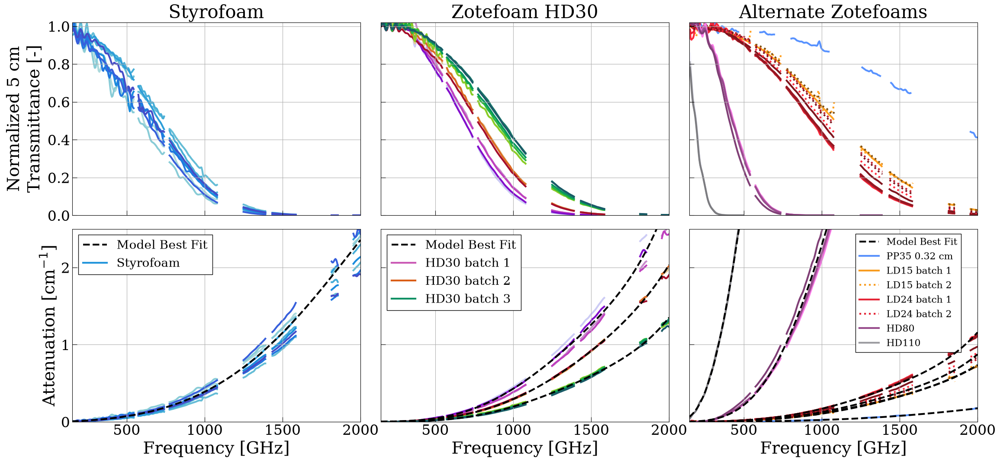

In [27]:
fig, axes = plt.subplots(2, 3, figsize=(27, 12), sharex=True, sharey='row')

lw = 3
plt.xlim(150, 2000)
axes[0, 0].set_ylim(0, 1.02)
axes[1, 0].set_ylim(0, 2.5)
axes[0, 0].set_ylabel('Normalized 5 cm\nTransmittance [-]', fontsize=28)
axes[1, 0].set_ylabel(r'Attenuation [cm$^{-1}$]', fontsize=28)

for ax in axes[1, :]:
    ax.set_xlabel('Frequency [GHz]', fontsize=28)


for bname, b in batches.items():
    i = 0
    if bname in styro_batches:
        ax1 = axes[0, 0]
        ax2 = axes[1, 0]

    elif bname in HD30_batches:
        ax1 = axes[0, 1]
        ax2 = axes[1, 1]

    elif bname in other_zote_keys and bname != 'HD60 2.03 cm':
        ax1 = axes[0, 2]
        ax2 = axes[1, 2]

    else:
        continue

    for j, sample in enumerate(b):
        if '(2)' in sample:
            continue

        f_    = b[sample]['f']
        t     = b[sample]['t']
        alpha = b[sample]['alpha']
        err   = b[sample]['err']
        mask  = b[sample]['mask']

        ns_T = b[sample]['ns_T']
        ns_alpha = comb_batches[bname]['ns_alpha']
        width = b[sample]['width']
        ns_T_5cm = ns_T**(5/width)

        t_5cm_masked = np.where(mask, np.nan, t**(5/width))
        alpha_masked = np.where(mask, np.nan, alpha)

        color = b[sample]['color']

        zorder=-9 if sample == 'LD15 batch1 2.65 cm' else -10

        ls = ':' if 'batch2' in sample and bname in other_zote_keys else '-'

        ax1.plot(f_, t_5cm_masked, color=color, lw=lw, ls=ls, zorder=zorder)
        ax2.plot(f_, alpha_masked, color=color, lw=lw, ls=ls, zorder=zorder)

        # transform to display coordinates

        if i == 0:
            ax2.plot(f, ns_alpha, color='k', linestyle='--', lw=3, zorder=10)
            # ax1.plot(f, ns_T_5cm, color='k', linestyle='--', lw=3, zorder=10)

        i += 1

for ax in axes.flatten():
    ax.grid(True)

custom_line = mpl.lines.Line2D([0], [1], color='k', linestyle='--', lw=3, label='Model Best Fit')

styro_line  = mpl.lines.Line2D([0], [1], color=comb_batches['Styrofoam_batch1']['color'], lw=3, label='Styrofoam')

hd30_line1 = mpl.lines.Line2D([0], [1], color=comb_batches['HD30_batch1']['color'], lw=3, label='HD30 batch 1')
hd30_line2 = mpl.lines.Line2D([0], [1], color=comb_batches['HD30_batch2']['color'], lw=3, label='HD30 batch 2')
hd30_line3 = mpl.lines.Line2D([0], [1], color=comb_batches['HD30_batch3']['color'], lw=3, label='HD30 batch 3')

pp35_line  = mpl.lines.Line2D([0], [1], color=comb_batches['PP35 0.32 cm']['color'], lw=3, label='PP35 0.32 cm')
ld15_line1 = mpl.lines.Line2D([0], [1], color=comb_batches['LD15_batch1']['color'], lw=3, label='LD15 batch 1')
ld15_line2 = mpl.lines.Line2D([0], [1], color=comb_batches['LD15_batch2']['color'], lw=3, ls=':', label='LD15 batch 2')
ld24_line1 = mpl.lines.Line2D([0], [1], color=comb_batches['LD24_batch1']['color'], lw=3, label='LD24 batch 1')
ld24_line2 = mpl.lines.Line2D([0], [1], color=comb_batches['LD24_batch2']['color'], lw=3, ls=':', label='LD24 batch 2')
hd80_line  = mpl.lines.Line2D([0], [1], color=comb_batches['HD80_batch1']['color'], lw=3, label='HD80')
hd110_line = mpl.lines.Line2D([0], [1], color=comb_batches['HD110_batch1']['color'], lw=3, label='HD110')

handles = [custom_line, styro_line]

axes[1, 0].legend(handles=handles, loc='upper left', fontsize=20, framealpha=1, edgecolor='black', facecolor='white', fancybox=False)

handles = [custom_line, hd30_line1, hd30_line2, hd30_line3]
axes[1, 1].legend(handles=handles, loc='upper left', fontsize=20, framealpha=1, edgecolor='black', facecolor='white', fancybox=False)

handles = [custom_line, pp35_line, ld15_line1, ld15_line2, ld24_line1, ld24_line2, hd80_line, hd110_line]
axes[1, 2].legend(handles=handles, loc='upper right', fontsize=16, framealpha=1, edgecolor='black', facecolor='white', fancybox=False, bbox_to_anchor=(0.96, 1.0))

axes[0, 0].set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
axes[1, 0].set_yticks([0, 1, 2])
axes[0, 0].set_title('Styrofoam', fontsize=30)
axes[0, 1].set_title('Zotefoam HD30', fontsize=30)
axes[0, 2].set_title('Alternate Zotefoams', fontsize=30)

plt.gcf().set_facecolor('white')
plt.subplots_adjust(wspace=0.07, hspace=0.07)
plt.savefig('spectras-e.pdf')
plt.show()

Tweaked version with context for SPIE poster

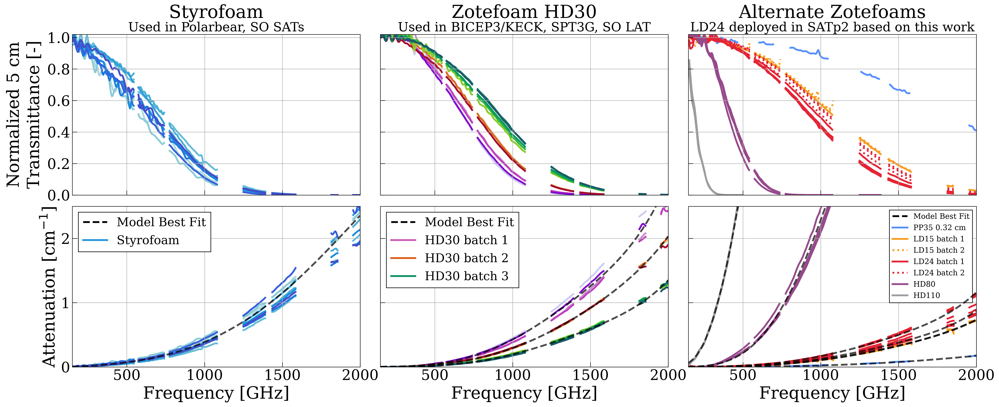

In [28]:
fig, axes = plt.subplots(2, 3, figsize=(27, 10), sharex=True, sharey='row', dpi=300)

lw = 3
plt.xlim(150, 2000)
axes[0, 0].set_ylim(0, 1.02)
axes[1, 0].set_ylim(0, 2.5)
axes[0, 0].set_ylabel('Normalized 5 cm\nTransmittance [-]', fontsize=28)
axes[1, 0].set_ylabel(r'Attenuation [cm$^{-1}$]', fontsize=28)

for ax in axes[1, :]:
    ax.set_xlabel('Frequency [GHz]', fontsize=28)


for bname, b in batches.items():
    i = 0
    if bname in styro_batches:
        ax1 = axes[0, 0]
        ax2 = axes[1, 0]

    elif bname in HD30_batches:
        ax1 = axes[0, 1]
        ax2 = axes[1, 1]

    elif bname in other_zote_keys and bname != 'HD60 2.03 cm':
        ax1 = axes[0, 2]
        ax2 = axes[1, 2]

    else:
        continue

    for j, sample in enumerate(b):
        if '(2)' in sample:
            continue

        f_    = b[sample]['f']
        t     = b[sample]['t']
        alpha = b[sample]['alpha']
        err   = b[sample]['err']
        mask  = b[sample]['mask']

        ns_T = b[sample]['ns_T']
        ns_alpha = comb_batches[bname]['ns_alpha']
        width = b[sample]['width']
        ns_T_5cm = ns_T**(5/width)

        ls = ':' if 'batch2' in sample and bname in other_zote_keys else '-'

        t_5cm_masked = np.where(mask, np.nan, t**(5/width))
        alpha_masked = np.where(mask, np.nan, alpha)

        if ax2 == axes[1, 2]:
            color = comb_batches[bname]['color']
        else:
            color = b[sample]['color']

        zorder=-9 if sample == 'LD15 batch1 2.65 cm' else -10

        ax1.plot(f_, t_5cm_masked, color=color, lw=lw, ls=ls, zorder=zorder)
        ax2.plot(f_, alpha_masked, color=color, lw=lw, zorder=zorder)

        # transform to display coordinates

        if i == 0:
            alpha=0.7
            ax2.plot(f, ns_alpha, color='k', linestyle='--', lw=3, alpha=alpha, zorder=10)
            # ax1.plot(f, ns_T_5cm, color='k', linestyle='--', lw=3, zorder=10)

        i += 1


for ax in axes.flatten():
    ax.grid(True)

custom_line = mpl.lines.Line2D([0], [1], color='k', linestyle='--', lw=3, label='Model Best Fit')

styro_line  = mpl.lines.Line2D([0], [1], color=comb_batches['Styrofoam_batch1']['color'], lw=3, label='Styrofoam')

hd30_line1 = mpl.lines.Line2D([0], [1], color=comb_batches['HD30_batch1']['color'], lw=3, label='HD30 batch 1')
hd30_line2 = mpl.lines.Line2D([0], [1], color=comb_batches['HD30_batch2']['color'], lw=3, label='HD30 batch 2')
hd30_line3 = mpl.lines.Line2D([0], [1], color=comb_batches['HD30_batch3']['color'], lw=3, label='HD30 batch 3')

pp35_line  = mpl.lines.Line2D([0], [1], color=comb_batches['PP35 0.32 cm']['color'], lw=3, label='PP35 0.32 cm')
ld15_line1 = mpl.lines.Line2D([0], [1], color=comb_batches['LD15_batch1']['color'], lw=3, label='LD15 batch 1')
ld15_line2 = mpl.lines.Line2D([0], [1], color=comb_batches['LD15_batch2']['color'], lw=3, ls=':', label='LD15 batch 2')
ld24_line1 = mpl.lines.Line2D([0], [1], color=comb_batches['LD24_batch1']['color'], lw=3, label='LD24 batch 1')
ld24_line2 = mpl.lines.Line2D([0], [1], color=comb_batches['LD24_batch2']['color'], lw=3, ls=':', label='LD24 batch 2')
hd80_line  = mpl.lines.Line2D([0], [1], color=comb_batches['HD80_batch1']['color'], lw=3, label='HD80')
hd110_line = mpl.lines.Line2D([0], [1], color=comb_batches['HD110_batch1']['color'], lw=3, label='HD110')

handles = [custom_line, styro_line]

axes[1, 0].legend(handles=handles, loc='upper left', fontsize=20, framealpha=1, edgecolor='black', facecolor='white', fancybox=False)

handles = [custom_line, hd30_line1, hd30_line2, hd30_line3]
axes[1, 1].legend(handles=handles, loc='upper left', fontsize=20, framealpha=1, edgecolor='black', facecolor='white', fancybox=False)

handles = [custom_line, pp35_line, ld15_line1, ld15_line2, ld24_line1, ld24_line2, hd80_line, hd110_line]
axes[1, 2].legend(handles=handles, loc='upper right', fontsize=12.5, framealpha=1, edgecolor='black', facecolor='white', fancybox=False)

axes[0, 0].set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
axes[1, 0].set_yticks([0, 1, 2])
axes[0, 0].set_title('Styrofoam', fontsize=30, y=1.08)
axes[0, 0].annotate('Used in Polarbear, SO SATs', xy=(0.5, 1), xycoords='axes fraction', fontsize=21, ha='center', va='bottom')
axes[0, 1].set_title('Zotefoam HD30', fontsize=30, y=1.08)
axes[0, 1].annotate('Used in BICEP3/KECK, SPT3G, SO LAT', xy=(0.5, 1), xycoords='axes fraction', fontsize=21, ha='center', va='bottom')
axes[0, 2].set_title('Alternate Zotefoams', fontsize=30, y=1.08)
axes[0, 2].annotate('LD24 deployed in SATp2 based on this work', xy=(0.5, 1), xycoords='axes fraction', fontsize=21, ha='center', va='bottom')

plt.gcf().set_facecolor('white')
plt.subplots_adjust(wspace=0.07, hspace=0.07)
plt.savefig('spectras-poster.pdf')
plt.show()

In [29]:
rows = []

param_names = ["Loss tangent", "C", "K_ray", "K_Mie", "a_RM"]

for bname, b in comb_batches.items():
    if 'HD60' in bname:
        continue
    row = {"Sample": DISPLAY_MAP[bname]}

    # Get the parameters and uncertainties from the appropriate fit

    for i, pname in enumerate(param_names):
        val = float(b['params'][i])
        up  = float(b['upper_params'][i])
        lo  = float(b['lower_params'][i])

        if pname == 'Loss tangent':
                row[pname] = f"$<{format_val(up)[1:]}"
        else:
            row[pname] = format_unc(val, lo, up)

    val = b['n_eff']
    sig = b['n_eff_err']

    row["n_eff^2"] = format_unc_1sided(val, sig)

    rows.append(row)

df = pd.DataFrame(rows)

for _, row in df.iterrows():
    cells = [row["Sample"]] + [row[p] for p in param_names] + [row["n_eff^2"]]
    print(" & ".join(cells) + r" \\")

Styrofoam batch & $<4.7\times10^{-5}$ & $2.7^{+0.9}_{-1.2}$ & $2000^{+200}_{-300}$ & $2400^{+400}_{-600}$ & $0.7^{+0.2}_{-0.3}$ & $1.020(2)$ \\
HD30 batch 1 & $<1.0\times10^{-5}$ & $0.017^{+0.004}_{-0.004}$ & $410^{+20}_{-30}$ & $488^{+9}_{-8}$ & $0.114^{+0.001}_{-0.001}$ & $1.018(1)$ \\
HD30 batch 2 & $<1.1\times10^{-5}$ & $0.035^{+0.003}_{-0.003}$ & $570^{+10}_{-10}$ & $533^{+6}_{-6}$ & $0.1042^{+0.0008}_{-0.0008}$ & $1.014(1)$ \\
HD30 batch 3 & $<4.8\times10^{-6}$ & $0.0022^{+0.0009}_{-0.0009}$ & $290^{+30}_{-40}$ & $500^{+4}_{-3}$ & $0.1141^{+0.0007}_{-0.0007}$ & $1.0148(6)$ \\
PP35 & $<1.3\times10^{-5}$ & $0.17^{+0.08}_{-0.08}$ & $1900^{+200}_{-300}$ & $2800^{+400}_{-800}$ & $0.7^{+0.2}_{-0.3}$ & $1.0163(2)$ \\
LD15 batch 1 & $<1.5\times10^{-7}$ & $0.0138^{+0.0003}_{-0.0003}$ & $567^{+4}_{-4}$ & $514^{+1}_{-1}$ & $0.1072^{+0.0003}_{-0.0003}$ & $1.0090(1)$ \\
LD15 batch 2 & $<9.5\times10^{-6}$ & $0.015^{+0.002}_{-0.002}$ & $590^{+30}_{-30}$ & $531^{+10}_{-8}$ & $0.101^{+0.002}_{-0.

In [30]:
rows = []

param_names = ["Loss tangent", "C", "K_ray", "K_Mie", "a_RM"]

for bname, b in comb_batches.items():
    T_lower, ns_T, T_upper = b['T_lower_5cm'], b['ns_T_5cm'], b['T_upper_5cm']

    row = {"Sample": bname}

    # --- parameters with uncertainties ---
    for i, pname in enumerate(param_names):
        val = float(b['params'][i])
        up  = float(b['upper_params'][i])
        lo  = float(b['lower_params'][i])

        row[pname] = format_unc(val, lo, up)

    row["n_eff^2"] = rf"${b['n_eff']:.3f} \pm {b['n_eff_err']:.4f}$"

    # --- band-averaged transmittance ---
    for band_name, (lo_f, hi_f) in band_windows_full.items():
        sel = (f > lo_f) & (f < hi_f)

        val       = 100*float(np.mean(ns_T[sel]))
        upper_val = 100*float(np.mean(T_upper[sel]))
        lower_val = 100*float(np.mean(T_lower[sel]))

        up = upper_val - val
        lo = val - lower_val

        # row[f"T{band_name} [%]"] = format_unc(val, lo, up)

    rows.append(row)

df = pd.DataFrame(rows)
df

,Sample,Loss tangent,C,K_ray,K_Mie,a_RM,n_eff^2
0,Styrofoam_batch1,$2^{+5}_{-0}\times10^{-5}$,$2.7^{+0.9}_{-1.2}$,$2000^{+200}_{-300}$,$2400^{+400}_{-600}$,$0.7^{+0.2}_{-0.3}$,$1.020 \pm 0.0022$
1,HD30_batch1,$2^{+10}_{-0}\times10^{-6}$,$0.017^{+0.004}_{-0.004}$,$410^{+20}_{-30}$,$488^{+9}_{-8}$,$0.114^{+0.001}_{-0.001}$,$1.018 \pm 0.0012$
2,HD30_batch2,$3^{+11}_{-0}\times10^{-6}$,$0.035^{+0.003}_{-0.003}$,$570^{+10}_{-10}$,$533^{+6}_{-6}$,$0.1042^{+0.0008}_{-0.0008}$,$1.014 \pm 0.0011$
3,HD30_batch3,$1^{+5}_{-0}\times10^{-6}$,$0.0022^{+0.0009}_{-0.0009}$,$290^{+30}_{-40}$,$500^{+4}_{-3}$,$0.1141^{+0.0007}_{-0.0007}$,$1.015 \pm 0.0006$
4,PP35 0.32 cm,$4^{+13}_{-0}\times10^{-6}$,$0.17^{+0.08}_{-0.08}$,$1900^{+200}_{-300}$,$2800^{+400}_{-800}$,$0.7^{+0.2}_{-0.3}$,$1.016 \pm 0.0002$
5,LD15_batch1,$3^{+15}_{-0}\times10^{-8}$,$0.0138^{+0.0003}_{-0.0003}$,$567^{+4}_{-4}$,$514^{+1}_{-1}$,$0.1072^{+0.0003}_{-0.0003}$,$1.009 \pm 0.0001$
6,LD15_batch2,$2^{+9}_{-0}\times10^{-6}$,$0.015^{+0.002}_{-0.002}$,$590^{+30}_{-30}$,$531^{+10}_{-8}$,$0.101^{+0.002}_{-0.002}$,$1.006 \pm 0.0003$
7,LD24_batch1,$4^{+16}_{-0}\times10^{-7}$,$0.0128^{+0.0007}_{-0.0007}$,$486^{+9}_{-9}$,$490^{+5}_{-4}$,$0.1098^{+0.0007}_{-0.0007}$,$1.012 \pm 0.0004$
8,LD24_batch2,$3^{+12}_{-0}\times10^{-6}$,$0.004^{+0.001}_{-0.002}$,$380^{+30}_{-50}$,$493^{+7}_{-7}$,$0.113^{+0.001}_{-0.001}$,$1.012 \pm 0.0002$
9,HD80_batch1,$1^{+6}_{-0}\times10^{-7}$,$4.7^{+1.3}_{-0.6}\times10^{-4}$,$104^{+7}_{-3}$,$490^{+10}_{-10}$,$0.129^{+0.004}_{-0.003}$,$1.038 \pm 0.0012$


In [60]:
# bname = 'LD15_batch1'
bname = 'PP35 0.32 cm'

ns_params = comb_batches[bname]['params']
n_eff     = comb_batches[bname]['n_eff']
alpha16, alpha50, alpha84 = comb_batches[bname]['alpha_lower'], comb_batches[bname]['ns_alpha'], comb_batches[bname]['alpha_upper']
lt = comb_batches[bname]['lt']

idx = np.argmin(np.abs(f - 200))
mu = np.exp(-0.1*alpha50[idx])
low = np.exp(-0.1*alpha84[idx])
up = np.exp(-0.1*alpha16[idx])
sig = (up - low)/2
print(f"Styrofoam per mm Tranmission @ 200 GHz: {mu:.5f}±{sig:.5f}")

idx = np.argmin(np.abs(f - 280))
loss = IRBF_abs(280, lt, 5, n_eff)
print(f"For a {w} cm filter\n-----")
print(f"loss @ 280 GHz: {loss:.2f}%")
mu = np.exp(-w * alpha50[idx])
low = np.exp(-w * alpha84[idx])
up = np.exp(-w * alpha16[idx])
sig = (up - low)/2
print(f"Tranmission @ 280 GHz: {mu:.3f}±{sig:.3f}")

ns_params = comb_batches[bname]['params']
n_eff     = comb_batches[bname]['n_eff']
alpha16, alpha50, alpha84 = comb_batches[bname]['alpha_lower'], comb_batches[bname]['ns_alpha'], comb_batches[bname]['alpha_upper']
lt = comb_batches[bname]['lt']

idx = np.argmin(np.abs(f - 280))
loss = IRBF_abs(280, lt, 5, n_eff)
print(f"For a {w} cm HD30 filter\n-----")
print(f"loss @ 280 GHz: {loss:.2f}%")
mu = np.exp(-w * alpha50[idx])
low = np.exp(-w * alpha84[idx])
up = np.exp(-w * alpha16[idx])
sig = (up - low)/2
print(f"Tranmission @ 280 GHz: {mu:.4f}±{sig:.4f}")

Styrofoam per mm Tranmission @ 200 GHz: 0.99993±0.00001
For a 5 cm filter
-----
loss @ 280 GHz: 0.76%
Tranmission @ 280 GHz: 0.994±0.001
For a 5 cm HD30 filter
-----
loss @ 280 GHz: 0.76%
Tranmission @ 280 GHz: 0.9938±0.0006


In [69]:
mu

np.float64(0.9937750880698462)

In [32]:
# comb_batches['HD60 2.03 cm']

In [76]:
# for bname in comb_batches:
bname = 'Styrofoam_batch1'

Ray, Ray_upper, Ray_lower = comb_batches[bname]['band_avgs']['280', 'Ray'], comb_batches[bname]['band_avgs']['280', 'Ray_upper'], comb_batches[bname]['band_avgs']['280', 'Ray_lower']
Mie, Mie_upper, Mie_lower = comb_batches[bname]['band_avgs']['280', 'Mie'], comb_batches[bname]['band_avgs']['280', 'Mie_upper'], comb_batches[bname]['band_avgs']['280', 'Mie_lower']

comb = Ray + Mie
comb_upper = np.sqrt(Ray_upper**2 + Mie_upper**2)
comb_lower = np.sqrt(Ray_lower**2 + Mie_lower**2)

print(f"Batch: {bname}")
print(format_unc(Ray, Ray_upper, Ray_lower))
print(format_unc(Mie, Mie_upper, Mie_lower))
print(format_unc(comb, comb_upper, comb_lower))
print('-'*27, end='\n\n')

Batch: Styrofoam_batch1
$0.54^{+0.03}_{-0.03}$
$9.2^{+0.4}_{-0.3}$
$9.7^{+0.4}_{-0.3}$
---------------------------



In [34]:
Scatters = []
for bname in HD30_batches:
    Mie_lower, Mie, Mie_upper = float(comb_batches[bname]['band_avgs'][('280', 'Mie_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Mie')]), float(comb_batches[bname]['band_avgs'][('280', 'Mie_upper')])
    Ray_lower, Ray, Ray_upper = float(comb_batches[bname]['band_avgs'][('280', 'Ray_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Ray')]), float(comb_batches[bname]['band_avgs'][('280', 'Ray_upper')])

    Scatter = Mie + Ray
    Scatters.append(Scatter)

Scatter = np.mean(Scatters)
Scatter_std = np.std(Scatters)

print(f"280 GHz Scattering for HD30 (over all batches): {Scatter:.1f}% ±{Scatter_std:.1f}%")

280 GHz Scattering for HD30 (over all batches): 2.7% ±1.1%


In [35]:
bname = 'LD24_batch2'
Mie_lower, Mie, Mie_upper = float(comb_batches[bname]['band_avgs'][('280', 'Mie_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Mie')]), float(comb_batches[bname]['band_avgs'][('280', 'Mie_upper')])
Ray_lower, Ray, Ray_upper = float(comb_batches[bname]['band_avgs'][('280', 'Ray_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Ray')]), float(comb_batches[bname]['band_avgs'][('280', 'Ray_upper')])

Scatter = Mie + Ray
Scatter_lower = np.sqrt(Mie_lower**2 + Ray_lower**2)
Scatter_upper = np.sqrt(Mie_upper**2 + Ray_upper**2)

print(f"280 GHz Scattering for {bname}: {Scatter:.5f}% +{Scatter_upper:.5f}% -{Scatter_lower:.5f}%")

bname = 'PP35 0.32 cm'
Mie_lower, Mie, Mie_upper = float(comb_batches[bname]['band_avgs'][('280', 'Mie_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Mie')]), float(comb_batches[bname]['band_avgs'][('280', 'Mie_upper')])
Ray_lower, Ray, Ray_upper = float(comb_batches[bname]['band_avgs'][('280', 'Ray_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Ray')]), float(comb_batches[bname]['band_avgs'][('280', 'Ray_upper')])

Scatter = Mie + Ray
Scatter_lower = np.sqrt(Mie_lower**2 + Ray_lower**2)
Scatter_upper = np.sqrt(Mie_upper**2 + Ray_upper**2)

print(f"280 GHz Scattering for {bname}: {Scatter:.5f}% +{Scatter_upper:.5f}% -{Scatter_lower:.5f}%")

280 GHz Scattering for LD24_batch2: 0.91629% +0.10991% -0.13525%
280 GHz Scattering for PP35 0.32 cm: 0.50939% +0.05405% -0.08131%


In [36]:
bname = 'LD24_batch2'
Ray_lower, Ray, Ray_upper = float(comb_batches[bname]['band_avgs'][('280', 'Ray_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Ray')]), float(comb_batches[bname]['band_avgs'][('280', 'Ray_upper')])
Mie_lower, Mie, Mie_upper = float(comb_batches[bname]['band_avgs'][('280', 'Mie_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Mie')]), float(comb_batches[bname]['band_avgs'][('280', 'Mie_upper')])
Abs_lower, Abs, Abs_upper = float(comb_batches[bname]['band_avgs'][('280', 'Abs_lower')]), float(comb_batches[bname]['band_avgs'][('280', 'Abs')]), float(comb_batches[bname]['band_avgs'][('280', 'Abs_upper')])

## Difference
# bname2 = 'Styrofoam_batch2'
bname2 = 'PP35 0.32 cm'
Ray_lower2, Ray2, Ray_upper2 = float(comb_batches[bname2]['band_avgs'][('280', 'Ray_lower')]), float(comb_batches[bname2]['band_avgs'][('280', 'Ray')]), float(comb_batches[bname2]['band_avgs'][('280', 'Ray_upper')])
Mie_lower2, Mie2, Mie_upper2 = float(comb_batches[bname2]['band_avgs'][('280', 'Mie_lower')]), float(comb_batches[bname2]['band_avgs'][('280', 'Mie')]), float(comb_batches[bname2]['band_avgs'][('280', 'Mie_upper')])
Abs_lower2, Abs2, Abs_upper2 = float(comb_batches[bname2]['band_avgs'][('280', 'Abs_lower')]), float(comb_batches[bname2]['band_avgs'][('280', 'Abs')]), float(comb_batches[bname2]['band_avgs'][('280', 'Abs_upper')])

Ray_lower_diff = np.sqrt(Ray_lower**2 + Ray_upper2**2)
Ray_diff = Ray - Ray2
Ray_upper_diff = np.sqrt(Ray_upper**2 + Ray_lower2**2)

Mie_lower_diff = np.sqrt(Mie_lower**2 + Mie_upper2**2)
Mie_diff = Mie - Mie2
Mie_upper_diff = np.sqrt(Mie_upper**2 + Mie_lower2**2)

Abs_lower_diff = np.sqrt(Abs_lower**2 + Abs_upper2**2)
Abs_diff = Abs - Abs2
Abs_upper_diff = np.sqrt(Abs_upper**2 + Abs_lower2**2)

print(f"280 GHz difference between {bname} and {bname2}:")      
print(f"Rayleigh: {Ray_diff:.2f} +{Ray_upper_diff:.2f} -{Ray_lower_diff:.2f}")
print(f"Mie: {Mie_diff:.2f} +{Mie_upper_diff:.2f} -{Mie_lower_diff:.2f}")
print(f"Sum: {(Ray_diff + Mie_diff):.2f} +{np.sqrt(Ray_upper_diff**2 + Mie_upper_diff**2):.2f} -{np.sqrt(Ray_lower_diff**2 + Mie_lower_diff**2):.2f}")
print(f"Absorption: {Abs_diff:.2f} +{Abs_upper_diff:.2f} -{Abs_lower_diff:.2f}")

280 GHz difference between LD24_batch2 and PP35 0.32 cm:
Rayleigh: 0.57 +0.02 -0.02
Mie: -0.16 +0.13 -0.14
Sum: 0.41 +0.14 -0.15
Absorption: -0.55 +0.80 -0.80


## Optical Loading Table

In [37]:
from scipy.constants import k
Tphys = 273
Npol = 1

bands = ['90', '150', '220', '280']
bandwidths = [35.0, 45.0, 45.0, 65.0]  # GHz

loading_batches = [
    ('Styrofoam', comb_batches['Styrofoam_batch1']),
    # ('LD15', comb_batches['LD15 batch1 2.65 cm']),
    # ('LD24', comb_batches['LD24 batch1 2.60 cm']),
    ('HD30', comb_batches['HD30_batch3']),
]

for name, b in loading_batches:

    row_entries_odd = [name]
    row_entries_even = ['']

    for i, (band, dnu) in enumerate(zip(bands, bandwidths)):

        row_entries = row_entries_odd if i % 2 == 0 else row_entries_even

        Abs = float(b['band_avgs'][(band, 'Abs')]) / 100.0

        T_RJ = Tphys * Abs
        P = Npol * k * T_RJ * dnu * 1e21   # convert GHz Ã¢â€ â€™ Hz and Watts Ã¢â€ â€™ pW

        if name in ['Thin Sheets 1 (Worst)', 'Thick Sheets 2 (Best)', 'Representative Filter']:
            Abs_lower = float(b['band_avgs'][(band, 'Abs_lower')]) / 100.0
            Abs_upper = float(b['band_avgs'][(band, 'Abs_upper')]) / 100.0  
            T_RJ_lower = Tphys * Abs_lower
            T_RJ_upper = Tphys * Abs_upper
            P_lower = Npol * k * T_RJ_lower * dnu * 1e21
            P_upper = Npol * k * T_RJ_upper * dnu * 1e21

            row_entries.extend([
                format_unc(Abs, Abs_lower, Abs_upper, sci_thresh=0.01),
                format_unc(T_RJ, T_RJ_lower, T_RJ_upper, sci_thresh=0.01),
                format_unc(P, P_lower, P_upper, sci_thresh=0.01),
            ])
                
        elif name in ['LD15', 'LD24', 'HD30']:
            row_entries.extend([
                format_val(Abs),
                format_val(T_RJ),
                format_val(P)
            ])

        else:
            row_entries.extend([
                f"{Abs:.4f}",
                f"{T_RJ:.2f}",
                f"{P:.2f}"
            ])

    print(" & ".join(row_entries_odd) + r" \\")
    print(" & ".join(row_entries_even) + r" \\[6pt]")

Styrofoam & 0.0168 & 4.58 & 2.21 & 0.0403 & 11.01 & 6.84 \\
 & 0.0257 & 7.03 & 4.37 & 0.0504 & 13.76 & 12.35 \\[6pt]
HD30 & $8.2\times10^{-4}$ & $0.23$ & $0.11$ & $2.0\times10^{-3}$ & $0.55$ & $0.34$ \\
 & $1.3\times10^{-3}$ & $0.35$ & $0.22$ & $2.5\times10^{-3}$ & $0.69$ & $0.62$ \\[6pt]


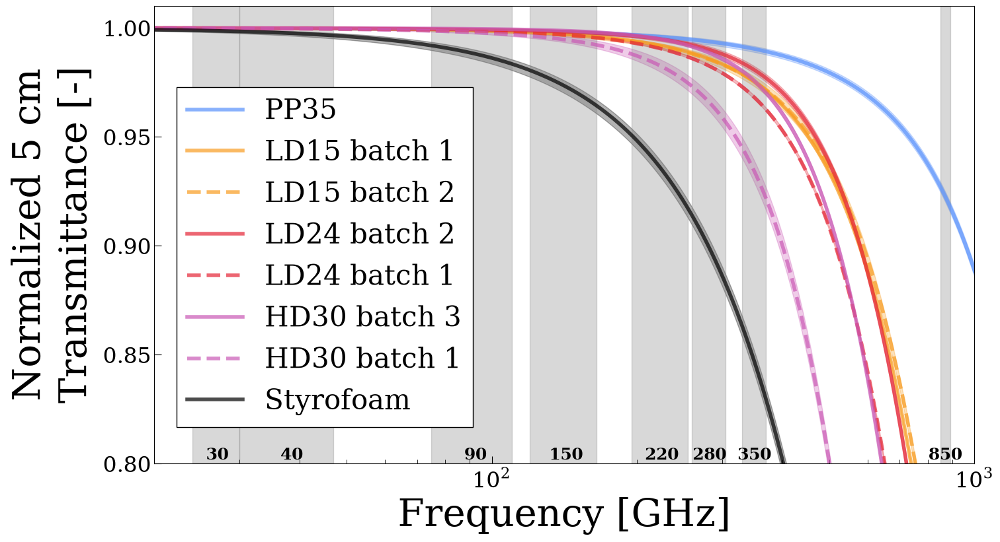

In [38]:
from matplotlib.ticker import NullFormatter

DISPLAY_MAP2 = {
    "PP35 0.32 cm": ["PP35", colors[0], '-'],
    "LD15_batch1": ["LD15 batch 1", colors[1], '-'],
    "LD15_batch2": ["LD15 batch 2", colors[1], '--'],
    "LD24_batch2": ["LD24 batch 2", colors[2], '-'],
    "LD24_batch1": ["LD24 batch 1", colors[2], '--'],
    "HD30_batch3": ["HD30 batch 3", comb_batches['HD30_batch1']['color'], '-'],
    "HD30_batch1": ["HD30 batch 1", comb_batches['HD30_batch1']['color'], '--'],
    "Styrofoam_batch1": ["Styrofoam", 'k', '-'],
}

fig, ax = plt.subplots(figsize=(16, 9), dpi=100)

# Plot measurements and fits
for bname in DISPLAY_MAP2.keys():
    b = comb_batches[bname]
    label, color, ls = DISPLAY_MAP2[bname]

    ns_T = b['ns_T_5cm']
    ns_T_upper = b['T_upper_5cm']
    ns_T_lower = b['T_lower_5cm']

    ns_T_upper2 = 2*ns_T_upper - ns_T
    ns_T_lower2 = 2*ns_T_lower - ns_T

    if bname not in ['LD15 batch1 2.65 cm', 'LD24 batch1 2.60 cm']:
        plt.fill_between(f, ns_T_lower2, ns_T_upper2, color=color, alpha=0.3)

    plt.plot(f, ns_T, color=color, lw=4, label=label, linestyle=ls, alpha=0.7)

xticks = []
for band, (i, j) in band_windows_full.items():
    plt.axvspan(i, j, color='gray', alpha=0.3)
    plt.text((i+j)/2, 0.80, band, horizontalalignment='center', verticalalignment='bottom', fontsize=18, color='black', fontweight='bold')

ax.legend(loc='lower left', bbox_to_anchor=(0.01, 0.05), fontsize=30, edgecolor='black', facecolor='white', framealpha=1, fancybox=False)

plt.xlim(20, 1000)
ax.yaxis.set_major_locator(MultipleLocator(0.05))
plt.ylim(0.8, 1.01)
plt.xscale('log')
ax.xaxis.set_minor_formatter(NullFormatter())

plt.xlabel('Frequency [GHz]', fontsize=42)
plt.ylabel('Normalized 5 cm\nTransmittance [-]', fontsize=42)
plt.gcf().set_facecolor('white')
plt.savefig('5cm_spectra-d.pdf', bbox_inches='tight', facecolor='white')
plt.show()

In [39]:
rows = []

# header = ["Sample"] + [f"T{band} [%]" for band in band_windows_full.keys()]
# rows.append(dict(zip(header, header)))

for bname, b in list(comb_batches.items()):
    if bname not in ['Styrofoam_batch1', 'LD15 batch1 2.65 cm', 'LD15 batch2 0.30 cm', 'LD24 batch1 2.60 cm', 'LD24 batch2 0.34 cm', 'HD30_batch1', 'HD30_batch2', 'HD30_batch3', 'HD80', 'HD110']:
        continue

    row = {"Sample": bname}
    
    T_lower, ns_T, T_upper = b['T_lower_5cm'], b['ns_T_5cm'], b['T_upper_5cm']

    # --- band-averaged transmittance ---
    for band_name, (lo_f, hi_f) in band_windows_full.items():
        sel = (f > lo_f) & (f < hi_f)

        val = 100*float(np.mean(ns_T[sel]))
        upper_val = 100*float(np.mean(T_upper[sel]))
        lower_val = 100*float(np.mean(T_lower[sel]))

        up = upper_val - val
        lo = val - lower_val

        row[f"T{band_name} [%]"] = format_unc(val, lo, up)

    rows.append(row)

df = pd.DataFrame(rows)
df

# for _, row in df.iterrows():
#     cells = [row["Sample"]] + [row[f"T{band} [%]"] for band in band_windows_full.keys()]
#     print(" & ".join(cells) + r" \\")

,Sample,T30 [%],T40 [%],T90 [%],T150 [%],T220 [%],T280 [%],T350 [%],T850 [%]
0,Styrofoam_batch1,$99.86^{+0.03}_{-0.05}$,$99.75^{+0.04}_{-0.07}$,$98.80^{+0.09}_{-0.13}$,$97.3^{+0.1}_{-0.2}$,$93.5^{+0.2}_{-0.2}$,$89.9^{+0.2}_{-0.2}$,$84.7^{+0.3}_{-0.3}$,$25.8^{+0.3}_{-0.3}$
1,HD30_batch1,$99.979^{+0.005}_{-0.011}$,$99.961^{+0.009}_{-0.015}$,$99.79^{+0.03}_{-0.04}$,$99.44^{+0.07}_{-0.07}$,$98.2^{+0.1}_{-0.1}$,$96.6^{+0.2}_{-0.2}$,$93.4^{+0.2}_{-0.2}$,$24.8^{+0.3}_{-0.3}$
2,HD30_batch2,$99.969^{+0.005}_{-0.012}$,$99.941^{+0.008}_{-0.016}$,$99.69^{+0.02}_{-0.03}$,$99.24^{+0.04}_{-0.05}$,$97.92^{+0.08}_{-0.09}$,$96.4^{+0.1}_{-0.1}$,$93.9^{+0.2}_{-0.2}$,$38.4^{+0.1}_{-0.1}$
3,HD30_batch3,$99.995^{+0.002}_{-0.005}$,$99.991^{+0.003}_{-0.006}$,$99.955^{+0.009}_{-0.013}$,$99.87^{+0.02}_{-0.02}$,$99.46^{+0.03}_{-0.04}$,$98.84^{+0.05}_{-0.05}$,$97.55^{+0.06}_{-0.06}$,$53.2^{+0.2}_{-0.2}$


# Estimating Cell Sizes

In [40]:
comb_batches['LD15_batch1']['cell_size'] = 380e-6
comb_batches['LD15_batch2']['cell_size'] = 380e-6
comb_batches['LD24_batch1']['cell_size'] = 300e-6
comb_batches['LD24_batch2']['cell_size'] = 300e-6
comb_batches['HD30_batch1']['cell_size']  = 400e-6
comb_batches['HD30_batch2']['cell_size']  = 400e-6
comb_batches['HD30_batch3']['cell_size']  = 400e-6
# comb_batches['HD60 2.03 cm']['cell_size'] = 400e-6
comb_batches['HD80_batch1']['cell_size'] = 600e-6
comb_batches['HD110_batch1']['cell_size'] = 1050e-6

rows = []

def _cm_factor(n_p):
    np2 = n_p**2
    return np.abs((np2 + 2)*(1 + 2*np2) - 2*(np2 - 1)**2) / np.abs((1 + 2*np2)*(np2 - 1))

def eff_cell_diameter(K_Mie_GHz, K_Ray_GHz, n_p=1.54, n_m=1.0003, c=3e8):
    m   = n_p / n_m
    return c * (m - 1) * K_Mie_GHz*1e9 / (n_m * np.pi * np.sqrt(6) * (K_Ray_GHz*1e9)**2) * _cm_factor(n_p)

def eff_wall_thickness(K_Mie_GHz, d, C, f_m, n_p=1.54, n_m=1.0003, c=3e8):
    m   = n_p / n_m
    C_m = C * 100
    return c / (2 * n_m * np.pi * (m - 1) * K_Mie_GHz*1e9) * np.sqrt(C_m * d / (6 * f_m))

def wall_thickness(d, f_m):
    return d/2 * (1 - f_m**(1/3))

for bname, b in comb_batches.items():
    if 'HD' not in bname and 'LD' not in bname:
        continue

    density = b['density']
    rho_p = b['rho_p']
    n_p   = b['n_p']
    f_p   = b['f_p']

    C     = b['params'][1]
    K_Ray = b['params'][2]
    K_Mie = b['params'][3]

    d_inv = eff_cell_diameter(K_Mie, K_Ray, n_p=n_p)

    f_m = 1 - f_p
    ell   = eff_wall_thickness(K_Mie, d_inv, C, f_m, n_p=n_p)
    l_th  = wall_thickness(b['cell_size'], f_m)

    rows.append({
        "sample":           bname,
        "density [kg/m^3]": b["density"],
        "d_th [um]":        f"{b['cell_size'] * 1e6:.2f}",
        "ell_th [um]":      f"{l_th * 1e6:.2f}",
        "ell_th/d_th":      f"{l_th / (b['cell_size']):.2e}",
        "d [um]":           f"{d_inv * 1e6:.2f}",
        "ell [um]":         f"{ell * 1e6:.2f}",
        "ell/d":            f"{ell / d_inv:.2e}",
    })

df = pd.DataFrame(rows).set_index("sample").sort_values("density [kg/m^3]")
df

,density [kg/m^3],d_th [um],ell_th [um],ell_th/d_th,d [um],ell [um],ell/d
sample,,,,,,,
LD15_batch1,15.0,380.00,0.95,2.49e-03,91.62,0.83,9.11e-03
LD15_batch2,15.0,380.00,0.95,2.49e-03,86.38,0.81,9.33e-03
LD24_batch1,24.0,300.00,1.24,4.14e-03,118.73,0.97,8.15e-03
LD24_batch2,24.0,300.00,1.24,4.14e-03,197.22,0.68,3.45e-03
HD30_batch3,30.0,400.00,2.04,5.10e-03,332.58,0.63,1.90e-03
HD30_batch2,30.0,400.00,2.04,5.10e-03,94.82,1.26,1.33e-02
HD30_batch1,30.0,400.00,2.04,5.10e-03,168.96,1.29,7.61e-03
HD80_batch1,80.0,600.00,8.54,1.42e-02,2570.50,0.84,3.28e-04
HD110_batch1,110.0,1050.00,20.88,1.99e-02,784.81,8.54,1.09e-02


# Custom loss plots

Secondary scattering matters for HD110 in band, matters for HD80 after ~300 GHz.

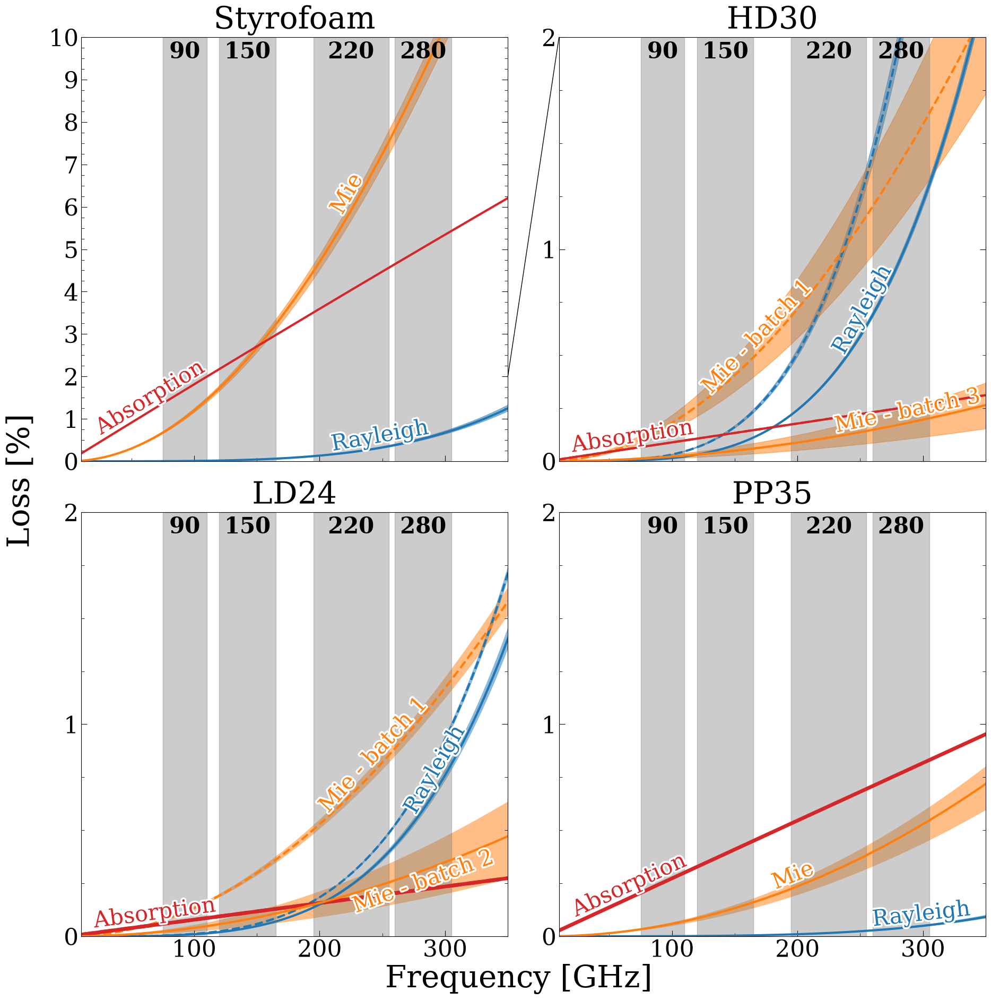

In [41]:
from matplotlib.patches import ConnectionPatch

fig, axes = plt.subplots(2, 2, figsize=(22, 22), sharex=True)
ax0, ax1, ax2, ax3 = axes.flatten()

for ax in axes.flatten():
    ax.set_rasterization_zorder(1)

## Styrofoam Batches

bname = 'Styrofoam_batch1'
b = comb_batches[bname]

ax0.set_xlim(10, 350)
ax0.set_ylim(0, 10)

Abs, Abs_upper, Abs_lower, Abs_color, _ = b["estimates"]["Abs"].values()
Ray, Ray_upper, Ray_lower, Ray_color, _ = b["estimates"]["Ray"].values()
Mie, Mie_upper, Mie_lower, Mie_color, _ = b["estimates"]["Mie"].values()

ax0.plot(f, Ray, color=Ray_color, lw=3,  zorder=2)
ax0.plot(f, Mie, color=Mie_color, lw=3, zorder=2)
ax0.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, alpha=0.5, zorder=0)
ax0.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, alpha=0.5, zorder=0)

ax0.plot(f, Abs, color=Abs_color, lw=3, zorder=2)

fig.canvas.draw()
for freq, arr, label, color in [
    (230, Mie, 'Mie', Mie_color),
    (250, Ray, 'Rayleigh', Ray_color),
    (70, Abs,  'Absorption', Abs_color)
]:
    idx = np.argmin(np.abs(f - freq))
    p0 = ax0.transData.transform((f[idx-10], arr[idx-10]))
    p1 = ax0.transData.transform((f[idx+10], arr[idx+10]))
    angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
    ax0.text(f[idx], arr[idx], label, color=color, fontsize=30,
                ha='center', va='bottom', rotation=angle, rotation_mode='anchor')

ax0.set_title('Styrofoam', y=1.01, fontsize=42)

## HD30 Batches
j = 0
linestyles = ['--', '-']

for bname, b in comb_batches.items():
    if bname not in ['HD30_batch1', 'HD30_batch3']:
        continue
    batch_num = bname.split('_')[-1][-1]

    ax1.set_xlim(10, 350)
    ax1.set_ylim(0, 2)

    Abs, Abs_upper, Abs_lower, Abs_color, _ = b["estimates"]["Abs"].values()
    Ray, Ray_upper, Ray_lower, Ray_color, _ = b["estimates"]["Ray"].values()
    Mie, Mie_upper, Mie_lower, Mie_color, _ = b["estimates"]["Mie"].values()

    ax1.plot(f, Ray, color=Ray_color, lw=3, ls=linestyles[j], zorder=2)
    ax1.plot(f, Mie, color=Mie_color, lw=3, ls=linestyles[j], zorder=2)
    ax1.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, alpha=0.5, zorder=0)
    ax1.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, alpha=0.5, zorder=0)

    ax1.plot(f, Abs, color=Abs_color, lw=3, ls=linestyles[j], zorder=2)

    fig.canvas.draw()

    if j == 1:
        for freq, arr, label, color in [
            (290, Mie, f'Mie - batch {batch_num}', Mie_color),
            (260, Ray, 'Rayleigh', Ray_color),
        ]:
            idx = np.argmin(np.abs(f - freq))
            p0 = ax1.transData.transform((f[idx-10], arr[idx-10]))
            p1 = ax1.transData.transform((f[idx+10], arr[idx+10]))
            angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
            ax1.text(f[idx], arr[idx], label, color=color, fontsize=30,
                        ha='center', va='bottom', rotation=angle, rotation_mode='anchor')
        
    else:
        for freq, arr, label, color in [
            (70, Abs, 'Absorption', Abs_color),
            (175, Mie, f'Mie - batch {batch_num}', Mie_color),
        ]:
            idx = np.argmin(np.abs(f - freq))
            p0 = ax1.transData.transform((f[idx-10], arr[idx-10]))
            p1 = ax1.transData.transform((f[idx+10], arr[idx+10]))
            angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
            ax1.text(f[idx], arr[idx], label, color=color, fontsize=30,
                     ha='center', va='bottom', rotation=angle, rotation_mode='anchor')
        
    j += 1

ax1.set_title('HD30', y=1.01, fontsize=42)

## LD24
bname = 'LD24_batch1'
b = comb_batches[bname]
display_name = DISPLAY_MAP.get(bname, bname)

ax2.set_xlim(10, 350)
ax2.set_ylim(0, 2)

Abs, Abs_upper, Abs_lower, Abs_color, Abs_ls  = b["estimates"]["Abs"].values()
Ray, Ray_upper, Ray_lower, Ray_color, Ray_ls  = b["estimates"]["Ray"].values()
Mie, Mie_upper, Mie_lower, Mie_color, Mie_ls  = b["estimates"]["Mie"].values()

ax2.plot(f, Abs, color=Abs_color, lw=5, linestyle=linestyles[0], zorder=2)
ax2.plot(f, Ray, color=Ray_color, lw=3, linestyle=linestyles[0], zorder=2)
ax2.plot(f, Mie, color=Mie_color, lw=3, linestyle=linestyles[0], zorder=2)
ax2.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, edgecolor='none', alpha=0.5, zorder=0)
ax2.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, edgecolor='none', alpha=0.5, zorder=0)

fig.canvas.draw()
for freq, arr, label, color, fs, va in [
    (250, Mie, 'Mie - batch 1',       Mie_color, 30, 'bottom'),
]:
    idx = np.argmin(np.abs(f - freq))
    p0 = ax2.transData.transform((f[idx-10], arr[idx-10]))
    p1 = ax2.transData.transform((f[idx+10], arr[idx+10]))
    angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
    ax2.text(freq, arr[idx], label, color=color, fontsize=fs, ha='center', va=va, rotation=angle, rotation_mode='anchor')

ax2.set_title(bname.split('_')[0], y=1.01, fontsize=42)

bname = 'LD24_batch2'
b = comb_batches[bname]
display_name = DISPLAY_MAP.get(bname, bname)

Abs, Abs_upper, Abs_lower, Abs_color, Abs_ls  = b["estimates"]["Abs"].values()
Ray, Ray_upper, Ray_lower, Ray_color, Ray_ls  = b["estimates"]["Ray"].values()
Mie, Mie_upper, Mie_lower, Mie_color, Mie_ls  = b["estimates"]["Mie"].values()

ax2.plot(f, Abs, color=Abs_color, lw=5, linestyle=linestyles[1], zorder=2)
ax2.plot(f, Ray, color=Ray_color, lw=3, linestyle=linestyles[1], zorder=2)
ax2.plot(f, Mie, color=Mie_color, lw=3, linestyle=linestyles[1], zorder=2)
ax2.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, edgecolor='none', alpha=0.5, zorder=0)
ax2.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, edgecolor='none', alpha=0.5, zorder=0)

fig.canvas.draw()
for freq, arr, label, color, fs, va in [
    (280, Mie, 'Mie - batch 2', Mie_color, 30, 'top'),
    (70, Abs, 'Absorption', Abs_color, 30, 'bottom'),
    (300, Ray, 'Rayleigh',  Ray_color, 30, 'bottom'),
    ]:
    idx = np.argmin(np.abs(f - freq))
    p0 = ax2.transData.transform((f[idx-10], arr[idx-10]))
    p1 = ax2.transData.transform((f[idx+10], arr[idx+10]))
    angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
    ax2.text(freq, arr[idx], label, color=color, fontsize=fs, ha='center', va=va, rotation=angle, rotation_mode='anchor')

## PP35
bname = 'PP35 0.32 cm'
b = comb_batches[bname]

ax3.set_xlim(10, 350)
ax3.set_ylim(0, 2)

Abs, Abs_upper, Abs_lower, Abs_color, Abs_ls  = b["estimates"]["Abs"].values()
Ray, Ray_upper, Ray_lower, Ray_color, Ray_ls  = b["estimates"]["Ray"].values()
Mie, Mie_upper, Mie_lower, Mie_color, Mie_ls  = b["estimates"]["Mie"].values()

ax3.plot(f, Abs, color=Abs_color, lw=5, linestyle=linestyles[1], zorder=2)
ax3.plot(f, Ray, color=Ray_color, lw=3, linestyle=linestyles[1], zorder=2)
ax3.plot(f, Mie, color=Mie_color, lw=3, linestyle=linestyles[1], zorder=2)
# ax3.fill_between(f, Abs_upper, Abs_lower, color=Abs_color, edgecolor='none', alpha=0.5, zorder=0)
ax3.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, edgecolor='none', alpha=0.5, zorder=0)
ax3.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, edgecolor='none', alpha=0.5, zorder=0)

fig.canvas.draw()
for freq, arr, label, color, fs, va in [
    (70, Abs,  'Absorption', Abs_color, 30, 'bottom'),
    (300, Ray, 'Rayleigh',            Ray_color, 30, 'bottom'),
    (200, Mie, 'Mie', Mie_color, 30, 'bottom'),
]:
    idx = np.argmin(np.abs(f - freq))
    p0 = ax3.transData.transform((f[idx-10], arr[idx-10]))
    p1 = ax3.transData.transform((f[idx+10], arr[idx+10]))
    angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
    ax3.text(freq, arr[idx], label, color=color, fontsize=fs, ha='center', va=va, rotation=angle, rotation_mode='anchor', zorder=10)

ax3.set_title(bname.split(' ')[0], y=1.01, fontsize=42)

## General
for ax in axes.flatten():
    ax.yaxis.set_major_locator(MultipleLocator(1))
    ax.yaxis.set_minor_locator(MultipleLocator(0.25))
    ax.xaxis.set_major_locator(MultipleLocator(100))
    ax.xaxis.set_minor_locator(MultipleLocator(50))
    ax.tick_params(axis='both', which='major', labelsize=32)
    ax.tick_params(axis='y', which='both', left=True, right=True)
    for band, (lbound, ubound) in band_windows_full.items():
        if band not in ["90", "150", "220", "280"]:
            continue
        band_center = (lbound + ubound) / 2
        ax.text(band_center, 0.99*ax.get_ylim()[1], band, color='k', ha='center', va='top', fontsize=30, fontweight='bold')
        ax.axvspan(lbound, ubound, alpha=0.4, color='gray', zorder=0)

fig.supxlabel('Frequency [GHz]', fontsize=42, y=0.06)
fig.supylabel('Loss [%]', fontsize=42, x=0.06)
plt.subplots_adjust(hspace=0.12, wspace=0.12)

con = ConnectionPatch(
    xyA=(0, 2), coordsA=ax1.get_yaxis_transform(),
    xyB=(1, 2), coordsB=ax0.get_yaxis_transform(),
    color="k", linewidth=1
)
fig.add_artist(con)

for ax in axes.flatten():
    for txt in ax.texts:
        if mcolors.to_rgb(txt.get_color()) == (0.0, 0.0, 0.0):
            continue
        txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])

plt.gcf().set_facecolor('white')
plt.savefig('components-d.pdf', bbox_inches='tight', facecolor='white')
plt.show()

Tweaked version with context for SPIE poster

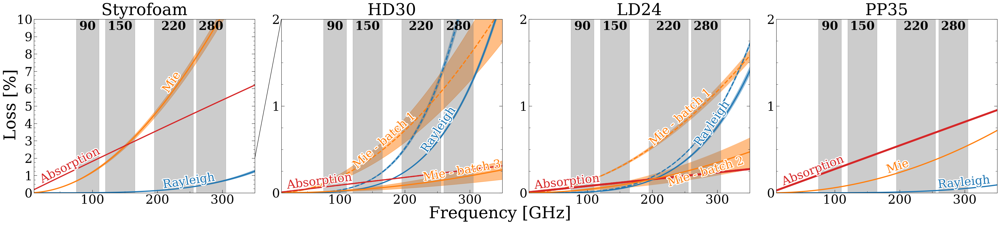

In [42]:
from matplotlib.patches import ConnectionPatch

fig, axes = plt.subplots(1, 4, figsize=(44, 8), sharex=True)
ax0, ax1, ax2, ax3 = axes.flatten()

for ax in axes.flatten():
    ax.set_rasterization_zorder(1)

## Styrofoam Batches

bname = 'Styrofoam_batch1'
b = comb_batches[bname]

ax0.set_xlim(10, 350)
ax0.set_ylim(0, 10)

Abs, Abs_upper, Abs_lower, Abs_color, _ = b["estimates"]["Abs"].values()
Ray, Ray_upper, Ray_lower, Ray_color, _ = b["estimates"]["Ray"].values()
Mie, Mie_upper, Mie_lower, Mie_color, _ = b["estimates"]["Mie"].values()

ax0.plot(f, Ray, color=Ray_color, lw=3,  zorder=2)
ax0.plot(f, Mie, color=Mie_color, lw=3, zorder=2)
ax0.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, alpha=0.5, zorder=0)
ax0.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, alpha=0.5, zorder=0)

ax0.plot(f, Abs, color=Abs_color, lw=3, zorder=2)

fig.canvas.draw()
for freq, arr, label, color in [
    (230, Mie, 'Mie', Mie_color),
    (250, Ray, 'Rayleigh', Ray_color),
    (70, Abs,  'Absorption', Abs_color)
]:
    idx = np.argmin(np.abs(f - freq))
    p0 = ax0.transData.transform((f[idx-10], arr[idx-10]))
    p1 = ax0.transData.transform((f[idx+10], arr[idx+10]))
    angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
    ax0.text(f[idx], arr[idx], label, color=color, fontsize=30,
                ha='center', va='bottom', rotation=angle, rotation_mode='anchor')

ax0.set_title('Styrofoam', y=1.01, fontsize=42)

## HD30 Batches
j = 0
linestyles = ['--', '-']

for bname, b in comb_batches.items():
    if bname not in ['HD30_batch1', 'HD30_batch3']:
        continue
    batch_num = bname.split('_')[-1][-1]

    ax1.set_xlim(10, 350)
    ax1.set_ylim(0, 2)

    Abs, Abs_upper, Abs_lower, Abs_color, _ = b["estimates"]["Abs"].values()
    Ray, Ray_upper, Ray_lower, Ray_color, _ = b["estimates"]["Ray"].values()
    Mie, Mie_upper, Mie_lower, Mie_color, _ = b["estimates"]["Mie"].values()

    ax1.plot(f, Ray, color=Ray_color, lw=3, ls=linestyles[j], zorder=2)
    ax1.plot(f, Mie, color=Mie_color, lw=3, ls=linestyles[j], zorder=2)
    ax1.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, alpha=0.5, zorder=0)
    ax1.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, alpha=0.5, zorder=0)

    ax1.plot(f, Abs, color=Abs_color, lw=3, ls=linestyles[j], zorder=2)

    fig.canvas.draw()

    if j == 1:
        for freq, arr, label, color in [
            (290, Mie, f'Mie - batch {batch_num}', Mie_color),
            (260, Ray, 'Rayleigh', Ray_color),
        ]:
            idx = np.argmin(np.abs(f - freq))
            p0 = ax1.transData.transform((f[idx-10], arr[idx-10]))
            p1 = ax1.transData.transform((f[idx+10], arr[idx+10]))
            angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
            ax1.text(f[idx], arr[idx], label, color=color, fontsize=30,
                        ha='center', va='bottom', rotation=angle, rotation_mode='anchor')
        
    else:
        for freq, arr, label, color in [
            (70, Abs, 'Absorption', Abs_color),
            (175, Mie, f'Mie - batch {batch_num}', Mie_color),
        ]:
            idx = np.argmin(np.abs(f - freq))
            p0 = ax1.transData.transform((f[idx-10], arr[idx-10]))
            p1 = ax1.transData.transform((f[idx+10], arr[idx+10]))
            angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
            ax1.text(f[idx], arr[idx], label, color=color, fontsize=30,
                     ha='center', va='bottom', rotation=angle, rotation_mode='anchor')
        
    j += 1

ax1.set_title('HD30', y=1.01, fontsize=42)

## LD24
bname = 'LD24_batch1'
b = comb_batches[bname]
display_name = DISPLAY_MAP.get(bname, bname)

ax2.set_xlim(10, 350)
ax2.set_ylim(0, 2)

Abs, Abs_upper, Abs_lower, Abs_color, Abs_ls  = b["estimates"]["Abs"].values()
Ray, Ray_upper, Ray_lower, Ray_color, Ray_ls  = b["estimates"]["Ray"].values()
Mie, Mie_upper, Mie_lower, Mie_color, Mie_ls  = b["estimates"]["Mie"].values()

ax2.plot(f, Abs, color=Abs_color, lw=5, linestyle=linestyles[0], zorder=2)
ax2.plot(f, Ray, color=Ray_color, lw=3, linestyle=linestyles[0], zorder=2)
ax2.plot(f, Mie, color=Mie_color, lw=3, linestyle=linestyles[0], zorder=2)
ax2.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, edgecolor='none', alpha=0.5, zorder=0)
ax2.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, edgecolor='none', alpha=0.5, zorder=0)

fig.canvas.draw()
for freq, arr, label, color, fs, va in [
    (250, Mie, 'Mie - batch 1',       Mie_color, 30, 'bottom'),
]:
    idx = np.argmin(np.abs(f - freq))
    p0 = ax2.transData.transform((f[idx-10], arr[idx-10]))
    p1 = ax2.transData.transform((f[idx+10], arr[idx+10]))
    angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
    ax2.text(freq, arr[idx], label, color=color, fontsize=fs, ha='center', va=va, rotation=angle, rotation_mode='anchor')

ax2.set_title(bname.split('_')[0], y=1.01, fontsize=42)

bname = 'LD24_batch2'
b = comb_batches[bname]
display_name = DISPLAY_MAP.get(bname, bname)

Abs, Abs_upper, Abs_lower, Abs_color, Abs_ls  = b["estimates"]["Abs"].values()
Ray, Ray_upper, Ray_lower, Ray_color, Ray_ls  = b["estimates"]["Ray"].values()
Mie, Mie_upper, Mie_lower, Mie_color, Mie_ls  = b["estimates"]["Mie"].values()

ax2.plot(f, Abs, color=Abs_color, lw=5, linestyle=linestyles[1], zorder=2)
ax2.plot(f, Ray, color=Ray_color, lw=3, linestyle=linestyles[1], zorder=2)
ax2.plot(f, Mie, color=Mie_color, lw=3, linestyle=linestyles[1], zorder=2)
ax2.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, edgecolor='none', alpha=0.5, zorder=0)
ax2.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, edgecolor='none', alpha=0.5, zorder=0)

fig.canvas.draw()
for freq, arr, label, color, fs, va in [
    (280, Mie, 'Mie - batch 2', Mie_color, 30, 'top'),
    (70, Abs, 'Absorption', Abs_color, 30, 'bottom'),
    (300, Ray, 'Rayleigh',  Ray_color, 30, 'bottom'),
    ]:
    idx = np.argmin(np.abs(f - freq))
    p0 = ax2.transData.transform((f[idx-10], arr[idx-10]))
    p1 = ax2.transData.transform((f[idx+10], arr[idx+10]))
    angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
    ax2.text(freq, arr[idx], label, color=color, fontsize=fs, ha='center', va=va, rotation=angle, rotation_mode='anchor')

## PP35
bname = 'PP35 0.32 cm'
b = comb_batches[bname]

ax3.set_xlim(10, 350)
ax3.set_ylim(0, 2)

Abs, Abs_upper, Abs_lower, Abs_color, Abs_ls  = b["estimates"]["Abs"].values()
Ray, Ray_upper, Ray_lower, Ray_color, Ray_ls  = b["estimates"]["Ray"].values()
Mie, Mie_upper, Mie_lower, Mie_color, Mie_ls  = b["estimates"]["Mie"].values()

ax3.plot(f, Abs, color=Abs_color, lw=5, linestyle=linestyles[1], zorder=2)
ax3.plot(f, Ray, color=Ray_color, lw=3, linestyle=linestyles[1], zorder=2)
ax3.plot(f, Mie, color=Mie_color, lw=3, linestyle=linestyles[1], zorder=2)
# ax3.fill_between(f, Abs_upper, Abs_lower, color=Abs_color, edgecolor='none', alpha=0.5, zorder=0)
# ax3.fill_between(f, Ray_upper, Ray_lower, color=Ray_color, edgecolor='none', alpha=0.5, zorder=0)
# ax3.fill_between(f, Mie_upper, Mie_lower, color=Mie_color, edgecolor='none', alpha=0.5, zorder=0)

fig.canvas.draw()
for freq, arr, label, color, fs, va in [
    (70, Abs,  'Absorption', Abs_color, 30, 'bottom'),
    (300, Ray, 'Rayleigh',            Ray_color, 30, 'bottom'),
    (200, Mie, 'Mie', Mie_color, 30, 'bottom'),
]:
    idx = np.argmin(np.abs(f - freq))
    p0 = ax3.transData.transform((f[idx-10], arr[idx-10]))
    p1 = ax3.transData.transform((f[idx+10], arr[idx+10]))
    angle = np.degrees(np.arctan2(p1[1]-p0[1], p1[0]-p0[0]))
    ax3.text(freq, arr[idx], label, color=color, fontsize=fs, ha='center', va=va, rotation=angle, rotation_mode='anchor', zorder=10)

ax3.set_title(bname.split(' ')[0], y=1.01, fontsize=42)

## General
for ax in axes.flatten():
    ax.yaxis.set_major_locator(MultipleLocator(1))
    ax.yaxis.set_minor_locator(MultipleLocator(0.25))
    ax.xaxis.set_major_locator(MultipleLocator(100))
    ax.xaxis.set_minor_locator(MultipleLocator(50))
    ax.tick_params(axis='both', which='major', labelsize=32)
    ax.tick_params(axis='y', which='both', left=True, right=True)
    for band, (lbound, ubound) in band_windows_full.items():
        if band not in ["90", "150", "220", "280"]:
            continue
        band_center = (lbound + ubound) / 2
        ax.text(band_center, 0.99*ax.get_ylim()[1], band, color='k', ha='center', va='top', fontsize=30, fontweight='bold')
        ax.axvspan(lbound, ubound, alpha=0.4, color='gray', zorder=0)

fig.supxlabel('Frequency [GHz]', fontsize=42, y=-0.02)
fig.supylabel('Loss [%]', fontsize=42, x=0.1)
plt.subplots_adjust(hspace=0.12, wspace=0.12)

con = ConnectionPatch(
    xyA=(0, 2), coordsA=ax1.get_yaxis_transform(),
    xyB=(1, 2), coordsB=ax0.get_yaxis_transform(),
    color="k", linewidth=1
)
fig.add_artist(con)

for ax in axes.flatten():
    for txt in ax.texts:
        if mcolors.to_rgb(txt.get_color()) == (0.0, 0.0, 0.0):
            continue
        txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])

plt.gcf().set_facecolor('white')
plt.savefig('components-d.pdf', bbox_inches='tight', facecolor='white')
plt.show()

In [43]:
Ray1 = next(iter(comb_batches['HD30_batch1']["estimates"]["Ray"].values()))
Ray2 = next(iter(comb_batches['HD30_batch2']["estimates"]["Ray"].values()))
Ray3 = next(iter(comb_batches['HD30_batch3']["estimates"]["Ray"].values()))

Mie1 = next(iter(comb_batches['HD30_batch1']["estimates"]["Mie"].values()))
Mie2 = next(iter(comb_batches['HD30_batch2']["estimates"]["Mie"].values()))
Mie3 = next(iter(comb_batches['HD30_batch3']["estimates"]["Mie"].values()))

Rays = np.array([Ray1, Ray2, Ray3])
Mies = np.array([Mie1, Mie2, Mie3])

idx = np.argmin(np.abs(f - 280))
min_key = np.argmin(Rays[:, idx])
max_key = np.argmax(Rays[:, idx])

min_sigma = (comb_batches[f'HD30_batch{min_key+1}']["estimates"]["Ray"]['upper'][idx] - comb_batches[f'HD30_batch{min_key+1}']["estimates"]["Ray"]['lower'][idx]) / 2
max_sigma = (comb_batches[f'HD30_batch{max_key+1}']["estimates"]["Ray"]['upper'][idx] - comb_batches[f'HD30_batch{max_key+1}']["estimates"]["Ray"]['lower'][idx]) / 2

print(f"At 280 GHz, min Rayleigh is Batch {min_key+1} with value {Rays[min_key, idx]:.4f} ± {min_sigma:.4f}, max Rayleigh is Batch {max_key+1} with value {Rays[max_key, idx]:.4f} ± {max_sigma:.4f}, difference: {(Rays[max_key, idx] - Rays[min_key, idx]):.4f} ± {(min_sigma**2 + max_sigma**2)**0.5:.4f}")
      
min_key = np.argmin(Mies[:, idx])
max_key = np.argmax(Mies[:, idx])

min_sigma = (comb_batches[f'HD30_batch{min_key+1}']["estimates"]["Mie"]['upper'][idx] - comb_batches[f'HD30_batch{min_key+1}']["estimates"]["Mie"]['lower'][idx]) / 2
max_sigma = (comb_batches[f'HD30_batch{max_key+1}']["estimates"]["Mie"]['upper'][idx] - comb_batches[f'HD30_batch{max_key+1}']["estimates"]["Mie"]['lower'][idx]) / 2

print(f"At 280 GHz, min Mie is Batch {min_key+1} with value {Mies[min_key, idx]:.4f} ± {min_sigma:.4f}, max Mie is Batch {max_key+1} with value {Mies[max_key, idx]:.4f} ± {max_sigma:.4f}, difference: {(Mies[max_key, idx] - Mies[min_key, idx]):.4f} ± {(min_sigma**2 + max_sigma**2)**0.5:.4f}")

At 280 GHz, min Rayleigh is Batch 3 with value 0.9274 ± 0.0178, max Rayleigh is Batch 1 with value 1.9450 ± 0.0673, difference: 1.0176 ± 0.0696
At 280 GHz, min Mie is Batch 3 with value 0.1714 ± 0.0696, max Mie is Batch 2 with value 2.3733 ± 0.1476, difference: 2.2019 ± 0.1632


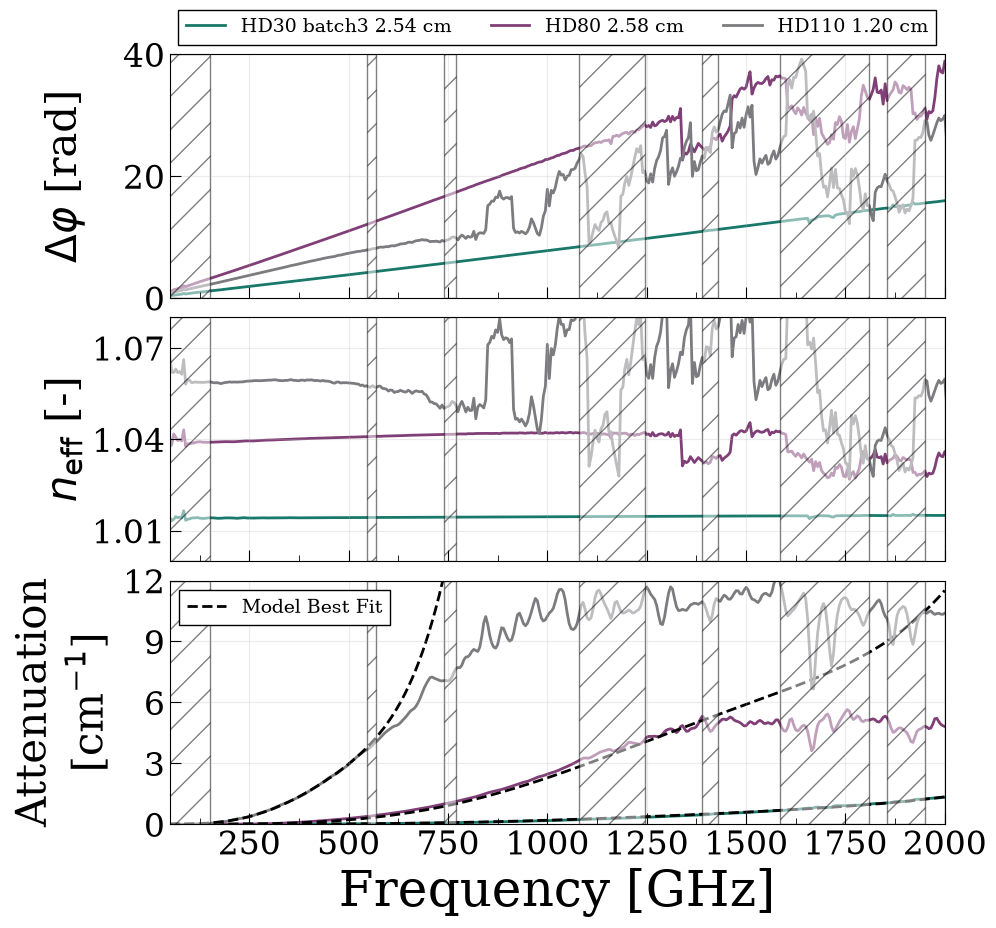

In [44]:
fig, axs = plt.subplots(
    3, 1, sharex=True, figsize=(10, 10),
    gridspec_kw=dict(height_ratios=[1, 1, 1], hspace=0.08)
)

for bname, b in batches.items():
    for sample in b:
        if sample not in ['HD30 batch3 2.54 cm', 'HD80 batch1 2.58 cm', 'HD110 batch1 1.20 cm']:
            continue


        f_    = b[sample]['f']
        color = b[sample]['color']

        label = sample.replace('batch1 ', '')

        axs[0].plot(f_, b[sample]['phase_diff'],  color=color, lw=2, zorder=-10)
        axs[1].plot(f_, b[sample]['n'],           color=color, lw=2, zorder=-10)
        axs[2].plot(f_, b[sample]['alpha'],       color=color, lw=2, label=label, zorder=-10)
        axs[2].plot(f, comb_batches[bname]['ns_alpha'], color='k', linestyle='--', lw=2, zorder=-10)

# Axis labels
axs[0].set_ylabel(r'$\Delta \varphi$ [rad]', fontsize=30)
axs[1].set_ylabel(r'$n_{\rm eff}$ [-]', fontsize=30)
axs[2].set_ylabel(f'Attenuation\n'+r'[cm$^{-1}$]', fontsize=30)
axs[2].set_xlabel('Frequency [GHz]')

# Limits / ticks
for ax in axs:
    for i, j in zip(mask_starts, mask_stops):
        ax.axvspan(i, j, facecolor='white', hatch='/', edgecolor='k', alpha=0.5, zorder=1)
    ax.set_xlim(50, 2000)
    # ax.set_xlim(0, 200)
    ax.grid(True, alpha=0.25)
axs[1].xaxis.set_major_locator(MultipleLocator(250))
axs[1].xaxis.set_minor_locator(MultipleLocator(125))

for i, j in zip(mask_starts, mask_stops):
    if ((i == 0) or (j >= 1500)):
        continue

style_handles = [Line2D([0], [0], color='k', lw=2, linestyle='--', label='Model Best Fit')]

axs[0].set_ylim(0, 40)
axs[0].set_yticks([0, 20, 40])
axs[1].set_ylim(1, 1.08)
axs[1].set_yticks([1.01, 1.04, 1.07])
axs[2].set_ylim(0, 12)
axs[2].set_yticks([0, 3, 6, 9, 12])
# Legend (single, clean)

handles, labels = axs[2].get_legend_handles_labels()

axs[0].legend(handles, labels, fontsize=14, loc='lower center', 
               bbox_to_anchor=(0.5, 1), ncol=3, framealpha=1, edgecolor='black', facecolor='white', fancybox=False)

axs[2].legend(handles=style_handles, fontsize=14, loc='upper left', framealpha=1, edgecolor='black', facecolor='white', fancybox=False)

# Remove x tick labels on upper panels (sharex already, but makes it cleaner)
plt.subplots_adjust(hspace=0.08)
axs[0].label_outer()
axs[1].label_outer()

fig.align_ylabels([axs[0], axs[1]])
plt.savefig("phase_plot-e.pdf", bbox_inches='tight', facecolor='white')
plt.show()

In [45]:
from scipy.special import spherical_jn as _sjn

# Riccati-Bessel functions
def _psi(n, x):       return x * _sjn(n, x)
def _psi_p(n, x):     return _sjn(n, x) + x * _sjn(n, x, derivative=True)

# Thin-shell Mie Coefficients
def _ab_shell(n, m, x, delta):
    p, pp = _psi(n, x), _psi_p(n, x)
    bn = -1j * delta * (m**2 - 1) * p**2
    an = -1j * delta * (n*(n+1)*(m**2-1)/(m**2*x**2) * p**2 + (m**2-1)*pp**2)
    return an, bn

# Pi and Tau
def _pi_tau(nmax, tr):
    ct = np.cos(tr)
    PA, TA = np.zeros((nmax, len(tr))), np.zeros((nmax, len(tr)))
    pp, p  = np.zeros(len(tr)), np.ones(len(tr))
    for n in range(1, nmax+1):
        TA[n-1] = n*ct*p - (n+1)*pp;  PA[n-1] = p
        pp, p   = p, ((2*n+1)*ct*p - (n+1)*pp) / n
    return PA, TA

# Phase function for thin-shell Mie scattering
def _phase(al, bl, tr):
    PA, TA = _pi_tau(len(al), tr)
    S1 = np.zeros(len(tr), dtype=complex)
    S2 = np.zeros(len(tr), dtype=complex)
    for n, (a, b) in enumerate(zip(al, bl), 1):
        fac = (2*n+1)/(n*(n+1))
        S1 += fac*(a*PA[n-1]+b*TA[n-1])
        S2 += fac*(b*PA[n-1]+a*TA[n-1])
    P = (np.abs(S1)**2 + np.abs(S2)**2) / 2
    return P / (np.trapezoid(P*np.sin(tr), tr) * 2*np.pi)  # int_4pi = 1

# ---- Angular grid ----------------------------------------------------------
th_deg = np.linspace(0, 180, 181)
th_rad = np.deg2rad(th_deg)
th_rad[0] = 1e-6;  th_rad[-1] = np.pi - 1e-6
m40_90 = (th_deg >= 40) & (th_deg <= 90)   # mask: warm-environment wedge

# ---- Rayleigh fraction in 40-90 deg (frequency-independent) ---------------
P_ray = (3/(16*np.pi)) * (1 + np.cos(th_rad)**2)
F_Ray = 2*np.pi * np.trapezoid(P_ray[m40_90]*np.sin(th_rad[m40_90]), th_rad[m40_90])
print(f'Rayleigh fraction in 40-90 deg: {100*F_Ray:.1f}% of scattered power')

# ---- Thin-shell Mie fraction in 40-90 deg, vs frequency -------------------
c_mie   = 30.0    # GHz*cm
m_mie   = 1.54    # n_p / n_m  (n_m=1, n_p=1.54)
d_mie   = 400e-4  # cm  (400 um cell diameter)
ell_mie = 2e-4    # cm  (2 um wall thickness)
N_mul   = 30

# Compute on a coarse 10-GHz grid, then interpolate to the 1-GHz f array
F_Mie = np.empty(len(f))
for _i, _f in enumerate(f):
    _x  = np.pi * d_mie * _f / c_mie
    _dlt = np.pi * ell_mie * _f / c_mie
    _al, _bl = zip(*[_ab_shell(_n, m_mie, _x, _dlt) for _n in range(1, N_mul+1)])
    _P = _phase(list(_al), list(_bl), th_rad)
    F_Mie[_i] = 2*np.pi * np.trapezoid(_P[m40_90]*np.sin(th_rad[m40_90]), th_rad[m40_90])
print(f'Mie fraction in 40-90 deg: {100*F_Mie[np.argmin(np.abs(f-90))]:.1f}% at 90 GHz, '
      f'{100*F_Mie[np.argmin(np.abs(f-280))]:.1f}% at 280 GHz')

# ---- Loading calculation ---------------------------------------------------
from scipy.constants import k as k_B
T_bb   = 273.0    # K  (room-temperature blackbody)
Npol   = 1        # one polarization

# Samples: (display name, dict, estimates key)
DISPLAY_MAP3 = [
    ('Styrofoam',    comb_batches['Styrofoam_batch1']),
    ('HD30 batch 1', comb_batches['HD30_batch1']),
    ('HD30 batch 2', comb_batches['HD30_batch2']),
    (r'HD30 batch 3$^\dagger$', comb_batches['HD30_batch3']),
    ('LD24 batch 1', comb_batches['LD24_batch1']),
    (r'LD24 batch 2$^\dagger$', comb_batches['LD24_batch2']),
    (r'LD15 batch 1$^\dagger$', comb_batches['LD15_batch1']),
    ('LD15 batch 2', comb_batches['LD15_batch2']),
    ('PP35', comb_batches['PP35 0.32 cm']),
]

band_list  = ['90', '150', '220', '280']
bandwidths = [35.0, 45.0, 45.0, 65.0]   

hdr = f"{'Sample':<28}  {'Band':>4}  {'P_Ray[pW]':>10}  {'P_Mie[pW]':>10}  {'P_tot[pW]':>10}"

for disp_name, b in DISPLAY_MAP3:
    row_entries_odd = [f"\\multirow{{2}}{{*}}{{{disp_name}}}"]
    row_entries_even = ['']

    # The estimates are stored such that highest transmission is "upper", we invert the defintion explicitly here
    Ray_arr   = b['estimates']['Ray']['arr']
    Ray_lower = b['estimates']['Ray']['upper'] 
    Ray_upper = b['estimates']['Ray']['lower']

    Mie_arr   = b['estimates']['Mie']['arr']
    Mie_lower = b['estimates']['Mie']['upper']
    Mie_upper = b['estimates']['Mie']['lower']

    for i, (band, dnu) in enumerate(zip(bands, bandwidths)):
        row_entries = row_entries_odd if i % 2 == 0 else row_entries_even

        lo_f, hi_f = band_windows_full[band]
        dnu        = bandwidths[i]           # GHz
        sel        = (f > lo_f) & (f < hi_f)

        Ray_frac    = np.mean(Ray_arr[sel]) / 100.0
        Mie_frac    = np.mean(Mie_arr[sel]) / 100.0

        F_Mie_band  = np.mean(F_Mie[sel])

        # Optical loading calculation
        P_Ray       = Npol * k_B * T_bb * np.mean((Ray_arr[sel]/100.0)   * F_Ray) * dnu * 1e21
        P_Ray_lower = Npol * k_B * T_bb * np.mean((Ray_lower[sel]/100.0) * F_Ray) * dnu * 1e21
        P_Ray_upper = Npol * k_B * T_bb * np.mean((Ray_upper[sel]/100.0) * F_Ray) * dnu * 1e21
        P_Mie       = Npol * k_B * T_bb * np.mean((Mie_arr[sel]/100.0)   * F_Mie[sel]) * dnu * 1e21
        P_Mie_lower = Npol * k_B * T_bb * np.mean((Mie_lower[sel]/100.0) * F_Mie[sel]) * dnu * 1e21
        P_Mie_upper = Npol * k_B * T_bb * np.mean((Mie_upper[sel]/100.0) * F_Mie[sel]) * dnu * 1e21

        # Relative uncertainties
        P_Ray_lower = P_Ray-P_Ray_lower
        P_Ray_upper = P_Ray_upper-P_Ray
        P_Mie_lower = P_Mie - P_Mie_lower
        P_Mie_upper = P_Mie_upper - P_Mie

        # Total optical loading from scattering 
        P_scatter = P_Ray + P_Mie
        P_scatter_lower = np.sqrt(P_Ray_lower**2 + P_Mie_lower**2)
        P_scatter_upper = np.sqrt(P_Ray_upper**2 + P_Mie_upper**2)

        # formatters
        P_Ray_formatted = format_unc(P_Ray, P_Ray_lower, P_Ray_upper)
        P_Mie_formatted = format_unc(P_Mie, P_Mie_lower, P_Mie_upper)
        P_scatter_formatted = format_unc(P_scatter, P_scatter_lower, P_scatter_upper)

        row_entries.extend([P_scatter_formatted])

        # Optical loading from filter emission
        Abs = float(b['band_avgs'][(band, 'Abs')])
        T_RJ = Tphys * Abs / 100         #Temperature in K; converts from % to fraction
        P_ems = Npol * k * T_RJ * dnu * 1e21 #Power in pW; convert GHz Ã¢â€ â€™ Hz and Watts Ã¢â€ â€™ pW
        P_tot = P_scatter + P_ems
        
        P_tot_lower = np.sqrt(P_scatter_lower**2 + (P_ems)**2) # Assume order unity uncertainty
        P_tot_upper = np.sqrt(P_scatter_upper**2 + (P_ems)**2)
        row_entries.extend([format_val(P_ems), format_unc(P_tot, P_tot_lower, P_tot_upper)])

    print(" & ".join(row_entries_odd) + r" \\")
    print(" & ".join(row_entries_even) + r" \\[6pt]")

Rayleigh fraction in 40-90 deg: 34.3% of scattered power
Mie fraction in 40-90 deg: 35.9% at 90 GHz, 47.7% at 280 GHz
\multirow{2}{*}{Styrofoam} & $0.50^{+0.02}_{-0.02}$ & $2.21$ & $3^{+2}_{-2}$ & $4.6^{+0.2}_{-0.1}$ & $6.84$ & $11^{+7}_{-7}$ \\
 & $1.61^{+0.07}_{-0.05}$ & $4.37$ & $6^{+4}_{-4}$ & $11.2^{+0.4}_{-0.3}$ & $12.35$ & $20^{+10}_{-10}$ \\[6pt]
\multirow{2}{*}{HD30 batch 1} & $0.09^{+0.01}_{-0.01}$ & $0.11$ & $0.2^{+0.1}_{-0.1}$ & $1.2^{+0.1}_{-0.1}$ & $0.34$ & $1.5^{+0.4}_{-0.4}$ \\
 & $0.32^{+0.05}_{-0.05}$ & $0.22$ & $0.5^{+0.2}_{-0.2}$ & $3.4^{+0.3}_{-0.3}$ & $0.62$ & $4.0^{+0.7}_{-0.7}$ \\[6pt]
\multirow{2}{*}{HD30 batch 2} & $0.134^{+0.008}_{-0.008}$ & $0.11$ & $0.2^{+0.1}_{-0.1}$ & $1.43^{+0.07}_{-0.07}$ & $0.34$ & $1.8^{+0.3}_{-0.3}$ \\
 & $0.46^{+0.03}_{-0.03}$ & $0.22$ & $0.7^{+0.2}_{-0.2}$ & $3.8^{+0.2}_{-0.2}$ & $0.62$ & $4.4^{+0.6}_{-0.6}$ \\[6pt]
\multirow{2}{*}{HD30 batch 3$^\dagger$} & $0.015^{+0.004}_{-0.004}$ & $0.11$ & $0.1^{+0.1}_{-0.1}$ & $0.32^{+0.04}_{-

# Uncertainty analysis

Styrofoam_batch1


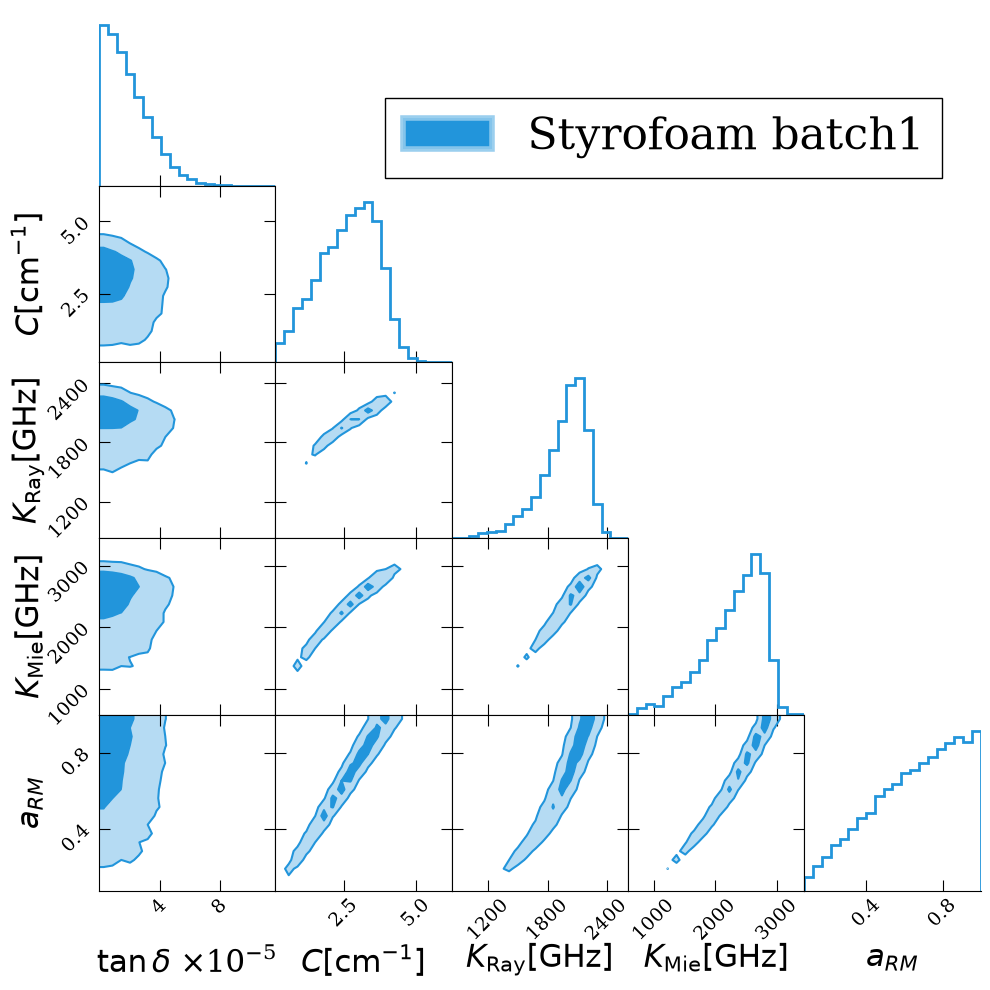

In [46]:
param_names = [r'$\tan\delta$', r'$C [\mathrm{cm}^{-1}]$', r'$K_{\mathrm{Ray}} [\mathrm{GHz}]$', r'$K_{\mathrm{Mie}} [\mathrm{GHz}]$', r'$a_{RM}$']

figure = plt.figure(figsize=(10,10))

for bname, b in comb_batches.items():
    if bname not in styro_batches:
        continue

    print(bname)

    samples      = b['samples']
    color        = b['color']

    fig = corner.corner(samples, 
                    show_titles=False, 
                    labels = param_names,            
                    use_math_text = True,
                    label_kwargs={"fontsize": 22},
                    max_n_ticks=3,
                    plot_datapoints=False,
                    show_median=False,
                    show_mean=False,
                    plot_density=False,
                    levels=[0.393, 0.864],
                    fill_contours=True,
                    color=color,
                    hist_kwargs={"linewidth": 2},
                    fig=figure)

for i, ax in enumerate(fig.axes):
    ax.tick_params(axis='both', labelsize=14)
    if i == 0:
        ax.spines['left'].set_visible(False)
    row, col = divmod(i, len(param_names))
    if col < row:
        ax.xaxis.set_tick_params(which='both', direction='in', top=True)
        ax.yaxis.set_tick_params(which='both', direction='in', right=True)
    if col == row:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_facecolor('white')

figure.canvas.draw()

for ax in figure.get_axes():
    if ax.xaxis.get_offset_text().get_text() != '':
        offset = ax.xaxis.get_offset_text().get_text()
        ax.set_xlabel(ax.get_xlabel() + f' {offset}', fontsize=22)
        ax.xaxis.get_offset_text().set_visible(False)
        
    if ax.yaxis.get_offset_text().get_text() != '':
        offset = ax.yaxis.get_offset_text().get_text()
        ax.set_ylabel(ax.get_ylabel() + f' {offset}', fontsize=22)
        ax.yaxis.get_offset_text().set_visible(False)

handles = get_corner_handles(styro_batches)

fig.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.95, 0.90), fontsize=32, edgecolor='black', facecolor='white', framealpha=1, fancybox=False)

fig.subplots_adjust(hspace=0, wspace=0)
plt.gcf().set_facecolor('white')
# plt.savefig('styro_params-b.pdf', bbox_inches='tight', facecolor='white')
plt.show()

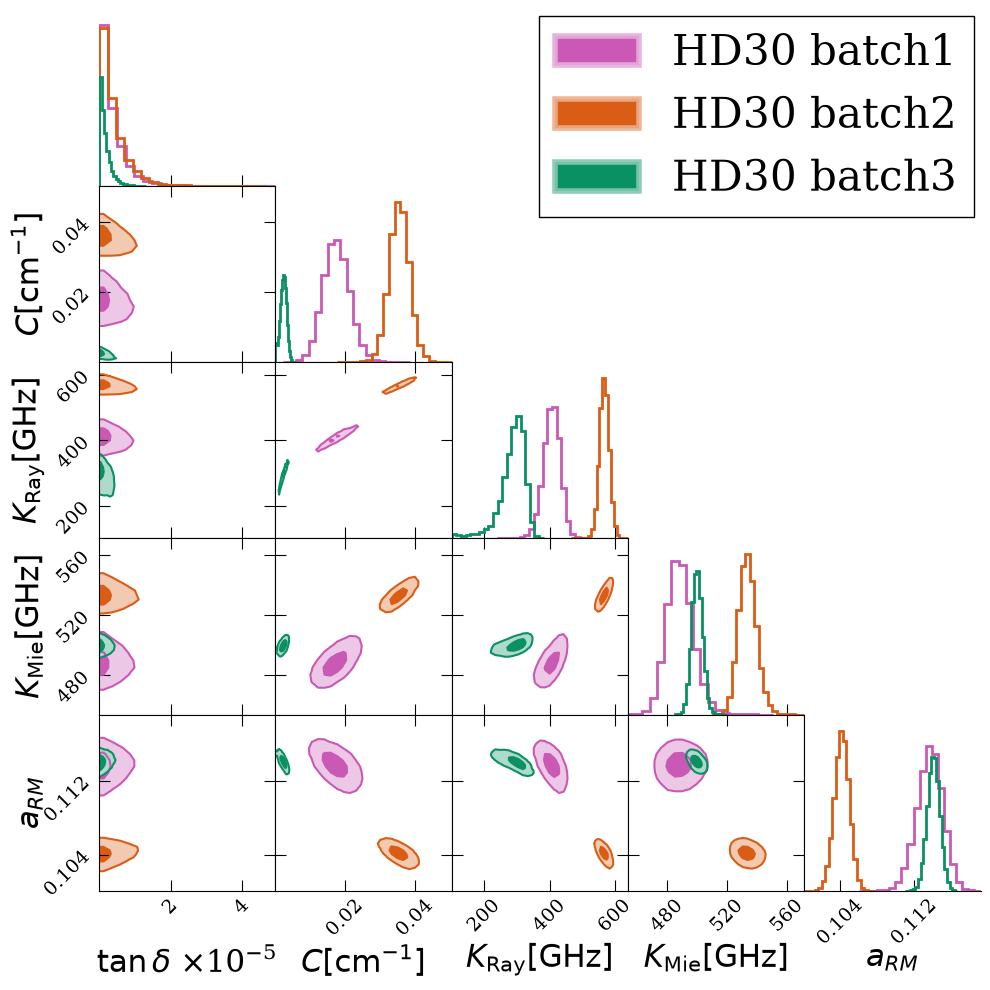

In [47]:
param_names = [r'$\tan\delta$', r'$C [\mathrm{cm}^{-1}]$', r'$K_{\mathrm{Ray}} [\mathrm{GHz}]$', r'$K_{\mathrm{Mie}} [\mathrm{GHz}]$', r'$a_{RM}$']

plot_batches = [*HD30_batches]

figure = plt.figure(figsize=(10,10))

for bname, b in comb_batches.items():
    if bname not in plot_batches:
        continue

    samples      = b['samples']
    color        = b['color']

    fig = corner.corner(samples, 
                    show_titles=False, 
                    labels = param_names,            
                    use_math_text = True,
                    label_kwargs={"fontsize": 22},
                    max_n_ticks=3,
                    plot_datapoints=False,
                    show_median=False,
                    show_mean=False,
                    plot_density=False,
                    levels=[0.393, 0.864],
                    fill_contours=True,
                    color=color,
                    hist_kwargs={"linewidth": 2},
                    fig=figure)

for i, ax in enumerate(fig.axes):
    ax.tick_params(axis='both', labelsize=14)
    if i == 0:
        ax.spines['left'].set_visible(False)
    row, col = divmod(i, len(param_names))
    if col < row:
        ax.xaxis.set_tick_params(which='both', direction='in', top=True)
        ax.yaxis.set_tick_params(which='both', direction='in', right=True)
    if col == row:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_facecolor('white')

figure.canvas.draw()

for ax in figure.get_axes():
    if ax.xaxis.get_offset_text().get_text() != '':
        offset = ax.xaxis.get_offset_text().get_text()
        ax.set_xlabel(ax.get_xlabel() + f' {offset}', fontsize=22)
        ax.xaxis.get_offset_text().set_visible(False)
        
    if ax.yaxis.get_offset_text().get_text() != '':
        offset = ax.yaxis.get_offset_text().get_text()
        ax.set_ylabel(ax.get_ylabel() + f' {offset}', fontsize=22)
        ax.yaxis.get_offset_text().set_visible(False)

handles = get_corner_handles(plot_batches)

fig.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.98, 0.98), fontsize=30, edgecolor='black', facecolor='white', framealpha=1, fancybox=False)

fig.subplots_adjust(hspace=0, wspace=0)
plt.gcf().set_facecolor('white')
# plt.savefig('styro_params-b.pdf', bbox_inches='tight', facecolor='white')
plt.show()

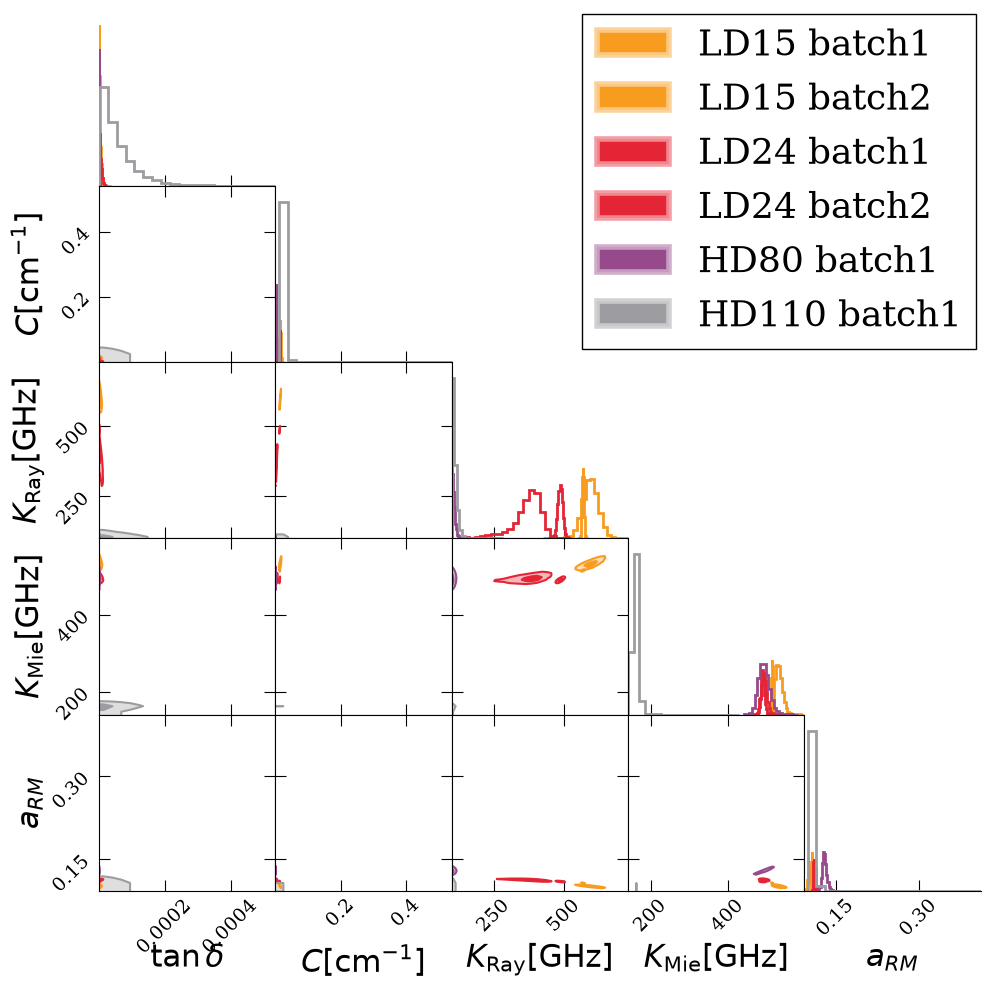

In [48]:
param_names = [r'$\tan\delta$', r'$C [\mathrm{cm}^{-1}]$', r'$K_{\mathrm{Ray}} [\mathrm{GHz}]$', r'$K_{\mathrm{Mie}} [\mathrm{GHz}]$', r'$a_{RM}$']

plot_batches = ['LD15_batch1', 'LD15_batch2', 'LD24_batch1', 'LD24_batch2', 'HD80_batch1', 'HD110_batch1'] 

figure = plt.figure(figsize=(10,10))

for bname, b in comb_batches.items():
    if bname not in plot_batches:
        continue

    samples      = b['samples']
    color        = b['color']

    hatch = '//' if 'batch2' in bname and bname in other_zote_keys else None

    fig = corner.corner(samples, 
                    show_titles=False, 
                    labels = param_names,            
                    use_math_text = True,
                    label_kwargs={"fontsize": 22},
                    max_n_ticks=3,
                    plot_datapoints=False,
                    show_median=False,
                    show_mean=False,
                    plot_density=False,
                    levels=[0.393, 0.864],
                    fill_contours=True,
                    color=color,
                    hist_kwargs={"linewidth": 2},
                    # contourf_kwargs={"hatches": [hatch, hatch, hatch]},
                    fig=figure)

for i, ax in enumerate(fig.axes):
    ax.tick_params(axis='both', labelsize=14)
    if i == 0:
        ax.spines['left'].set_visible(False)
    row, col = divmod(i, len(param_names))
    if col < row:
        ax.xaxis.set_tick_params(which='both', direction='in', top=True)
        ax.yaxis.set_tick_params(which='both', direction='in', right=True)
    if col == row:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_facecolor('white')

figure.canvas.draw()

for ax in figure.get_axes():
    if ax.xaxis.get_offset_text().get_text() != '':
        offset = ax.xaxis.get_offset_text().get_text()
        ax.set_xlabel(ax.get_xlabel() + f' {offset}', fontsize=22)
        ax.xaxis.get_offset_text().set_visible(False)
        
    if ax.yaxis.get_offset_text().get_text() != '':
        offset = ax.yaxis.get_offset_text().get_text()
        ax.set_ylabel(ax.get_ylabel() + f' {offset}', fontsize=22)
        ax.yaxis.get_offset_text().set_visible(False)

handles = get_corner_handles(plot_batches)


fig.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.98, 0.98), fontsize=26, edgecolor='black', facecolor='white', framealpha=1, fancybox=False)

fig.subplots_adjust(hspace=0, wspace=0)
plt.gcf().set_facecolor('white')
# plt.savefig('styro_params-b.pdf', bbox_inches='tight', facecolor='white')
plt.show()

PP35 0.32 cm


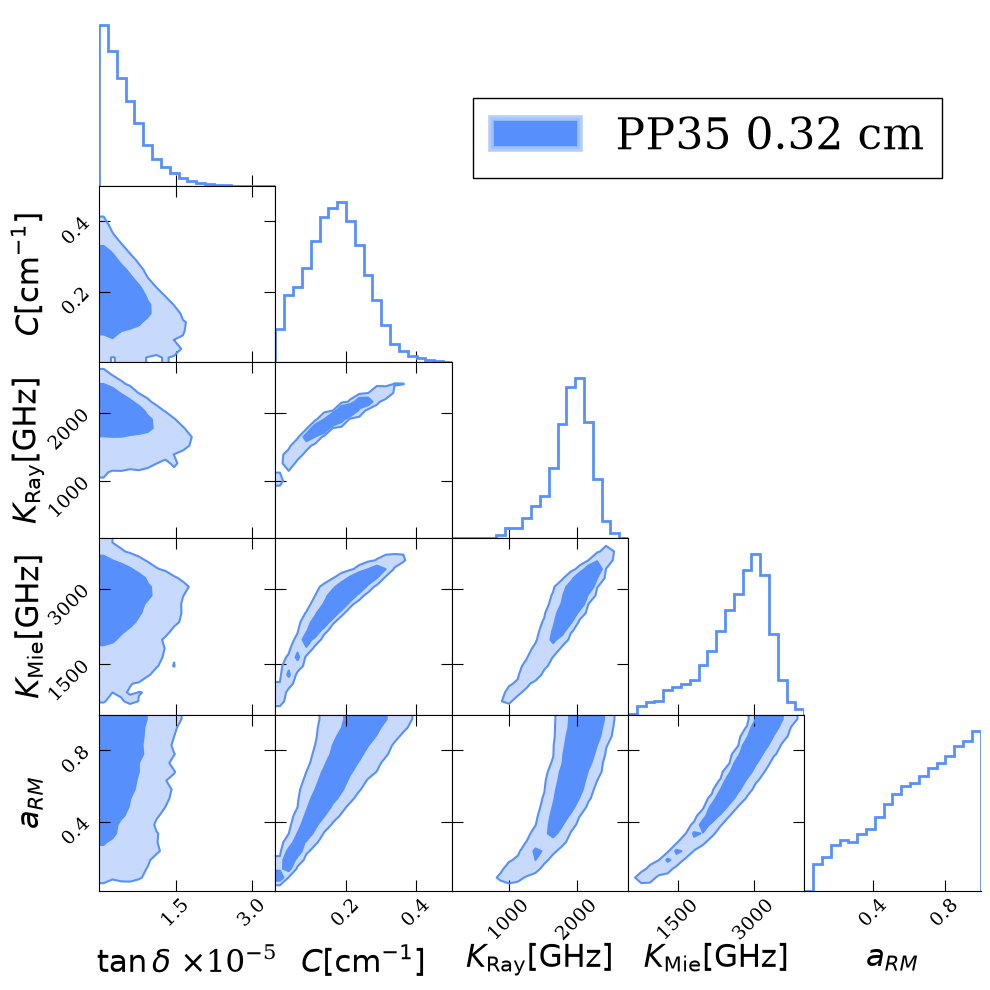

In [49]:
param_names = [r'$\tan\delta$', r'$C [\mathrm{cm}^{-1}]$', r'$K_{\mathrm{Ray}} [\mathrm{GHz}]$', r'$K_{\mathrm{Mie}} [\mathrm{GHz}]$', r'$a_{RM}$']

figure = plt.figure(figsize=(10,10))

for bname, b in comb_batches.items():
    if bname != 'PP35 0.32 cm':
        continue

    print(bname)

    samples      = b['samples']
    color        = b['color']

    fig = corner.corner(samples, 
                    show_titles=False, 
                    labels = param_names,            
                    use_math_text = True,
                    label_kwargs={"fontsize": 22},
                    max_n_ticks=3,
                    plot_datapoints=False,
                    show_median=False,
                    show_mean=False,
                    plot_density=False,
                    levels=[0.68, 0.95],
                    fill_contours=True,
                    color=color,
                    hist_kwargs={"linewidth": 2},
                    fig=figure)

for i, ax in enumerate(fig.axes):
    ax.tick_params(axis='both', labelsize=14)
    if i == 0:
        ax.spines['left'].set_visible(False)
    row, col = divmod(i, len(param_names))
    if col < row:
        ax.xaxis.set_tick_params(which='both', direction='in', top=True)
        ax.yaxis.set_tick_params(which='both', direction='in', right=True)
    if col == row:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_facecolor('white')

figure.canvas.draw()

for ax in figure.get_axes():
    if ax.xaxis.get_offset_text().get_text() != '':
        offset = ax.xaxis.get_offset_text().get_text()
        ax.set_xlabel(ax.get_xlabel() + f' {offset}', fontsize=22)
        ax.xaxis.get_offset_text().set_visible(False)
        
    if ax.yaxis.get_offset_text().get_text() != '':
        offset = ax.yaxis.get_offset_text().get_text()
        ax.set_ylabel(ax.get_ylabel() + f' {offset}', fontsize=22)
        ax.yaxis.get_offset_text().set_visible(False)

handles = get_corner_handles(['PP35 0.32 cm'])

fig.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.95, 0.90), fontsize=32, edgecolor='black', facecolor='white', framealpha=1, fancybox=False)

fig.subplots_adjust(hspace=0, wspace=0)
plt.gcf().set_facecolor('white')
# plt.savefig('styro_params-b.pdf', bbox_inches='tight', facecolor='white')
plt.show()

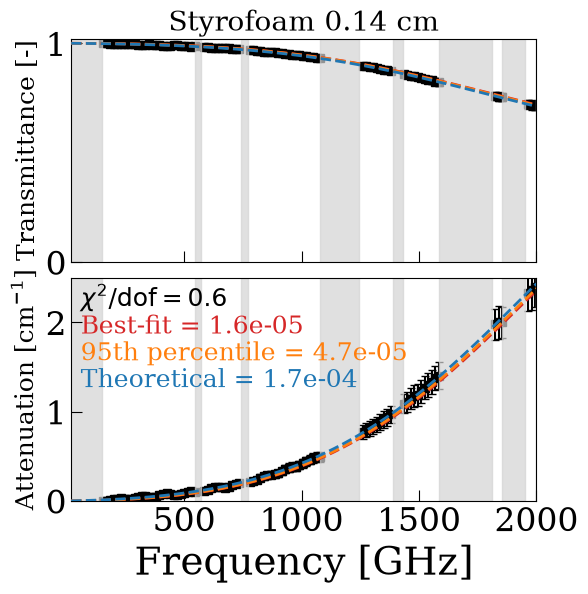

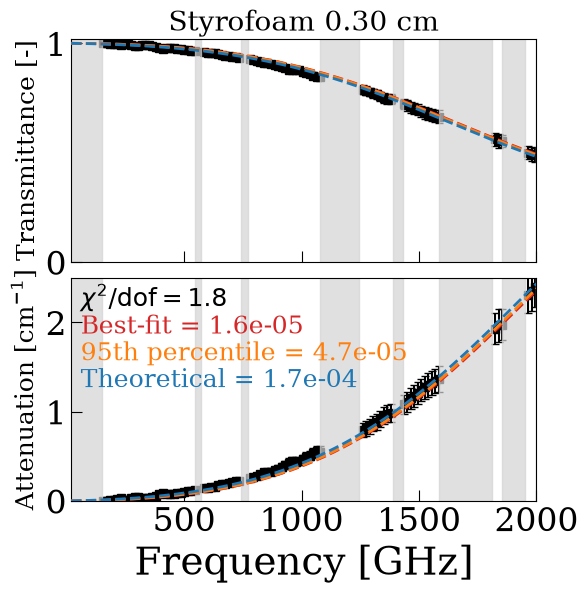

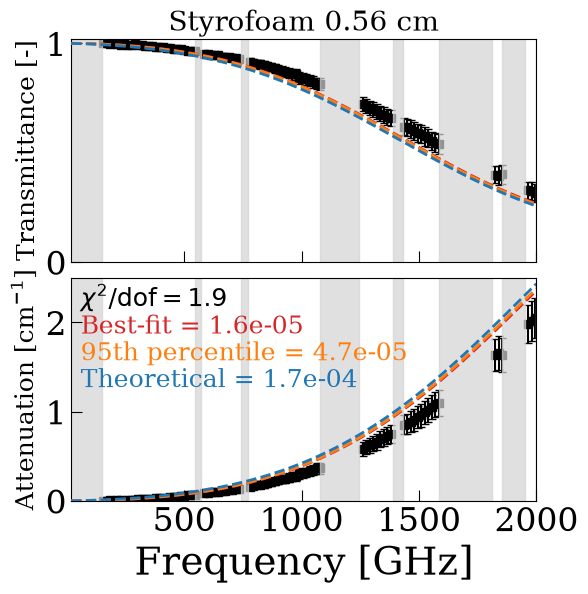

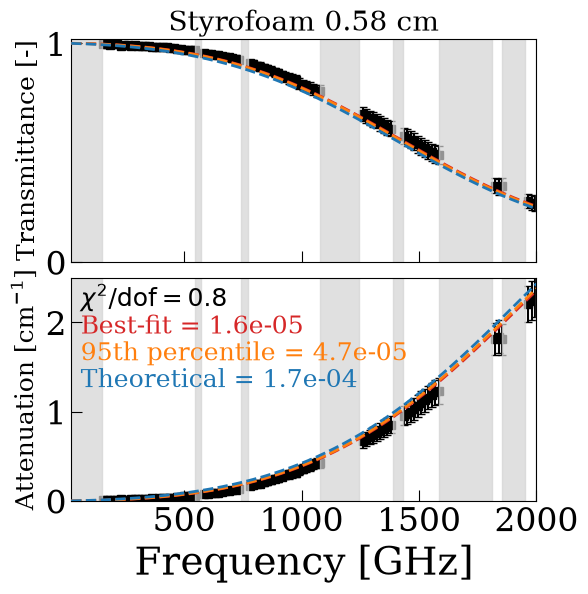

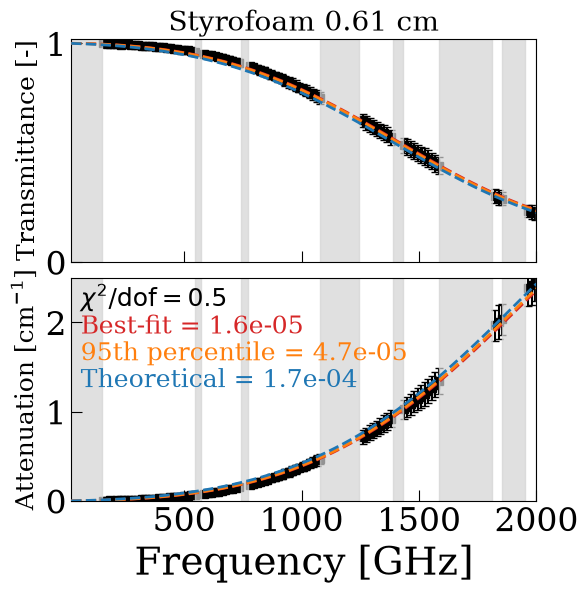

...

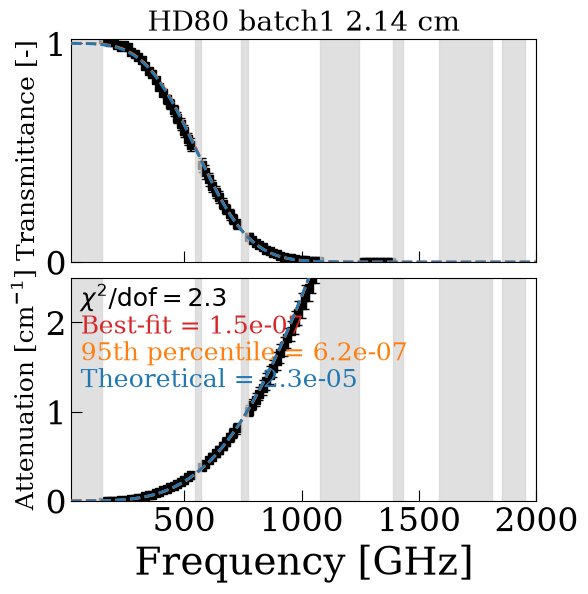

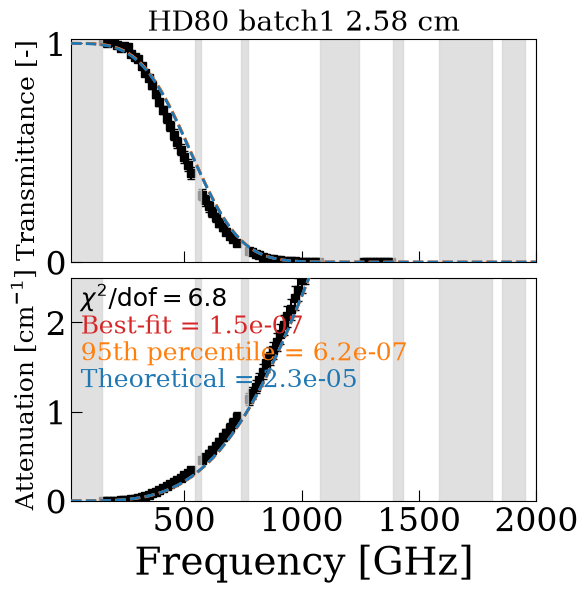

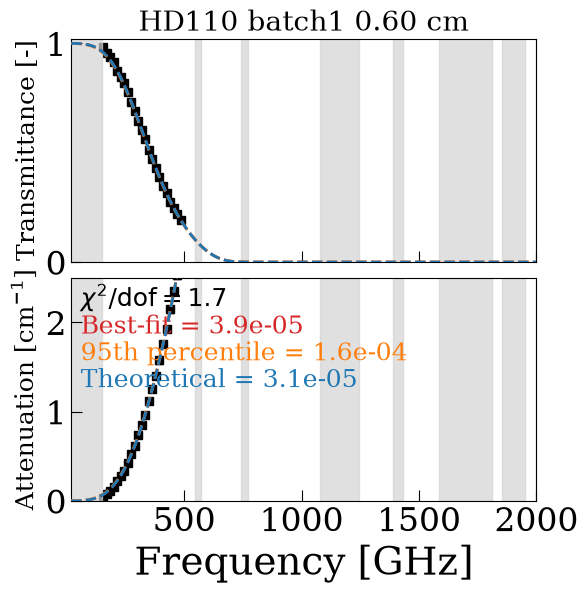

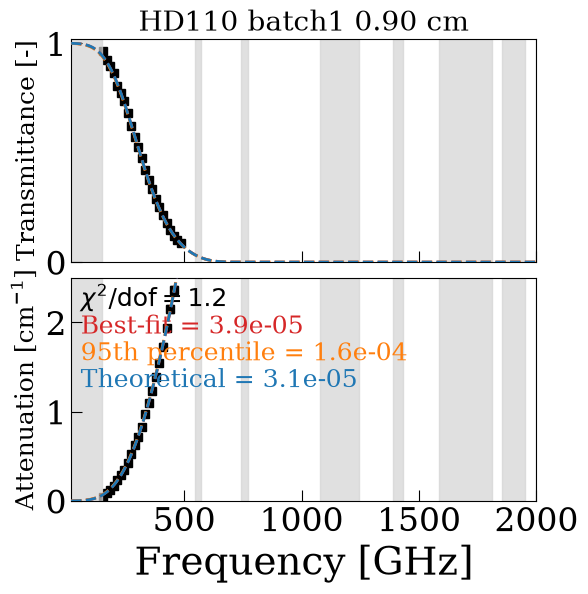

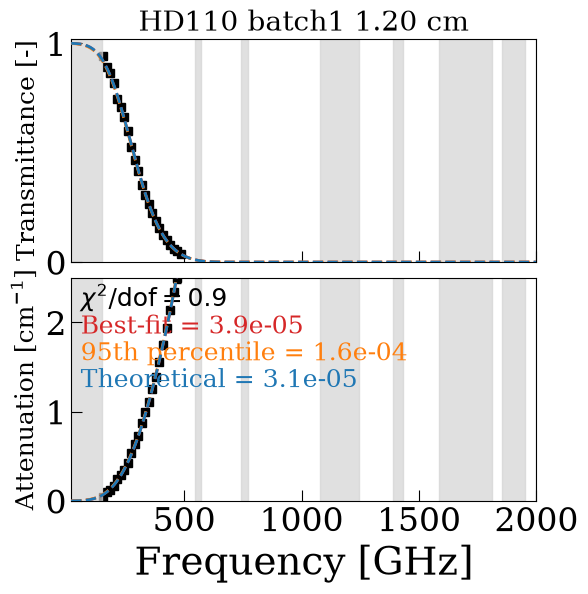

In [50]:
for bname, b in batches.items():
    # if bname != 'HD110_batch1':
    #     continue
    for j, sample in enumerate(b):
        fig, axes = plt.subplots(2, 1, figsize=(6, 6), sharex=True, sharey='row')
        ax0, ax1 = axes

        plt.xlim(20, 2000)
        ax0.set_ylim(0, 1.02)
        ax1.set_ylim(0, 2.5)

        ax0.set_ylabel('Transmittance [-]', fontsize=18)
        ax1.set_ylabel('Attenuation [cm$^{-1}$]', fontsize=18)

        lw = 3

        ax1.set_xlabel('Frequency [GHz]', fontsize=28)

        f_          = b[sample]['f_binned']
        t           = b[sample]['t_binned']
        alpha       = b[sample]['alpha_binned']
        err         = b[sample]['err_tot']
        width       = b[sample]['width']
        alpha_err   = err/(width * t)
        color       = b[sample]['color']


        mask   = b[sample]['mask']
        boxnum = b[sample]['boxnum']

        min_len = min(len(b[sample]['alpha']) for sample in b)

        ns_T = IRBF_njit(f_, comb_batches[bname]['params'], width, n_eff)
        redchi2 = float(np.sum((ns_T - t) ** 2 / err ** 2)) / (len(f_) - 5)

        ax0.errorbar(f_, t, yerr=err, color='k', fmt='s', ms=6, capsize=3, zorder=-10)
        ax1.errorbar(f_, alpha, yerr=alpha_err, color='k', fmt='s', ms=6, capsize=3, label='Data', zorder=-10)

        ns_alpha = comb_batches[bname]['ns_alpha']
        ns_T     = np.exp(-width*ns_alpha)

        ax0.plot(f, ns_T, color='tab:red', linestyle='--', label='Best fit', lw=2, zorder=10)

        ax1.plot(f, ns_alpha, color='tab:red', linestyle='--', label='Best fit', lw=2, zorder=10)

        params     = comb_batches[bname]['params']
        n_eff      = comb_batches[bname]['n_eff']
        lt_nominal = comb_batches[bname]['upper_params'][0]
        lt_est     = comb_batches[bname]['lt']

        alpha_nominal   = IRBF_alpha_njit(f, [lt_nominal, *params[1:]], n_eff)
        alpha_est       = IRBF_alpha_njit(f, [lt_est, *params[1:]], n_eff)

        T_nominal       = np.exp(-width*alpha_nominal)
        T_est           = np.exp(-width*alpha_est)

        ax0.plot(f, T_nominal, color='tab:orange', linestyle='--', label=r'$2\sigma$ nominal $\tan\delta$', lw=2, zorder=10)
        ax0.plot(f, T_est, color='tab:blue', linestyle='--', label=r'theoretical $\tan\delta$', lw=2, zorder=10)

        ax1.plot(f, alpha_nominal, color='tab:orange', linestyle='--', label=r'$2\sigma$ nominal $\tan\delta$', lw=2, zorder=10)
        ax1.plot(f, alpha_est, color='tab:blue', linestyle='--', label=r'Theoretical $\tan\delta$', lw=2, zorder=10)

        for ax in axes:
            for i, j in zip(mask_starts, mask_stops):
                ax.axvspan(i, j, color='lightgray', alpha=0.7)

        handles = ax1.get_legend_handles_labels()[0]

        # fig.legend(handles=handles, fontsize=20, frameon=True, bbox_to_anchor=(0.9, 0.5), loc='center left', ncol=1)

        ax0.set_yticks([0, 1])
        ax1.set_yticks([0, 1, 2])
        
        ax0.set_title(rf'{sample}', fontsize=20)
        ax1.annotate(rf'$\chi^2/{{\rm dof}}={redchi2:.1f}$', xy=(0.02, 0.87), ha='left', xycoords='axes fraction', fontsize=18)
        ax1.annotate(f'Best-fit = {params[0]:.1e}', xy=(0.02, 0.75), ha='left', color='tab:red', xycoords='axes fraction', fontsize=18)
        ax1.annotate(rf'95th percentile = {lt_nominal:.1e}', xy=(0.02, 0.63), ha='left', color='tab:orange', xycoords='axes fraction', fontsize=18)
        ax1.annotate(rf'Theoretical = {lt_est:.1e}', xy=(0.02, 0.51), ha='left', color='tab:blue', xycoords='axes fraction', fontsize=18)

        plt.gcf().set_facecolor('white')
        plt.subplots_adjust(wspace=0.07, hspace=0.07)
        plt.show()

<>:38: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
<>:38: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
C:\Users\alexg\AppData\Local\Temp\ipykernel_480\877727536.py:38: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
  ax.axvline(sigma_hn, color='C4', ls='-.', lw=1.5, label=f'$\sigma$ of half-Gauss: {sigma_hn:.2e}')


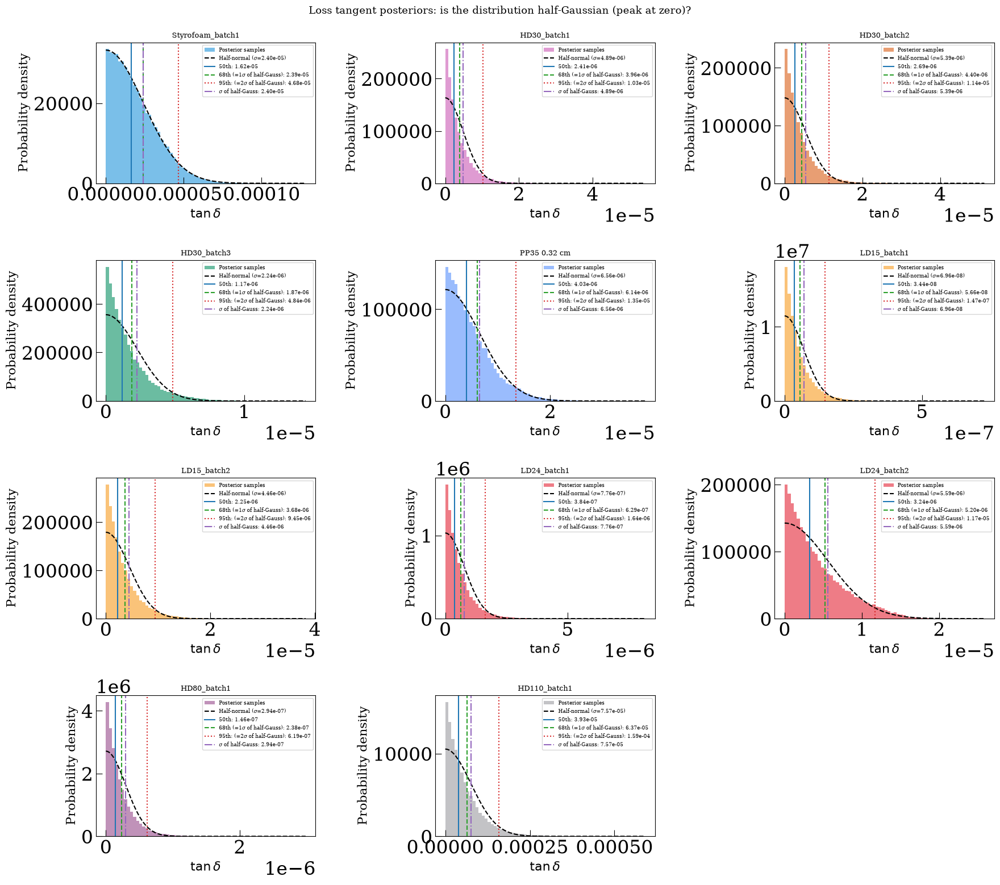

Batch                                   Median       68th       95th  95/68 ratio
--------------------------------------------------------------------------------------------
Styrofoam_batch1                      1.62e-05   2.39e-05   4.68e-05        1.953
HD30_batch1                           2.41e-06   3.96e-06   1.03e-05        2.603
HD30_batch2                           2.69e-06   4.40e-06   1.14e-05        2.601
HD30_batch3                           1.17e-06   1.87e-06   4.84e-06        2.585
PP35 0.32 cm                          4.03e-06   6.14e-06   1.35e-05        2.196
LD15_batch1                           3.44e-08   5.66e-08   1.47e-07        2.599
LD15_batch2                           2.25e-06   3.68e-06   9.45e-06        2.571
LD24_batch1                           3.84e-07   6.29e-07   1.64e-06        2.609
LD24_batch2                           3.24e-06   5.20e-06   1.17e-05        2.253
HD80_batch1                           1.46e-07   2.38e-07   6.19e-07        2.597
HD110

In [51]:
# Loss tangent posterior histograms
# Check whether each batch posterior is a half-Gaussian (Gaussian centered at zero)
# and whether the 86th percentile is the appropriate 1-sigma upper bound.
#
# Key fact: for a half-Gaussian (Gaussian centered at 0, positive-only samples),
#   68th percentile = 1*sigma of the underlying Gaussian
#   95th percentile = 2*sigma 
# So if the posterior truly peaks at zero, 95th/68th = 2.

from scipy.stats import halfnorm
import matplotlib.pyplot as plt
import numpy as np

n = len(comb_batches)
ncols = 3
nrows = (n + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 4*nrows))
axes = np.array(axes).flatten()

for ax, (bname, b) in zip(axes, comb_batches.items()):
    lt_samps = b['samples'][:, 0]

    p50, p68, p95 = np.percentile(lt_samps, [50, 68, 95])

    ax.hist(lt_samps, bins=60, density=True,
            color=b.get('color', 'C0'), alpha=0.6, label='Posterior samples')

    # Half-normal fit: MLE sigma = sqrt(mean(x^2))
    sigma_hn = np.sqrt(np.mean(lt_samps**2))
    x = np.linspace(0, lt_samps.max() * 1.1, 600)
    ax.plot(x, halfnorm.pdf(x, scale=sigma_hn), 'k--', lw=1.5,
            label=fr'Half-normal ($\sigma$={sigma_hn:.2e})')

    ax.axvline(p50, color='C0', ls='-',  lw=1.5, label=f'50th: {p50:.2e}')
    ax.axvline(p68, color='C2', ls='--', lw=1.5, label=f'68th (=1$\\sigma$ of half-Gauss): {p68:.2e}')
    ax.axvline(p95, color='C3', ls=':',  lw=1.5, label=f'95th: (=2$\\sigma$ of half-Gauss): {p95:.2e}')
    ax.axvline(sigma_hn, color='C4', ls='-.', lw=1.5, label=f'$\sigma$ of half-Gauss: {sigma_hn:.2e}')

    ax.set_title(bname, fontsize=9)
    ax.set_xlabel(r'$\tan\delta$', fontsize=16)
    ax.set_ylabel('Probability density', fontsize=16)
    ax.legend(fontsize=6.5, loc='upper right')

for ax in axes[n:]:
    ax.set_visible(False)

plt.suptitle('Loss tangent posteriors: is the distribution half-Gaussian (peak at zero)?', fontsize=13)
plt.tight_layout()
plt.savefig('lt_posterior_histograms.pdf', bbox_inches='tight', facecolor='white')
plt.show()

# Summary table
print(f"{'Batch':<35} {'Median':>10} {'68th':>10} {'95th':>10} {'95/68 ratio':>12}")
print("-"*92)
for bname, b in comb_batches.items():
    lt_samps = b['samples'][:, 0]
    p50, p68, p95 = np.percentile(lt_samps, [50, 68, 95])
    ratio = p95 / p68 if p68 > 0 else float('nan')
    print(f"{bname:<35} {p50:>10.2e} {p68:>10.2e} {p95:>10.2e} {ratio:>12.3f}")

print("For a perfect half-Gaussian: ratio 95th/68th ~ 2")
print("If ratio is near 2, the posterior is well-described as half-Gaussian.")
print("In that case: 68th percentile = 1-sigma upper; 95th percentile = 2-sigma upper.")


In [52]:
print(comb_batches['LD24_batch2']['params'])

[3.23928315e-06 3.85945866e-03 3.78247877e+02 4.93130850e+02
 1.12634834e-01]


In [53]:
print(comb_batches['HD30_batch1']['params'])
print(comb_batches['HD30_batch3']['params'])

[2.40637822e-06 1.73213926e-02 4.05703490e+02 4.88107102e+02
 1.13677617e-01]
[1.16620817e-06 2.22253085e-03 2.92542145e+02 4.99559644e+02
 1.14056684e-01]


# 2 THz Comparison: LD24 vs Styrofoam vs PP35

In [54]:
## LD24 vs Styrofoam vs PP35 at 2 THz (f = 2000 GHz, the top of the measured band)
idx_2thz = np.argmin(np.abs(f - 2000))
print(f"Nearest sampled frequency to 2 THz: {f[idx_2thz]:.0f} GHz\n")

def alpha_at_2thz(bname):
    """Total attenuation coefficient [1/cm] at 2 THz: median with 1-sigma bounds."""
    b = comb_batches[bname]
    lo, med, up = b['alpha_lower'][idx_2thz], b['ns_alpha'][idx_2thz], b['alpha_upper'][idx_2thz]
    return med, med - lo, up - med

def T5cm_at_2thz(bname):
    """5 cm-assembly transmission at 2 THz: median with 1-sigma bounds."""
    b = comb_batches[bname]
    T_lower, T_med, T_upper = b['T_lower_5cm'][idx_2thz], b['ns_T_5cm'][idx_2thz], b['T_upper_5cm'][idx_2thz]
    return T_med, T_med - T_lower, T_upper - T_med

materials = {
    'Styrofoam': 'Styrofoam_batch1',
    'LD24':      'LD24_batch2',
    'PP35':      'PP35 0.32 cm',
}

for name, bname in materials.items():
    a, a_lo, a_up = alpha_at_2thz(bname)
    T, T_lo, T_up = T5cm_at_2thz(bname)
    print(f"{name:<10} @ 2 THz: alpha = {a:.3f} +{a_up:.3f}/-{a_lo:.3f} 1/cm  |  T(5 cm) = {100*T:.2f} +{100*T_up:.2f}/-{100*T_lo:.2f} %")

def compare(name1, name2):
    a1, a1_lo, a1_up = alpha_at_2thz(materials[name1])
    a2, a2_lo, a2_up = alpha_at_2thz(materials[name2])
    T1, T1_lo, T1_up = T5cm_at_2thz(materials[name1])
    T2, T2_lo, T2_up = T5cm_at_2thz(materials[name2])

    a_diff    = a1 - a2
    a_diff_lo = np.sqrt(a1_lo**2 + a2_up**2)
    a_diff_up = np.sqrt(a1_up**2 + a2_lo**2)

    T_diff    = 100 * (T1 - T2)
    T_diff_lo = 100 * np.sqrt(T1_lo**2 + T2_up**2)
    T_diff_up = 100 * np.sqrt(T1_up**2 + T2_lo**2)

    print(f"\n{name1} vs {name2} @ 2 THz:")
    print(f"  Delta alpha  = {a_diff:+.3f} +{a_diff_up:.3f}/-{a_diff_lo:.3f} 1/cm "
          f"({name1} is {'more' if a_diff > 0 else 'less'} lossy per cm than {name2})")
    print(f"  Delta T(5cm) = {T_diff:+.2f} +{T_diff_up:.2f}/-{T_diff_lo:.2f} percentage points "
          f"({name1} transmits {'more' if T_diff > 0 else 'less'} than {name2} through a 5 cm assembly)")

compare('LD24', 'Styrofoam')
compare('PP35', 'Styrofoam')
compare('PP35', 'LD24')

Nearest sampled frequency to 2 THz: 2000 GHz

Styrofoam  @ 2 THz: alpha = 2.356 +0.038/-0.036 1/cm  |  T(5 cm) = 0.00 +0.00/-0.00 %
LD24       @ 2 THz: alpha = 0.874 +0.014/-0.014 1/cm  |  T(5 cm) = 1.27 +0.09/-0.09 %
PP35       @ 2 THz: alpha = 0.174 +0.002/-0.002 1/cm  |  T(5 cm) = 41.88 +0.52/-0.51 %

LD24 vs Styrofoam @ 2 THz:
  Delta alpha  = -1.482 +0.038/-0.040 1/cm (LD24 is less lossy per cm than Styrofoam)
  Delta T(5cm) = +1.26 +0.09/-0.09 percentage points (LD24 transmits more than Styrofoam through a 5 cm assembly)

PP35 vs Styrofoam @ 2 THz:
  Delta alpha  = -2.182 +0.036/-0.038 1/cm (PP35 is less lossy per cm than Styrofoam)
  Delta T(5cm) = +41.88 +0.52/-0.51 percentage points (PP35 transmits more than Styrofoam through a 5 cm assembly)

PP35 vs LD24 @ 2 THz:
  Delta alpha  = -0.700 +0.014/-0.014 1/cm (PP35 is less lossy per cm than LD24)
  Delta T(5cm) = +40.61 +0.53/-0.52 percentage points (PP35 transmits more than LD24 through a 5 cm assembly)
